# Notebook to generate final plots
## <a id="Plots_index">Plots index:</a>
- [Observed Hours Example](#Observed_Hours)
- [Some Observed Hours Results](#Some_Observed_Hours_Results)
- [Some Hexbin Density Histograms](#Some_Hexbin)
- [Scatter Metrics for Model Outputs](#Scatter_Metrics_for_Model_Outputs)
  - MAE, RMSE, R2, Correlation Index, Index of Agreement
- [Bar Charts Averaging Metrics over Stations](#Bar_Charts_Averaging_Metrics_over_Stations)
  - MAE, RMSE, R2, Correlation Index, Index of Agreement
- [Bar Charts Averaging Metrics over Hours](#Bar_Charts_Averaging_Metrics_over_Hours)
  - MAE, RMSE, R2, Correlation Index, Index of Agreement
- [Scatter Plots of 24h Error Graphics](#Scatter_Plots_of_24h_Error_Graphics)
  - Max, Average
- [Bar Charts of 24h Errors over Stations](#Bar_Charts_of_24h_Errors_over_Stations)
  - Max, Average
- [Results_df Table](#Results_df_Table)
- [Histogram Fit](#Histogram_Fit)
- [Overall Results Table](#Overall_Results_Table)


In [1]:
# Variable params
string_test = "4paper_test01_15x3_5btsp_24ph_v20"
hours_before = 24 # How many hours of pollution data are we adding as input to the model (current - hours_before)
bootstrap = True
boostrap_factor = 15  # Number of times to repeat the bootstrap
boostrap_threshold = 2.9
meteo_vars = True

In [2]:
# Fixed params

import os
def create_folder(output_folder):
    """
    It creates a folder only if it doesn't exist
    Args:
        output_folder:
    """
    if not(os.path.exists(output_folder)):
        os.makedirs(output_folder)


In [3]:
import os
import pickle
import sys
import time
from datetime import date, datetime, timedelta

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
from pandas import DataFrame
from sklearn import preprocessing

from ai_common.constants.AI_params import NormParams, TrainingParams, ModelParams
import ai_common.training.trainingutils as utilsNN
from ai_common.models.modelSelector import select_1d_model
from conf.MakeWRF_and_DB_CSV_UserConfiguration import getPreprocWRFParams
from conf.TrainingUserConfiguration import getTrainingParams
from conf.localConstants import constants
from conf.params import LocalTrainingParams, PreprocParams
from os.path import join
from proj_io.inout import create_folder, add_forecasted_hours, add_previous_hours, filter_data, get_column_names, read_merged_files, save_columns
from proj_preproc.preproc import apply_bootstrap, normalizeData
from viz.figure_generator import plot_input_output_data


# Filtering warnings:
import warnings

warnings.filterwarnings("ignore", message="DataFrame is highly fragmented")
warnings.simplefilter(action='ignore', category=pd.core.common.SettingWithCopyWarning)
warnings.filterwarnings('ignore', category=RuntimeWarning)
warnings.filterwarnings('ignore', 'SettingWithCopyWarning')
warnings.filterwarnings('ignore', category=FutureWarning)
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # 0 = all messages, 1 = filter out INFO, 2 = filter out WARNING and INFO, 3 = filter out ERROR, WARNING, and INFO



In [4]:
# Imports extra visualización, para editar o arreglar:
#from viz_utils.eoa_viz import EOAImageVisualizer
from AI.data_generation.utilsDataFormat import *
from os import listdir
import glob
import seaborn as sns
from matplotlib.colors import LogNorm
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error, r2_score
from copy import deepcopy
from proj_preproc.preproc import loadScaler, extract_model_name
from proj_prediction.prediction import analyze_column, scatter_plot_by_column, compile_scaler, average_metric, average_metric_by_hour, analyze_multi_hour_plot, plot_max_difference, plot_forecast_hours, plot_max_and_mean_difference, calculate_imeca

from copy import copy
from conf.TrainingUserConfiguration import get_makeprediction_config
from ai_common.constants.AI_params import *
from AI.data_generation.utilsDataFormat import *



In [5]:
# In case we want to save the columns to temporal files for debugging purposes
os.environ["CUDA_VISIBLE_DEVICES"] = "0,1,2,3"

In [6]:
config = getTrainingParams()
stations = config[LocalTrainingParams.stations]
pollutants = config[LocalTrainingParams.pollutants]
start_year = 2010
end_year = 2019
cur_pollutant = 'otres'
cur_station = 'MER'

input_folder = config[TrainingParams.input_folder]
output_folder = config[TrainingParams.output_folder]
output_folder = join(output_folder,F"{string_test}_{start_year}_{end_year}")
val_perc = config[TrainingParams.validation_percentage]
test_perc = config[TrainingParams.test_percentage]
eval_metrics = config[TrainingParams.evaluation_metrics]
loss_func = config[TrainingParams.loss_function]
batch_size = config[TrainingParams.batch_size]
epochs = config[TrainingParams.epochs]
model_name_user = config[TrainingParams.config_name]
optimizer = config[TrainingParams.optimizer]
forecasted_hours = config[LocalTrainingParams.forecasted_hours]
norm_type = config[TrainingParams.normalization_type]

split_info_folder = join(output_folder, 'Splits')
parameters_folder = join(output_folder, 'Parameters')
weights_folder = join(output_folder, 'models')
logs_folder = join(output_folder, 'logs')
imgs_folder= join(output_folder, 'imgs')
norm_folder = join(output_folder, 'norm')

create_folder(split_info_folder)
create_folder(parameters_folder)
create_folder(weights_folder)
create_folder(logs_folder)
create_folder(norm_folder)
create_folder(imgs_folder)


# Evaluation

In [7]:
training_results_folder = '/ZION/AirPollutionData/Data/TrainingTestsPS/4paper_test01_15x3_5btsp_24ph_v20_2010_2019'
INPUT_SIZE = 3450 #copy(config[ModelParams.INPUT_SIZE])


In [8]:
print(training_results_folder,INPUT_SIZE, sep="\n")


/ZION/AirPollutionData/Data/TrainingTestsPS/4paper_test01_15x3_5btsp_24ph_v20_2010_2019
3450


from viz.figure_generator import plot_input_output_data
from ai_common.constants.AI_params import *
from conf.TrainingUserConfiguration import get_makeprediction_config
from AI.data_generation.utilsDataFormat import *


In [9]:
#%%

#from viz.figure_generator import plot_input_output_data
# sys.path.append('./eoas_pyutils')  # Doesn't work when using a conda env outside home

#sys.path.append('/home/olmozavala/air_pollution_forecast/eoas_pyutils')


#from viz_utils.eoa_viz import EOAImageVisualizer
#from sklearn import preprocessing
#from conf.localConstants import constants
#from pandas import DataFrame
#import pandas as pd
#import time
#from ai_common.constants.AI_params import *
#from os.path import join
#from conf.params import LocalTrainingParams

#from conf.TrainingUserConfiguration import get_makeprediction_config
#from io_utils.io_common import  create_folder
#from AI.data_generation.utilsDataFormat import *
#from ai_common.models.modelSelector import select_1d_model

#from os import listdir
#import glob
#import os
#import pandas as pd
#import numpy as np

#import seaborn as sns
#import matplotlib
#matplotlib.use('Agg')  # Configurar Matplotlib para usar el backend 'Agg' para suprimir mostrar ventanas, al corrern en batchmode

#import matplotlib.pyplot as plt
#from matplotlib.colors import LogNorm
#from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error, r2_score
#from copy import deepcopy

#from proj_io.inout import filter_data, add_previous_hours, add_forecasted_hours, get_column_names
#from proj_preproc.preproc import loadScaler, extract_model_name
#from proj_prediction.prediction import analyze_column, scatter_plot_by_column, compile_scaler, average_metric, average_metric_by_hour, analyze_multi_hour_plot, plot_max_difference, plot_forecast_hours
#from proj_prediction.prediction import analyze_column, scatter_plot_by_column, compile_scaler, average_metric, average_metric_by_hour, analyze_multi_hour_plot, plot_max_difference, plot_forecast_hours, plot_max_and_mean_difference, calculate_imeca


In [10]:
# HARDCODING OUTPUT FOLDER
# In case we want to save the columns to temporal files for debugging purposes
#os.environ["CUDA_VISIBLE_DEVICES"] = ""

config = get_makeprediction_config()
# *********** Reads the parameters ***********

input_file = config[ClassificationParams.input_file]
output_folder = f'{config[ClassificationParams.output_folder]}_testEvaluation'
output_imgs_folder = config[ClassificationParams.output_imgs_folder]
output_file_name = config[ClassificationParams.output_file_name]
model_weights_file = config[ClassificationParams.model_weights_file]
forecasted_hours = config[LocalTrainingParams.forecasted_hours]
pollutant = config[LocalTrainingParams.pollutants][0]

# ********** Reading and preprocessing data *******
all_stations = [
    "UIZ", "AJU", "ATI", "CUA", "SFE", "SAG", "CUT", "PED", "TAH", "GAM",
    "IZT", "CCA", "HGM", "LPR", "MGH", "CAM", "FAC", "TLA", "MER", "XAL",
    "LLA", "TLI", "UAX", "BJU", "MPA", "MON", "NEZ", "INN", "AJM", "VIF"
]

evaluate_stations = ["UIZ", "AJU", "ATI", "UAX"]
evaluate_hours = [1, 6, 12, 18, 24]

# Iterate over the stations
models_folder = '/ZION/AirPollutionData/Data/Training/cont_otres_UIZ/models/'
data_folder = '/ZION/AirPollutionData/Data/MergedDataCSV/16/'

test_year = 2019
# %%
# cur_station is now a fixed value
cur_station = 'MER'

# No need for a loop here
# try:

# %% Para arreglar variables hardcodeadas:
# %% Extract model name from weights file_names.hdf5
models_path = join(training_results_folder, 'models')
model_name = extract_model_name(models_path)
print(model_name)

#model_name = 'TestOZ_otres_2023_07_25_18_56'
# file with testing data
hardcoded_input_file = '/ZION/AirPollutionData/Data/MergedDataCSV/16/2019_AllStations.csv'

# path to normalization data
norm_folder = join(training_results_folder,'norm')

imgs_folder = training_results_folder

path_csvs = training_results_folder

#hours_before = 0 # now it is readed from training...

print(f"""training_results_folder:{training_results_folder}
model_name:{model_name}
hardcoded_input_file:{hardcoded_input_file}
norm_folder:{norm_folder}
imgs_folder:{imgs_folder}
path_csvs:{path_csvs}
""")


print(f"""input_file:{input_file}
output_folder:{output_folder}
output_imgs_folder:{output_imgs_folder}
output_file_name:{output_file_name}
model_weights_file:{model_weights_file}
forecasted_hours:{forecasted_hours}
pollutant:{pollutant}
""")


TestsPS_4paper_otres_2023_11_14_01_33
training_results_folder:/ZION/AirPollutionData/Data/TrainingTestsPS/4paper_test01_15x3_5btsp_24ph_v20_2010_2019
model_name:TestsPS_4paper_otres_2023_11_14_01_33
hardcoded_input_file:/ZION/AirPollutionData/Data/MergedDataCSV/16/2019_AllStations.csv
norm_folder:/ZION/AirPollutionData/Data/TrainingTestsPS/4paper_test01_15x3_5btsp_24ph_v20_2010_2019/norm
imgs_folder:/ZION/AirPollutionData/Data/TrainingTestsPS/4paper_test01_15x3_5btsp_24ph_v20_2010_2019
path_csvs:/ZION/AirPollutionData/Data/TrainingTestsPS/4paper_test01_15x3_5btsp_24ph_v20_2010_2019

input_file:/ZION/AirPollutionData/Data/MergedDataCSV/16/2015_cont_otres_AllStations.csv
output_folder:/ZION/AirPollutionData/Data/Results_testEvaluation
output_imgs_folder:/ZION/AirPollutionData/Data/Results/TestOZ
output_file_name:/ZION/AirPollutionData/TrainingTESTOZ/Results/TestOZ.csv
model_weights_file:/ZION/AirPollutionData/TrainingTESTOZ/models
forecasted_hours:24
pollutant:otres



In [11]:
# %% Definir o cargar los folder donde se exportaran imágenes y datos

output_results_folder = join(output_imgs_folder, model_name)
output_results_folder_img = join(output_results_folder, 'imgs')
output_results_folder_data = join(output_results_folder, 'data')

create_folder(output_results_folder)
create_folder(output_results_folder_img)
create_folder(output_results_folder_data)


In [12]:

model_name_user = config[TrainingParams.config_name]
print(model_name_user)
print(output_folder)


TestOZ
/ZION/AirPollutionData/Data/Results_testEvaluation


In [13]:

#%% Loading the best weight file on the weights folder

path_model_weights = join(f'{training_results_folder}',f'models')
print(path_model_weights)

model_weights_file = join(path_model_weights,f'{model_name}*')
weight_files = glob.glob(model_weights_file)
lista_weights =[]
for item in weight_files:
    lista_weights.append(float(item.split('/')[-1].split('-')[-1].split('.hdf5')[0]))
print(lista_weights)
model_weights_file = glob.glob(join(path_model_weights,f'{model_name}*{min(lista_weights)}*'))
model_weights_file = model_weights_file[0]
print(f'\nModel weight file to use of    {min(lista_weights)}: \n\n',model_weights_file)


/ZION/AirPollutionData/Data/TrainingTestsPS/4paper_test01_15x3_5btsp_24ph_v20_2010_2019/models
[0.6035378, 0.56642407, 0.5302577, 0.43525407, 0.36179197, 0.32665047, 0.31272238, 0.30621785, 0.30049142, 0.29688501, 0.29235762, 0.28878742, 0.28336212, 0.28049308, 0.27818382, 0.27597681, 0.27464828, 0.2721507, 0.27201834, 0.26983255, 0.26947716, 0.26739654, 0.26627365, 0.2655074, 0.26438257, 0.26381394, 0.26331496, 0.26196802, 0.26072904, 0.26069912, 0.26004851, 0.25991949, 0.25848687, 0.25844783]

Model weight file to use of    0.25844783: 

 /ZION/AirPollutionData/Data/TrainingTestsPS/4paper_test01_15x3_5btsp_24ph_v20_2010_2019/models/TestsPS_4paper_otres_2023_11_14_01_33-epoch-41-loss-0.25844783.hdf5


In [14]:
# Selects the proper model file for the current station
assert len(model_weights_file) > 0
assert len(input_file) > 0

print(F"Working with: {model_weights_file} and input: {input_file}")



Working with: /ZION/AirPollutionData/Data/TrainingTestsPS/4paper_test01_15x3_5btsp_24ph_v20_2010_2019/models/TestsPS_4paper_otres_2023_11_14_01_33-epoch-41-loss-0.25844783.hdf5 and input: /ZION/AirPollutionData/Data/MergedDataCSV/16/2015_cont_otres_AllStations.csv


In [15]:
#%% data test file
input_file = hardcoded_input_file
data = pd.read_csv(input_file, index_col=0)

In [16]:
# Remove meteo ?
import re
if not meteo_vars:
    regex_list = ['U10.*', 'V10.*','RAINC.*', 'T2.*', 'RAINNC.*', 'SWDOWN.*', 'GLW.*']
    filtered_data = data.filter(regex='^(?!(%s)).*$' % '|'.join(regex_list))
    print(filtered_data)
    data = filtered_data


In [17]:
#%% rehacer los datos del dataset test como en los hotvectors usados durante el training.


datetimes_str = data.index.values
datetimes = np.array([
    datetime.strptime(x, constants.datetime_format.value)
    for x in datetimes_str
])


In [18]:
# %% -------- Normalizing data
# loading of original scaler object
file_name_norm = join(norm_folder,F"{model_name}_scaler.pkl")  
scaler = loadScaler(file_name_norm)


In [19]:
# %% compiling a scale according to data
new_scaler_cols = data.columns.tolist()
old_features = scaler.feature_names_in_.tolist()
print(old_features)


['cont_otres_UIZ', 'cont_otres_AJU', 'cont_otres_ATI', 'cont_otres_CUA', 'cont_otres_SFE', 'cont_otres_SAG', 'cont_otres_CUT', 'cont_otres_PED', 'cont_otres_TAH', 'cont_otres_GAM', 'cont_otres_IZT', 'cont_otres_CCA', 'cont_otres_HGM', 'cont_otres_LPR', 'cont_otres_MGH', 'cont_otres_CAM', 'cont_otres_FAC', 'cont_otres_TLA', 'cont_otres_MER', 'cont_otres_XAL', 'cont_otres_LLA', 'cont_otres_TLI', 'cont_otres_UAX', 'cont_otres_BJU', 'cont_otres_MPA', 'cont_otres_MON', 'cont_otres_NEZ', 'cont_otres_INN', 'cont_otres_AJM', 'cont_otres_VIF', 'cont_pmco_UIZ', 'cont_pmco_SFE', 'cont_pmco_SAG', 'cont_pmco_PED', 'cont_pmco_GAM', 'cont_pmco_HGM', 'cont_pmco_MGH', 'cont_pmco_CAM', 'cont_pmco_TLA', 'cont_pmco_MER', 'cont_pmco_XAL', 'cont_pmco_BJU', 'cont_pmco_MPA', 'cont_pmco_INN', 'cont_pmco_AJM', 'cont_pmdoscinco_UIZ', 'cont_pmdoscinco_AJU', 'cont_pmdoscinco_SFE', 'cont_pmdoscinco_SAG', 'cont_pmdoscinco_PED', 'cont_pmdoscinco_GAM', 'cont_pmdoscinco_CCA', 'cont_pmdoscinco_HGM', 'cont_pmdoscinco_MGH

In [20]:
# %%
# Prefijo que deseas agregar
prefijo = 'plusfake_x_'
new_scaler_cols = [prefijo + elemento for elemento in new_scaler_cols]
new_scaler = compile_scaler(scaler,new_scaler_cols)

In [21]:
#%%
print("Normalizing data....")
data_norm_np = new_scaler.transform(data)
data_norm_df = DataFrame(data_norm_np, columns=data.columns, index=data.index)

print(data_norm_df)

Normalizing data....
                     cont_otres_UIZ  cont_otres_AJU  cont_otres_ATI  \
fecha                                                                 
2019-01-01 00:00:00             NaN             NaN             NaN   
2019-01-01 01:00:00             NaN             NaN             NaN   
2019-01-01 02:00:00             NaN             NaN             NaN   
2019-01-01 03:00:00       -0.868778       -0.760552       -0.986345   
2019-01-01 04:00:00       -0.868778       -0.760552       -0.986345   
...                             ...             ...             ...   
2019-12-31 20:00:00       -0.543884       -0.531581       -1.069433   
2019-12-31 21:00:00       -0.688281       -1.065846       -0.861714   
2019-12-31 22:00:00       -0.652182       -1.065846       -0.944801   
2019-12-31 23:00:00             NaN             NaN             NaN   
2020-01-01 00:00:00       -0.760480             NaN       -1.027889   

                     cont_otres_CUA  cont_otres_SFE  co

In [22]:
#%% Continuamos para obtener hotvector

# %% ====== Getting all the orignal columns by type
all_contaminant_columns, all_meteo_columns, all_time_colums = get_column_names(data_norm_df)

# %% ====== Remove columns for other pollutants


cur_pollutant = 'otres'
X_df = filter_data(data_norm_df, filter_type='single_pollutant',
                   filtered_pollutant=cur_pollutant) 

print(X_df.columns.values)
print(F'X {X_df.shape}, Memory usage: {X_df.memory_usage().sum()/1024**2:02f} MB')

# %% ====== Adding the previous hours of the pollutants as extra columns (all contaminants)
print(F"Building X and Y ....")
X_df = add_previous_hours(X_df, hours_before)

# %% ====== Adding the forecasted hours of the pollutants as the predicted column Y (specific contaminant)
print("\tAdding the forecasted hours of the pollutant as the predicted column Y...")
Y_df = add_forecasted_hours(X_df, cur_pollutant, range(1,forecasted_hours+1))

# %% Remove the first hours because Print the final shape of X and Y
X_df = X_df.iloc[hours_before:,:]
Y_df = Y_df.iloc[hours_before:,:]
print("Done!")

print(F'Original {data_norm_df.shape}')
print(F'X {X_df.shape}, Memory usage: {X_df.memory_usage().sum()/1024**2:02f} MB')
print(F'Y {Y_df.shape}, Memory usage: {Y_df.memory_usage().sum()/1024**2:02f} MB')


# %%
print("Removing time index...")
X_df.reset_index(drop=True, inplace=True)
Y_df.reset_index(drop=True, inplace=True)

#%% Replace all the nan values with another value
replace_value = 0
print(f"Replacing nan values with {replace_value}...")
X_df.fillna(replace_value, inplace=True)
# Vamos conservar los nan de Y_df en este caso
# Y_df.fillna(replace_value, inplace=True)


Keeping columns: 2730 original columns: 2925
['cont_otres_UIZ' 'cont_otres_AJU' 'cont_otres_ATI' ... 'GLW_13_h23'
 'GLW_14_h23' 'GLW_15_h23']
X (8761, 2730), Memory usage: 182.543114 MB
Building X and Y ....
	Adding the previous hours of the pollutants as additional columns...
X (8761, 3450), Memory usage: 230.668724 MB
Done!
	Adding the forecasted hours of the pollutant as the predicted column Y...
Shape of Y: (8761, 720)
Done!
Done!
Original (8761, 2925)
X (8737, 3450), Memory usage: 230.036827 MB
Y (8737, 720), Memory usage: 48.060432 MB
Removing time index...
Replacing nan values with 0...


In [23]:
# %% Visualize input and outputs
#print("Visualizing input and outputs...")

#plot_input_output_data(X_df, Y_df, cur_station, cur_pollutant, 
#                       output_results_folder_img, model_name) # previously used imgs_folder


In [24]:
# %% *********** Chooses the proper model and weights ***********

# %% Loading csv with X an Y columns
X_cols_csv = pd.read_csv( join(path_csvs, 'X_columns.csv'))
Y_cols_csv = pd.read_csv( join(path_csvs, 'Y_columns.csv'))

X_cols = X_cols_csv['0'].tolist()
Y_cols = Y_cols_csv['0'].tolist()


# %% ******************* Selecting the model **********************

config[ModelParams.INPUT_SIZE] = INPUT_SIZE
config[ModelParams.NUMBER_OF_OUTPUT_CLASSES] = len(Y_cols)

print('Reading model ....')
model = select_1d_model(config)


# *********** Reads the weights***********
print('Reading weights ....')
model.load_weights(model_weights_file)


# %% Calculo de predicciones de el dataset de test:
Y_pred = model.predict(X_df.values)

# %% A funciton is defined to generate custom scaler objects
scaler_y = compile_scaler(scaler,Y_cols)


#%% Desescalar de predicciones y y_true, y su procesado
Y_pred_descaled = scaler_y.inverse_transform(Y_pred)
y_pred_descaled_df = pd.DataFrame(Y_pred_descaled,
                                  columns=scaler_y.feature_names_in_)
print(y_pred_descaled_df.head())

y_true_df = pd.DataFrame(scaler_y.inverse_transform(Y_df),
                         columns=Y_df.columns)
print(y_true_df.head())

# %% 
params_grid = [(f'plus_{hour:02}_cont_{cur_pollutant}_{cur_station}')
               for cur_station in evaluate_stations for hour in evaluate_hours]




Reading model ....
Reading weights ....
   plus_01_cont_otres_UIZ  plus_01_cont_otres_AJU  plus_01_cont_otres_ATI  \
0               15.168227               26.684565               17.909409   
1               13.701035               26.266354               18.466494   
2               11.756634               25.141172               16.300323   
3                9.384275               23.157343               13.527075   
4                7.184899               21.443512                9.958269   

   plus_01_cont_otres_CUA  plus_01_cont_otres_SFE  plus_01_cont_otres_SAG  \
0               22.287977               21.776325               13.349604   
1               21.709238               21.956850               13.815790   
2               19.330635               21.036196               13.744250   
3               17.096367               18.058407               11.201809   
4               14.190277               15.354563                7.260159   

   plus_01_cont_otres_CUT  plus_01

## <a id="Observed_Hours">Observed Hours Example</a>
- [Return to Plots Index](#Plots_index)  

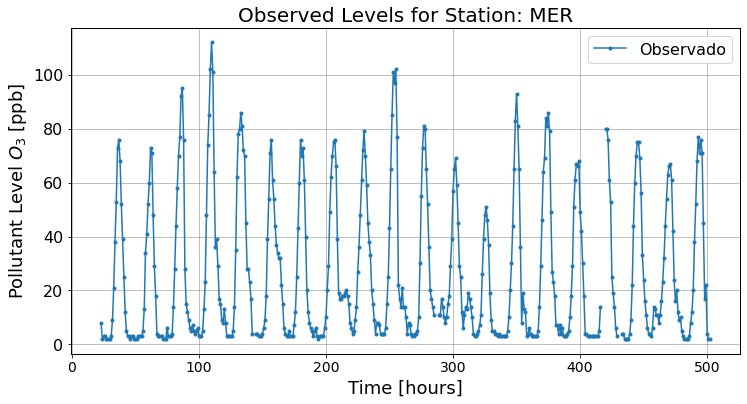

In [25]:
import matplotlib.pyplot as plt

def plot_simple(x_plot, y_true_column, title='Gráfica Simple', x_label='Eje X', y_label='Eje Y'):
    """
    Genera una gráfica simple de los datos proporcionados.

    Parámetros:
    x_data (iterable): Datos para el eje X.
    y_data (iterable): Datos para el eje Y.
    title (str): Título de la gráfica.
    x_label (str): Etiqueta para el eje X.
    y_label (str): Etiqueta para el eje Y.
    """
    plot_this_many = 24 * 20  # Number of points to plot

    plt.close('all')
    fig, ax = plt.subplots(figsize=[12, 6])

    ax.plot(x_plot[0:plot_this_many], y_true_column[0:plot_this_many], marker='.', label='Observado')

    ax.set_xlabel(x_label, fontsize=18)
    ax.set_ylabel(y_label, fontsize=18)
    ax.set_title(title, fontsize=20)

    # Configurar la cuadrícula
    ax.grid(True, color='grey', linestyle='-', linewidth=0.5)

    # Configurar los bordes (spines) de la gráfica
    for spine in ax.spines.values():
        spine.set_color('black')
        spine.set_linewidth(1.)

    ax.legend(fontsize=16)
    ax.tick_params(axis='x', labelsize=14)
    ax.tick_params(axis='y', labelsize=16)

    plt.show()

# Ejemplo de uso
# plot_simple(x_plot, y_true_column, title='Niveles Observados para la Estación: MER', x_label='Tiempo [horas]', y_label='Nivel de Contaminante $O_3$ [ppb]')
y_true_column = y_true_df['plus_01_cont_otres_MER']
x_plot  = range(23, 23 + len(y_true_column))

plot_simple(x_plot, y_true_column, title='Observed Levels for Station: MER', x_label='Time [hours]', y_label='Pollutant Level $O_3$ [ppb]')


In [26]:
#y_true_df.to_csv('./)

In [27]:
y_true_df, y_pred_descaled_df

(      plus_01_cont_otres_UIZ  plus_01_cont_otres_AJU  plus_01_cont_otres_ATI  \
 0                        3.0                    14.0                    30.0   
 1                        3.0                    26.0                    28.0   
 2                        2.0                    23.0                    23.0   
 3                        4.0                    20.0                    13.0   
 4                        4.0                    23.0                    15.0   
 ...                      ...                     ...                     ...   
 8732                     9.0                     7.0                     7.0   
 8733                    10.0                     7.0                     5.0   
 8734                     NaN                     NaN                     NaN   
 8735                     7.0                     NaN                     3.0   
 8736                     NaN                     NaN                     NaN   
 
       plus_01_cont_otres_

## <a id="Some_Observed_Hours_Results">Some Observed Hours Results</a>
- [Return to Plots Index](#Plots_index)  

plus_01_cont_otres_UIZ


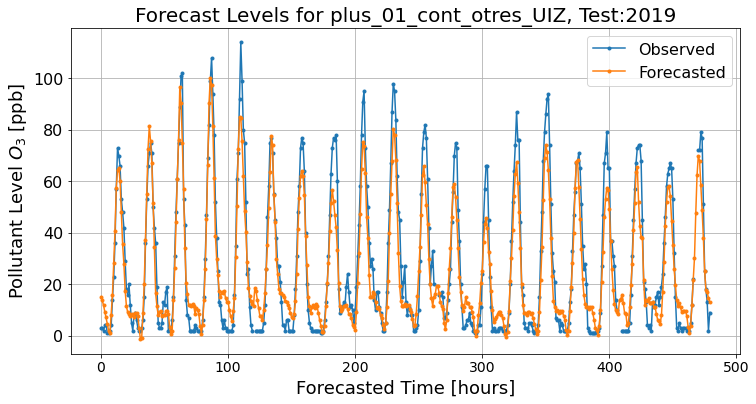

plus_06_cont_otres_UIZ


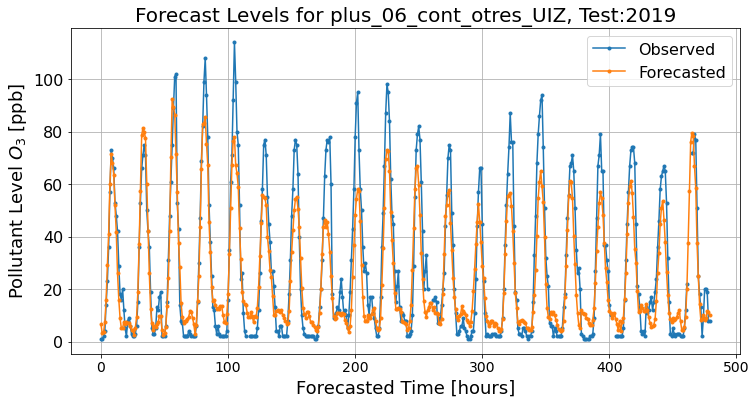

plus_12_cont_otres_UIZ


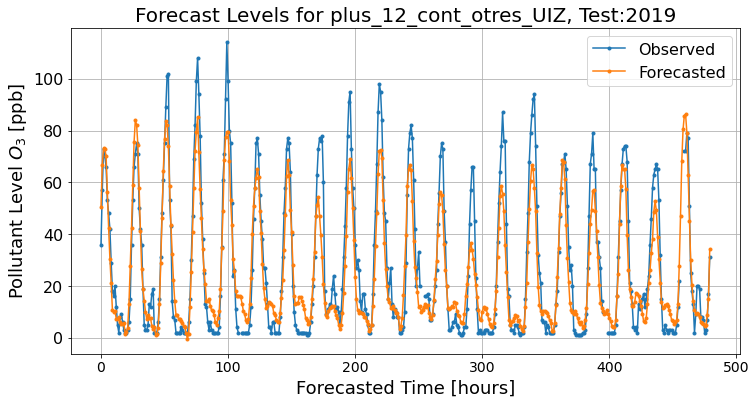

plus_18_cont_otres_UIZ


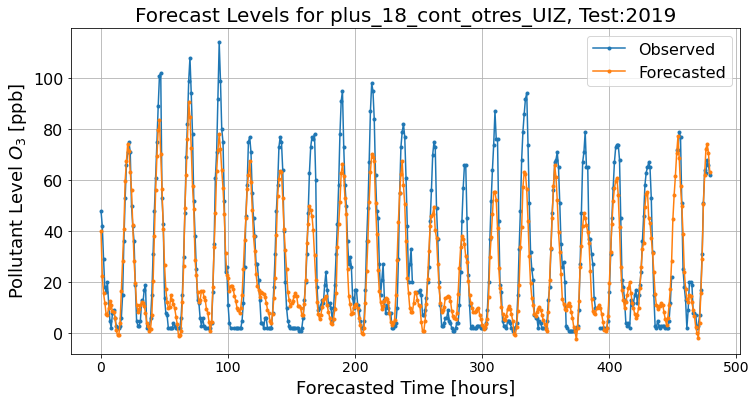

plus_24_cont_otres_UIZ


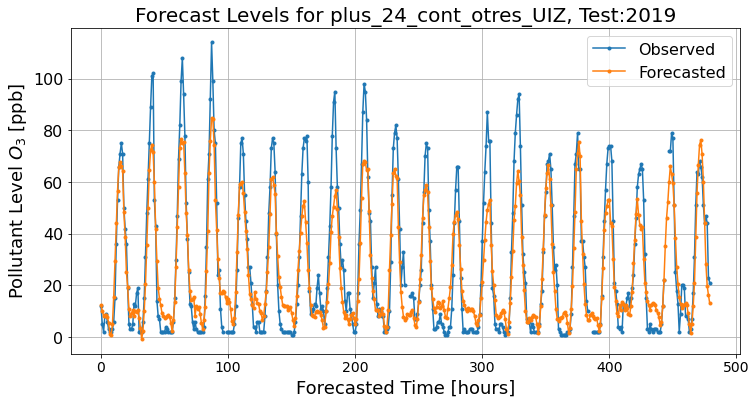

plus_01_cont_otres_AJU


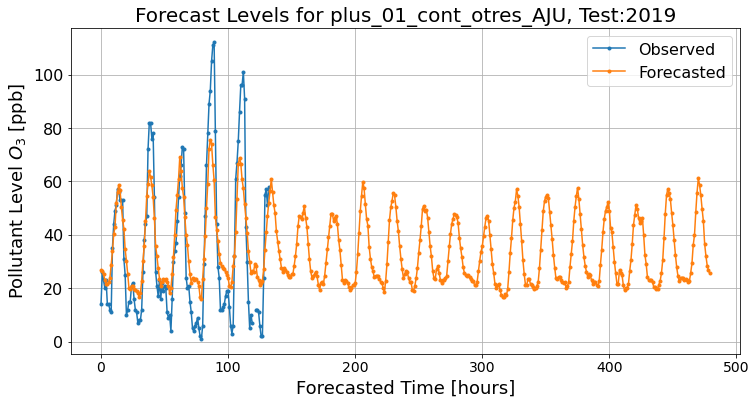

plus_06_cont_otres_AJU


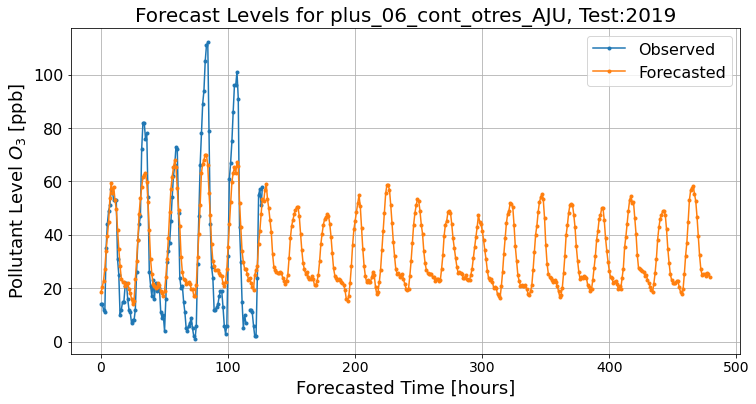

plus_12_cont_otres_AJU


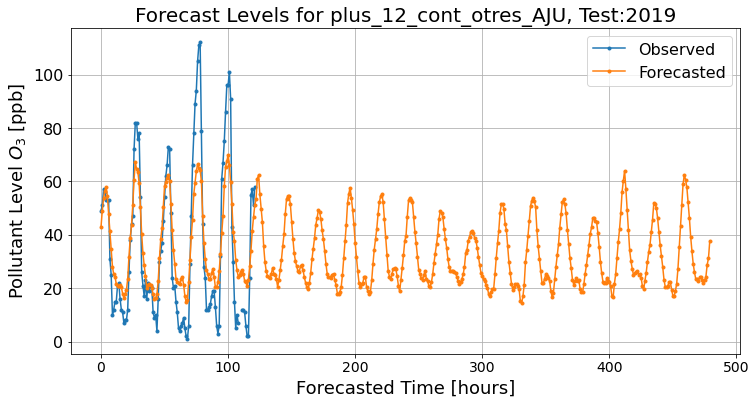

plus_18_cont_otres_AJU


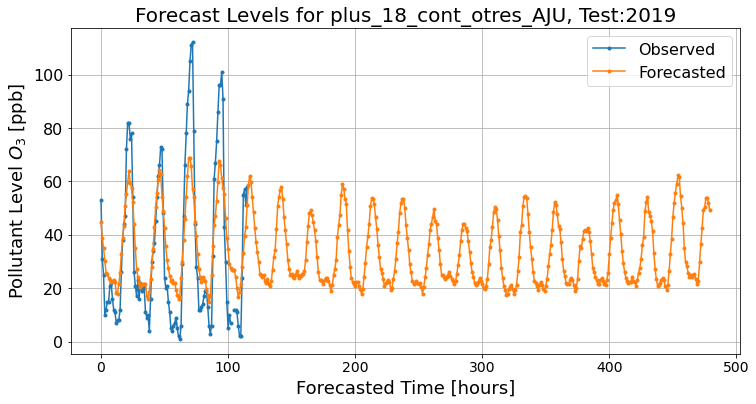

plus_24_cont_otres_AJU


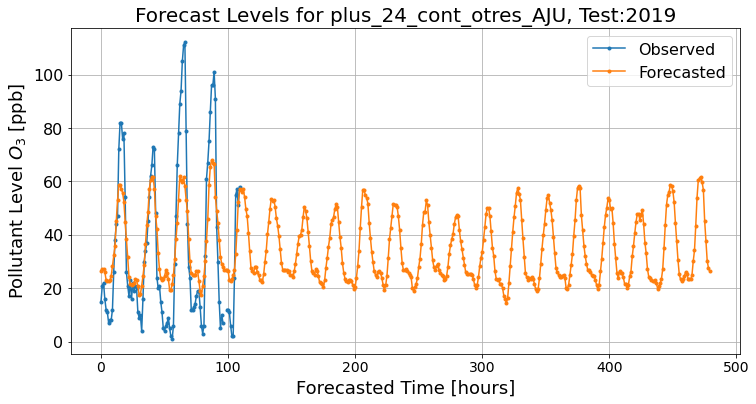

plus_01_cont_otres_ATI


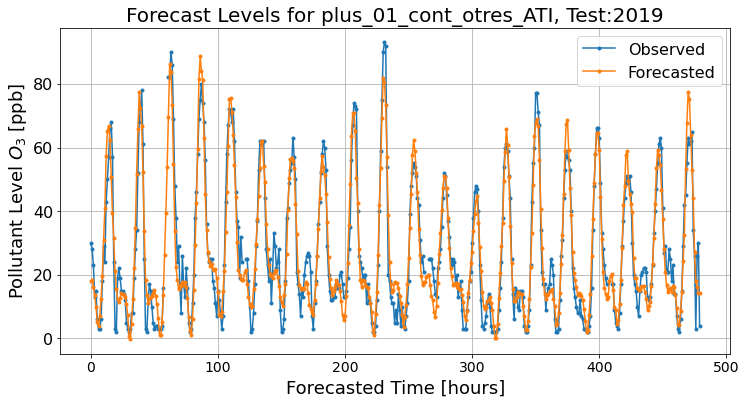

plus_06_cont_otres_ATI


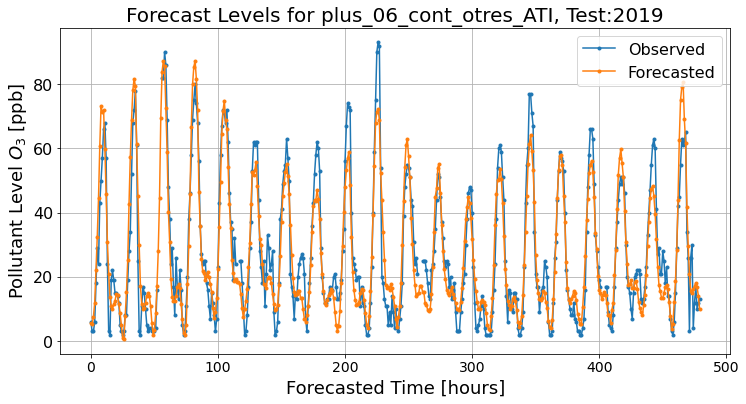

plus_12_cont_otres_ATI


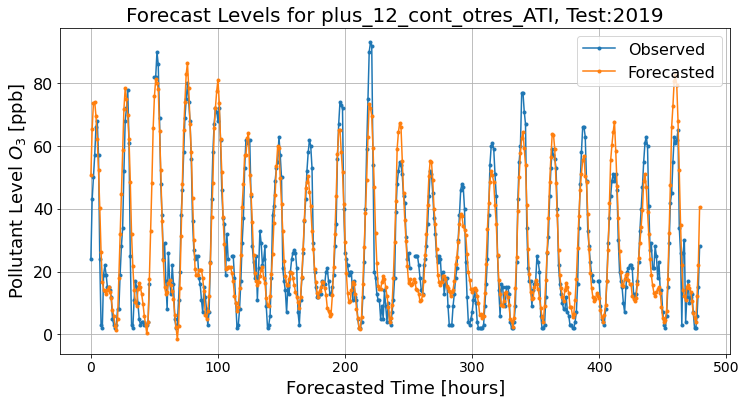

plus_18_cont_otres_ATI


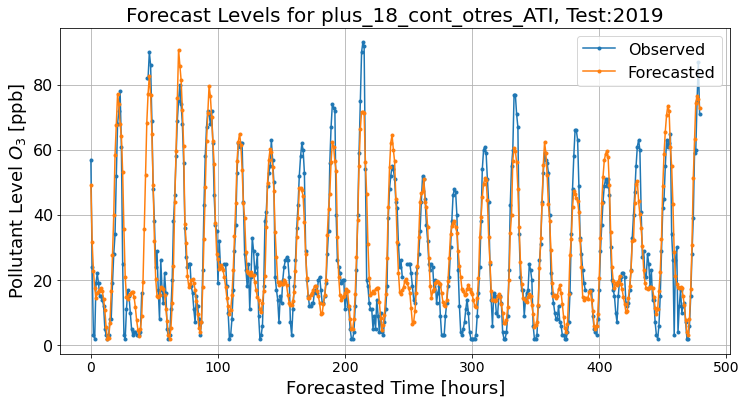

plus_24_cont_otres_ATI


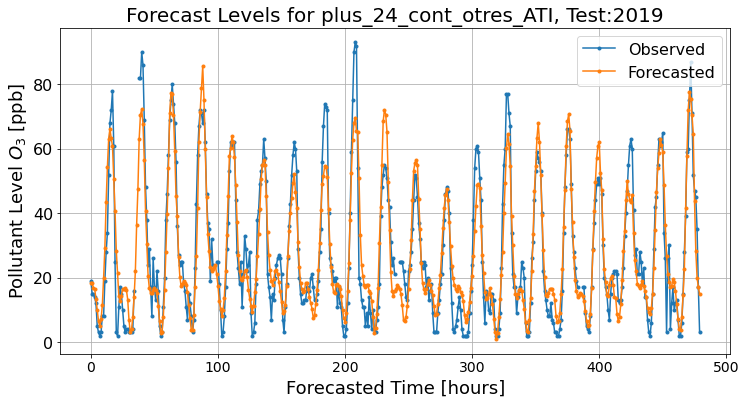

plus_01_cont_otres_UAX


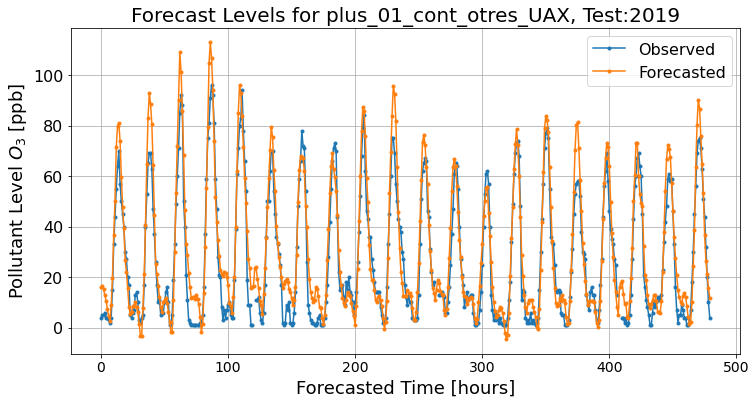

plus_06_cont_otres_UAX


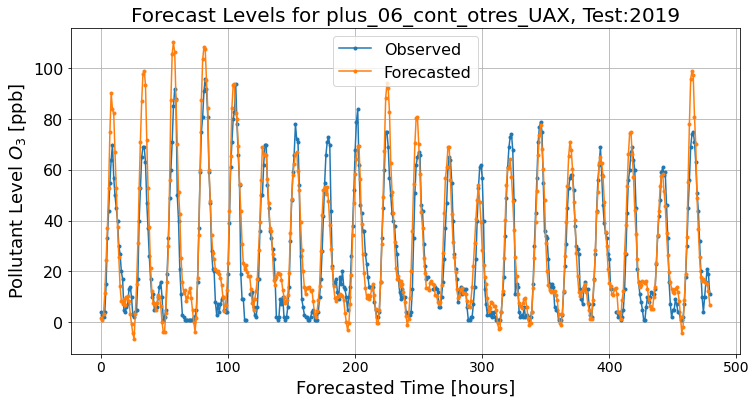

plus_12_cont_otres_UAX


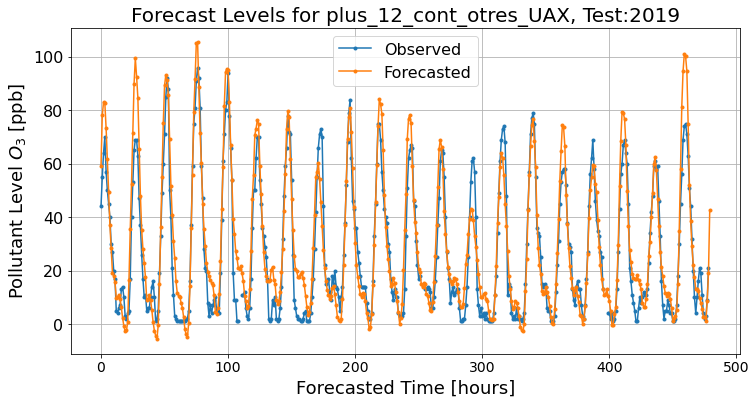

plus_18_cont_otres_UAX


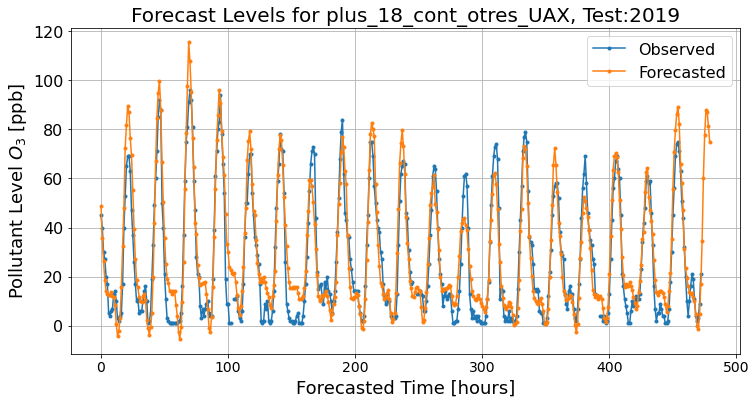

plus_24_cont_otres_UAX


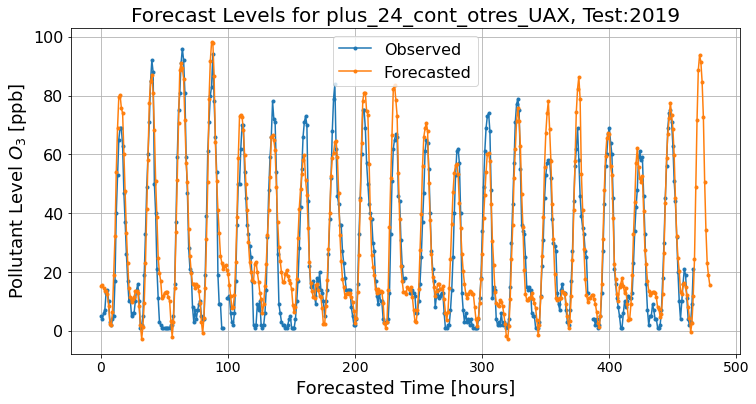

In [28]:
import matplotlib.pyplot as plt
from os.path import join

def plot_forecast_hours(column_to_plot, y_true_df, y_pred_descaled_df, 
                        output_results_folder_img=None, show_grid=True, 
                        x_label='Forecasted Time [hours]', y_label='Pollutant Level $O_3$ [ppb]', 
                        title_str=None, save_fig=True):
    """
    Generate a plot for forecast hours.

    Parameters:
    ...
    """
    plt.close('all')
    plot_this_many = 24 * 20  # Number of points to plot
    
    # Retrieve columns for plotting
    y_true_column = y_true_df[column_to_plot]
    y_pred_column = y_pred_descaled_df[column_to_plot]
    
    x_plot = range(len(y_true_column))
    
    # Plotting
    plt.figure(figsize=[12, 6])
    
    plt.xlabel(x_label, fontsize=18)
    plt.ylabel(y_label, fontsize=18)
    
    plt.plot(x_plot[0:plot_this_many], y_true_column[0:plot_this_many], marker='.', label='Observed')
    plt.plot(x_plot[0:plot_this_many], y_pred_column[0:plot_this_many], marker='.', label='Forecasted')
    
    if title_str is not None:
        plt.title(title_str, fontsize=20)
    else:
        plt.title(f'Forecast Levels for {column_to_plot}', fontsize=20)
        
    if show_grid:
        plt.grid(True)
    
    plt.legend(fontsize=16)
    plt.tick_params(axis='x', labelsize=14)
    plt.tick_params(axis='y', labelsize=16)
    
    if save_fig and output_results_folder_img:
        plt.savefig(join(output_results_folder_img, f'hours_plot_{column_to_plot.lower()}.png'), dpi=300)
    
    plt.show()

# Example usage
# plot_forecast_hours('some_column', y_true_df, y_pred_descaled_df, output_results_folder_img='./output_folder')

# Hacer gráficas de horas de algunos casos
plt.close('all')

for cur_column in params_grid:
    print(cur_column)
    
    # Llamar a la función con la columna deseada y argumentos adicionales
    plot_forecast_hours(
        cur_column, 
        y_true_df, 
        y_pred_descaled_df, 
        output_results_folder_img=output_results_folder_img,
        show_grid=True, 
        x_label='Forecasted Time [hours]', 
        y_label='Pollutant Level $O_3$ [ppb]',
        title_str=f'Forecast Levels for {cur_column}, Test:2019',
        save_fig=True
    )


In [29]:
# %% #Hacer gráficas de horas de algunos casos
""" plt.close('all')
for cur_column in params_grid:
    print(cur_column)
    # Llamar a la función con la columna deseada
    plot_forecast_hours(cur_column, y_true_df,
                        y_pred_descaled_df)  # , path_home)
 """

" plt.close('all')\nfor cur_column in params_grid:\n    print(cur_column)\n    # Llamar a la función con la columna deseada\n    plot_forecast_hours(cur_column, y_true_df,\n                        y_pred_descaled_df)  # , path_home)\n "

In [30]:
""" from matplotlib.colors import LogNorm
from os.path import join
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd  # Asumiendo que tus datos están en DataFrames de pandas
from proj_prediction.prediction  import preprocess_data, calculate_metrics
# Función para analizar una columna específica
def analyze_column(cur_column, y_pred_descaled_df, y_true_df, test_year=None, 
                   output_results_folder_img='./', generate_plot=True, save_fig=True):
    
    # Asumo que tienes una función preprocess_data que se ocupa del preprocesamiento
    y_true, y_prediction = preprocess_data(cur_column, y_pred_descaled_df, y_true_df)
    # Imprimir el índice de correlación
    data = {"x": y_prediction, "y": y_true.squeeze()}
    df = pd.DataFrame(data)
    df.dropna(inplace=True)
    corr_coef = df["x"].corr(df["y"])
    # Cálculo de métricas, asumo que tienes una función calculate_metrics
    mae, mape, mse, rmse, r2 = calculate_metrics(y_true, y_prediction)

    if generate_plot:
        analyze_column_plot(cur_column, y_true, y_prediction, corr_coef, mae, mape, rmse, 
                            test_year=test_year, output_results_folder_img=output_results_folder_img, 
                            save_fig=save_fig)

    # Retornar las métricas en un diccionario
    results = {
        "Columna": cur_column,
        "Índice de correlación": corr_coef,
        "MAE": mae,
        "MAPE": mape,
        "MSE": mse,
        "RMSE": rmse,
        "R2": r2
    }
    return results

# Función para generar una gráfica de análisis de columna
def analyze_column_plot(cur_column, y_true, y_prediction, corr_coef, mae, mape, rmse, 
                        test_year=None, output_results_folder_img='./', save_fig=True, cmap="YlGnBu"):
    
    # Detalles de la gráfica
    sns.set()
    fig, ax = plt.subplots(figsize=(9, 7))

    # ... (el resto de tu código para generar la gráfica aquí)
    
    hb = ax.hexbin(y_true, y_prediction, gridsize=30, cmap=cmap, norm=LogNorm(), mincnt=1)
    plt.colorbar(hb, ax=ax).set_label('Counts', fontsize=16)
    
    # ... (el resto de tu código para generar la gráfica aquí)

    if save_fig:
        plt.savefig(join(output_results_folder_img, f'hexbin_{cur_column}.png'), dpi=300)
    plt.show()


# Bucle para evaluar un conjunto específico de estaciones y horas
for station in evaluate_stations:
    for hour in evaluate_hours:
        cur_column = f'plus_{hour:02}_cont_otres_{station}'
        print(f'column name:{cur_column}')
        analyze_column(cur_column,
                       y_pred_descaled_df,
                       y_true_df,
                       test_year=test_year,
                       output_results_folder_img=output_results_folder_img) """


' from matplotlib.colors import LogNorm\nfrom os.path import join\nimport matplotlib.pyplot as plt\nimport seaborn as sns\nimport pandas as pd  # Asumiendo que tus datos están en DataFrames de pandas\nfrom proj_prediction.prediction  import preprocess_data, calculate_metrics\n# Función para analizar una columna específica\ndef analyze_column(cur_column, y_pred_descaled_df, y_true_df, test_year=None, \n                   output_results_folder_img=\'./\', generate_plot=True, save_fig=True):\n    \n    # Asumo que tienes una función preprocess_data que se ocupa del preprocesamiento\n    y_true, y_prediction = preprocess_data(cur_column, y_pred_descaled_df, y_true_df)\n    # Imprimir el índice de correlación\n    data = {"x": y_prediction, "y": y_true.squeeze()}\n    df = pd.DataFrame(data)\n    df.dropna(inplace=True)\n    corr_coef = df["x"].corr(df["y"])\n    # Cálculo de métricas, asumo que tienes una función calculate_metrics\n    mae, mape, mse, rmse, r2 = calculate_metrics(y_true, y

## <a id="Some_Hexbin">Some Hexbin Density Histograms</a>
- [Return to Plots Index](#Plots_index)  

column name:plus_01_cont_otres_UIZ
Índice de correlación:                     0.9362


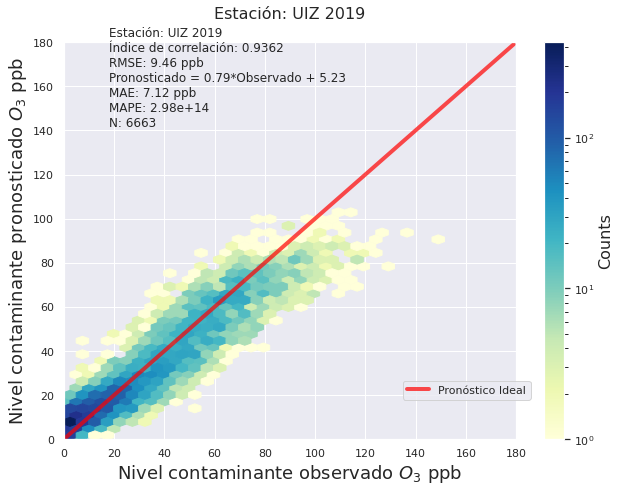

column name:plus_06_cont_otres_UIZ
Índice de correlación:                     0.8914


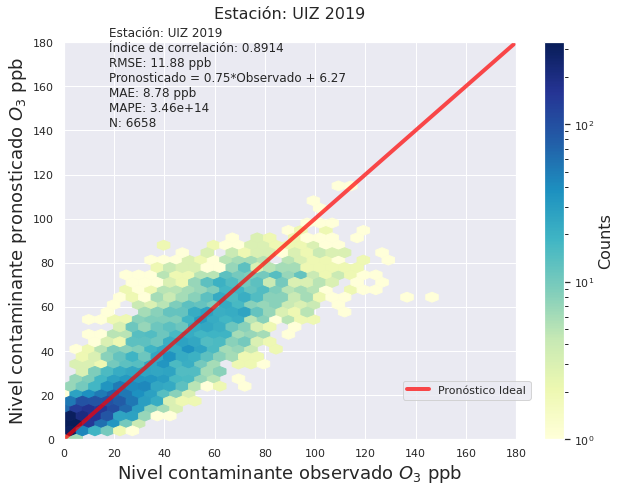

column name:plus_12_cont_otres_UIZ
Índice de correlación:                     0.8959


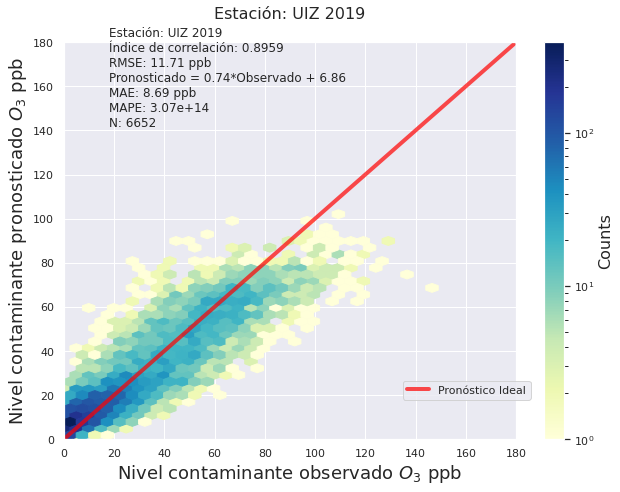

column name:plus_18_cont_otres_UIZ
Índice de correlación:                     0.8953


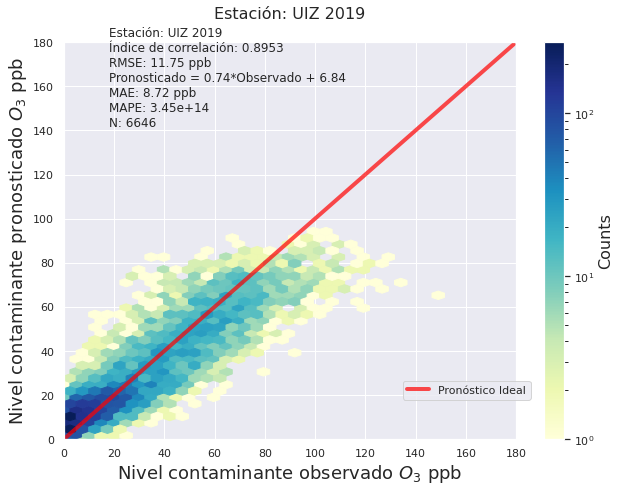

column name:plus_24_cont_otres_UIZ
Índice de correlación:                     0.8828


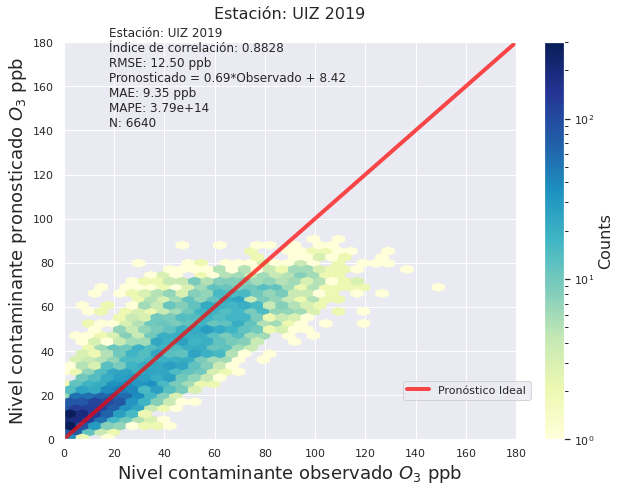

column name:plus_01_cont_otres_AJU
Índice de correlación:                     0.8932


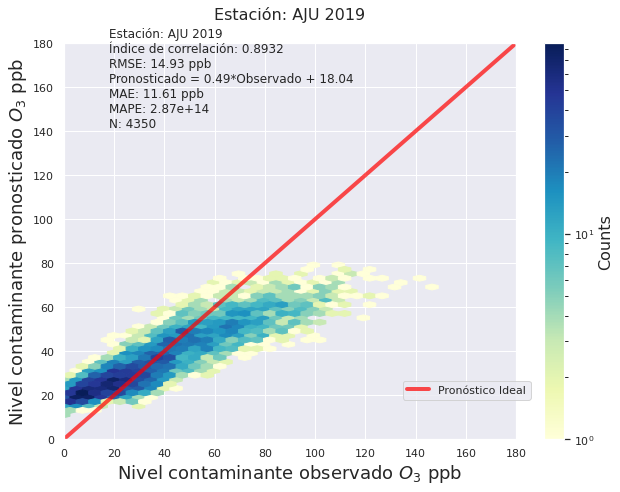

column name:plus_06_cont_otres_AJU
Índice de correlación:                     0.8628


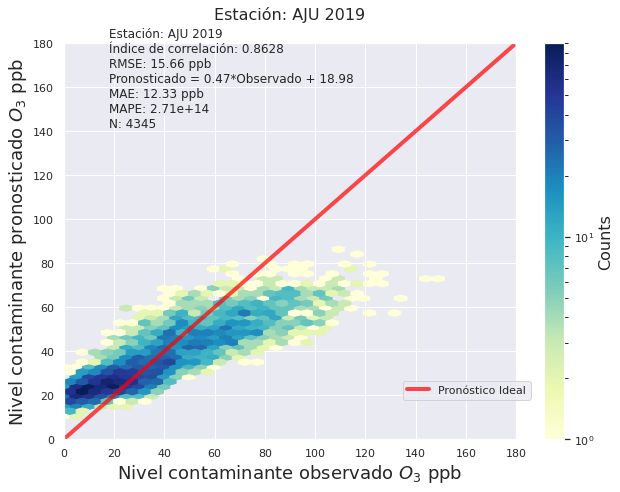

column name:plus_12_cont_otres_AJU
Índice de correlación:                     0.8603


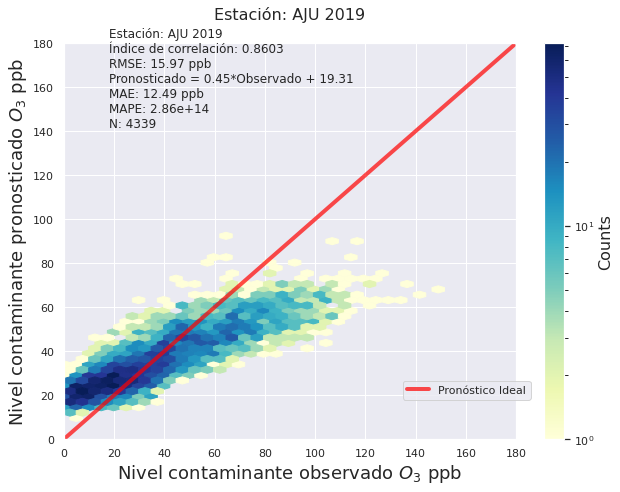

column name:plus_18_cont_otres_AJU
Índice de correlación:                     0.8583


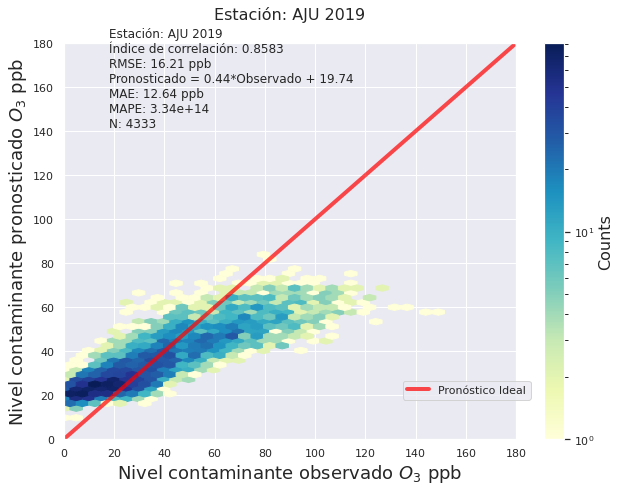

column name:plus_24_cont_otres_AJU
Índice de correlación:                     0.8414


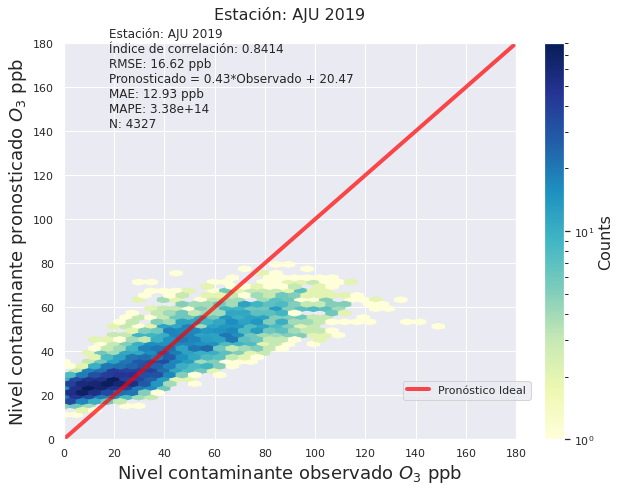

column name:plus_01_cont_otres_ATI
Índice de correlación:                     0.9282


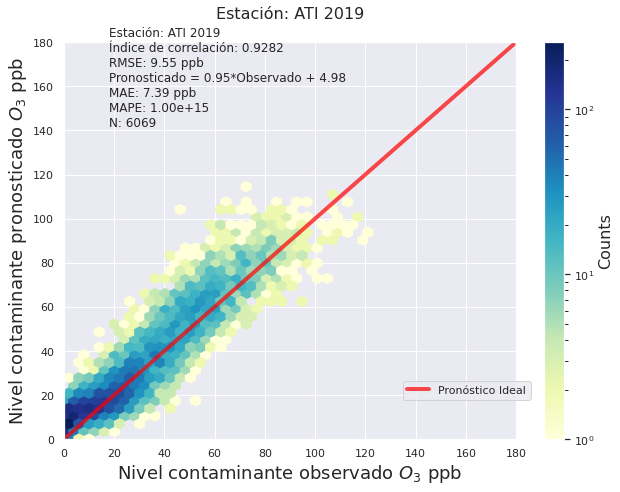

column name:plus_06_cont_otres_ATI
Índice de correlación:                     0.8853


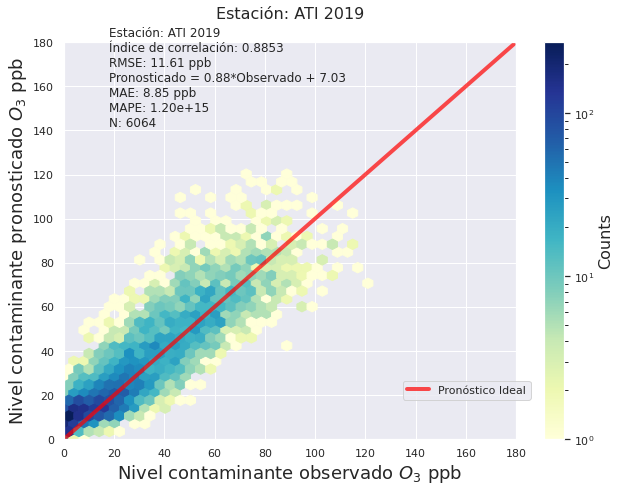

column name:plus_12_cont_otres_ATI
Índice de correlación:                     0.8811


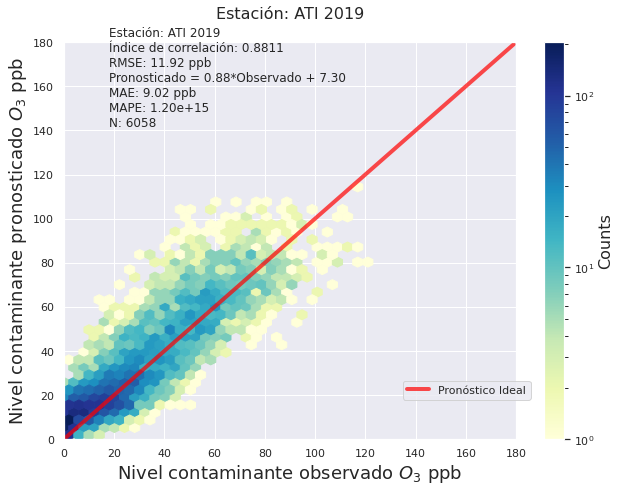

column name:plus_18_cont_otres_ATI
Índice de correlación:                     0.8803


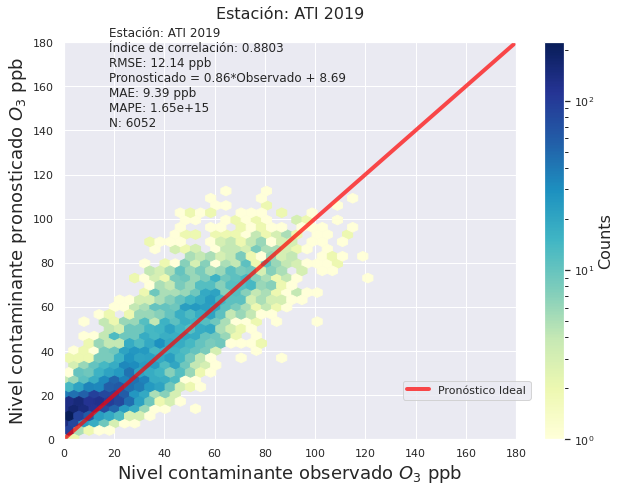

column name:plus_24_cont_otres_ATI
Índice de correlación:                     0.8796


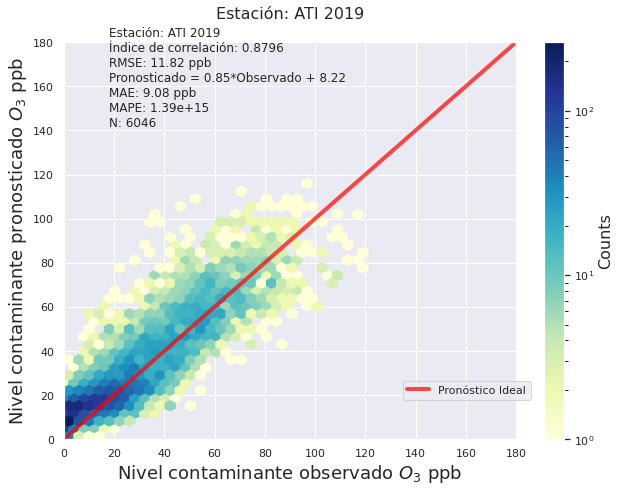

column name:plus_01_cont_otres_UAX
Índice de correlación:                     0.9091


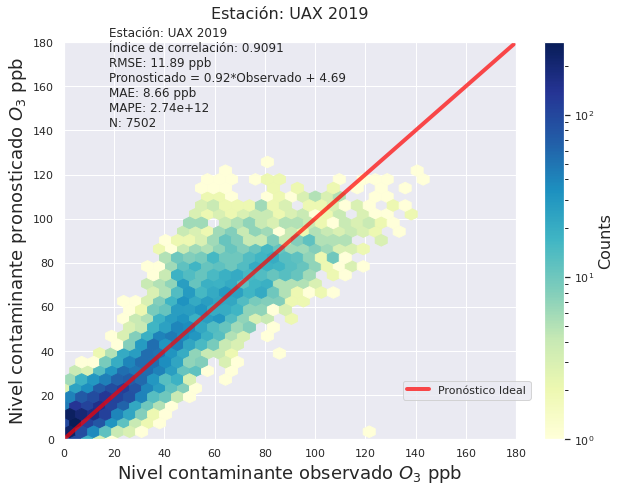

column name:plus_06_cont_otres_UAX
Índice de correlación:                     0.8794


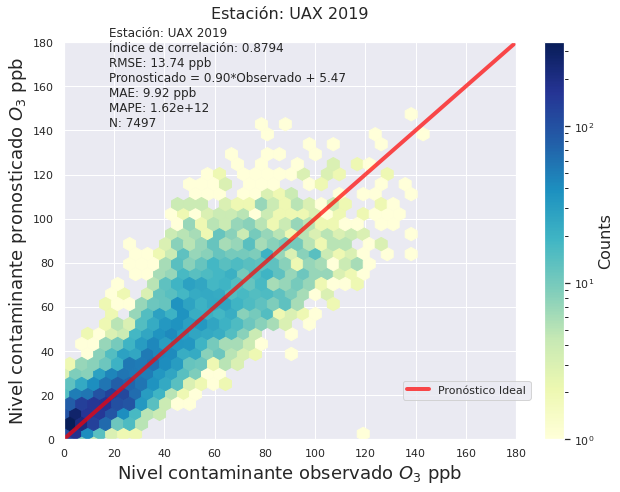

column name:plus_12_cont_otres_UAX
Índice de correlación:                     0.8735


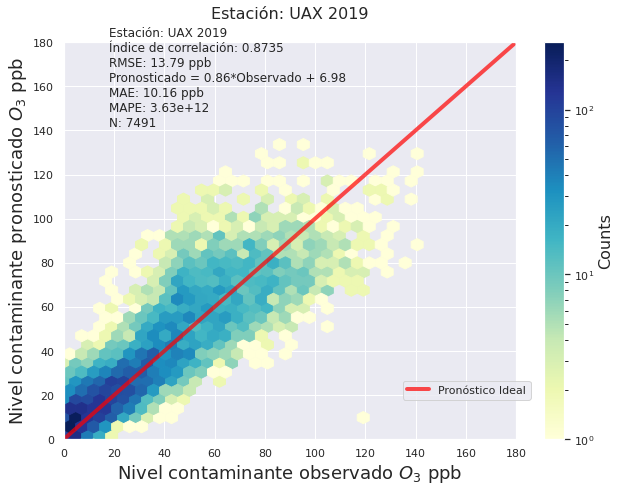

column name:plus_18_cont_otres_UAX
Índice de correlación:                     0.8719


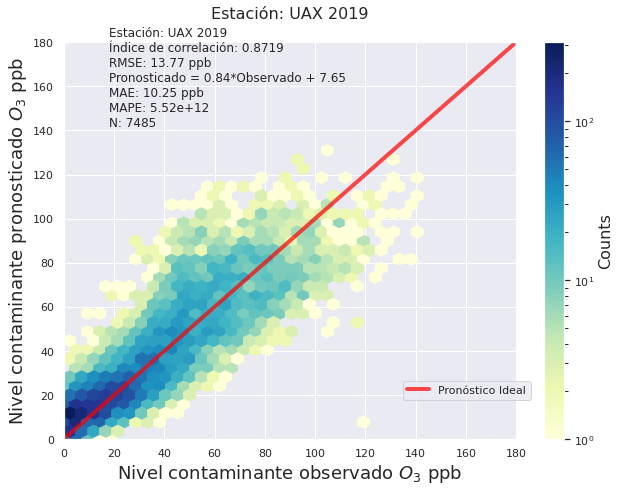

column name:plus_24_cont_otres_UAX
Índice de correlación:                     0.8636


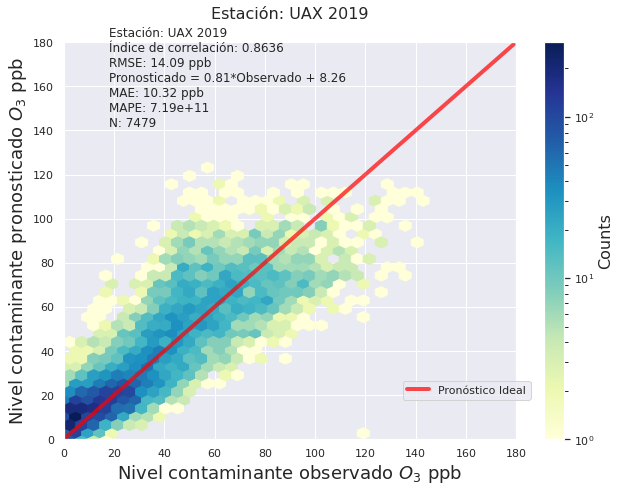

In [31]:
# %% Evaluating only a set of stations and hours
for station in evaluate_stations:
    for hour in evaluate_hours:
        cur_column = f'plus_{hour:02}_cont_otres_{station}'
        print(f'column name:{cur_column}')
        # analyze_column(cur_column)
        analyze_column(cur_column,
                       y_pred_descaled_df,
                       y_true_df,
                       test_year=test_year,
                       output_results_folder_img=output_results_folder_img)

# Visualize evolution of n_hours forecasted
#for station in evaluate_stations:
#    analyze_multi_hour_plot(
#        station,
#       evaluate_hours,
#        y_pred_descaled_df,
#        y_true_df,
#        test_year=test_year,
#       output_results_folder_img=output_results_folder_img)


In [32]:
# %% #Crear DataFrame con resultados de métricas y guardar los resultados en csv

results_df = pd.DataFrame(columns=[
    "Columna", "Índice de correlación", "MAE", "MAPE", "MSE", "RMSE", "R2","Index of agreement"
])

for cur_column in y_pred_descaled_df.columns:
    print(cur_column)
    column_results = analyze_column(cur_column,
                                    y_pred_descaled_df,
                                    y_true_df,
                                    test_year=test_year,
                                    generate_plot=False)
    results_df = results_df.append(column_results, ignore_index=True)

print(results_df)
results_df.to_csv(join(output_results_folder_data, 'results_df.csv'),
                  index=False)


plus_01_cont_otres_UIZ
Índice de correlación:                     0.9362
plus_01_cont_otres_AJU
Índice de correlación:                     0.8932
plus_01_cont_otres_ATI
Índice de correlación:                     0.9282
plus_01_cont_otres_CUA
Índice de correlación:                     0.8837
plus_01_cont_otres_SFE
Índice de correlación:                     0.9043
plus_01_cont_otres_SAG
Índice de correlación:                     0.9355
plus_01_cont_otres_CUT
Índice de correlación:                     0.9398
plus_01_cont_otres_PED
Índice de correlación:                     0.9400
plus_01_cont_otres_TAH
Índice de correlación:                     0.9195
plus_01_cont_otres_GAM
Índice de correlación:                     0.9313
plus_01_cont_otres_IZT
Índice de correlación:                     0.9461
plus_01_cont_otres_CCA
Índice de correlación:                     0.9378
plus_01_cont_otres_HGM
Índice de correlación:                     0.9437
plus_01_cont_otres_LPR
Índice de correlación:      

plus_05_cont_otres_SFE
Índice de correlación:                     0.8526
plus_05_cont_otres_SAG
Índice de correlación:                     0.9102
plus_05_cont_otres_CUT
Índice de correlación:                     0.9110
plus_05_cont_otres_PED
Índice de correlación:                     0.8947
plus_05_cont_otres_TAH
Índice de correlación:                     0.8874
plus_05_cont_otres_GAM
Índice de correlación:                     0.9026
plus_05_cont_otres_IZT
Índice de correlación:                     0.9060
plus_05_cont_otres_CCA
Índice de correlación:                     0.8967
plus_05_cont_otres_HGM
Índice de correlación:                     0.9030
plus_05_cont_otres_LPR
Índice de correlación:                     0.8713
plus_05_cont_otres_MGH
Índice de correlación:                     0.8903
plus_05_cont_otres_CAM
Índice de correlación:                     0.8927
plus_05_cont_otres_FAC
Índice de correlación:                     0.8783
plus_05_cont_otres_TLA
Índice de correlación:      

Índice de correlación:                     0.8982
plus_09_cont_otres_CUT
Índice de correlación:                     0.9094
plus_09_cont_otres_PED
Índice de correlación:                     0.8822
plus_09_cont_otres_TAH
Índice de correlación:                     0.8786
plus_09_cont_otres_GAM
Índice de correlación:                     0.8940
plus_09_cont_otres_IZT
Índice de correlación:                     0.9022
plus_09_cont_otres_CCA
Índice de correlación:                     0.8851
plus_09_cont_otres_HGM
Índice de correlación:                     0.8975
plus_09_cont_otres_LPR
Índice de correlación:                     0.8663
plus_09_cont_otres_MGH
Índice de correlación:                     0.8826
plus_09_cont_otres_CAM
Índice de correlación:                     0.8844
plus_09_cont_otres_FAC
Índice de correlación:                     0.8737
plus_09_cont_otres_TLA
Índice de correlación:                     0.8898
plus_09_cont_otres_MER
Índice de correlación:                     0.8928
p

plus_13_cont_otres_SFE
Índice de correlación:                     0.8416
plus_13_cont_otres_SAG
Índice de correlación:                     0.9075
plus_13_cont_otres_CUT
Índice de correlación:                     0.9026
plus_13_cont_otres_PED
Índice de correlación:                     0.8823
plus_13_cont_otres_TAH
Índice de correlación:                     0.8808
plus_13_cont_otres_GAM
Índice de correlación:                     0.8939
plus_13_cont_otres_IZT
Índice de correlación:                     0.8982
plus_13_cont_otres_CCA
Índice de correlación:                     0.8876
plus_13_cont_otres_HGM
Índice de correlación:                     0.8947
plus_13_cont_otres_LPR
Índice de correlación:                     0.8638
plus_13_cont_otres_MGH
Índice de correlación:                     0.8840
plus_13_cont_otres_CAM
Índice de correlación:                     0.8904
plus_13_cont_otres_FAC
Índice de correlación:                     0.8708
plus_13_cont_otres_TLA
Índice de correlación:      

plus_17_cont_otres_AJU
Índice de correlación:                     0.8573
plus_17_cont_otres_ATI
Índice de correlación:                     0.8788
plus_17_cont_otres_CUA
Índice de correlación:                     0.8230
plus_17_cont_otres_SFE
Índice de correlación:                     0.8371
plus_17_cont_otres_SAG
Índice de correlación:                     0.9098
plus_17_cont_otres_CUT
Índice de correlación:                     0.9096
plus_17_cont_otres_PED
Índice de correlación:                     0.8870
plus_17_cont_otres_TAH
Índice de correlación:                     0.8800
plus_17_cont_otres_GAM
Índice de correlación:                     0.8909
plus_17_cont_otres_IZT
Índice de correlación:                     0.9036
plus_17_cont_otres_CCA
Índice de correlación:                     0.8856
plus_17_cont_otres_HGM
Índice de correlación:                     0.8947
plus_17_cont_otres_LPR
Índice de correlación:                     0.8705
plus_17_cont_otres_MGH
Índice de correlación:      

plus_20_cont_otres_NEZ
Índice de correlación:                     0.8880
plus_20_cont_otres_INN
Índice de correlación:                     0.7877
plus_20_cont_otres_AJM
Índice de correlación:                     0.8220
plus_20_cont_otres_VIF
Índice de correlación:                     0.8739
plus_21_cont_otres_UIZ
Índice de correlación:                     0.8865
plus_21_cont_otres_AJU
Índice de correlación:                     0.8509
plus_21_cont_otres_ATI
Índice de correlación:                     0.8886
plus_21_cont_otres_CUA
Índice de correlación:                     0.8235
plus_21_cont_otres_SFE
Índice de correlación:                     0.8507
plus_21_cont_otres_SAG
Índice de correlación:                     0.9003
plus_21_cont_otres_CUT
Índice de correlación:                     0.9121
plus_21_cont_otres_PED
Índice de correlación:                     0.8815
plus_21_cont_otres_TAH
Índice de correlación:                     0.8765
plus_21_cont_otres_GAM
Índice de correlación:      

plus_24_cont_otres_XAL
Índice de correlación:                     0.8778
plus_24_cont_otres_LLA
Índice de correlación:                     0.8980
plus_24_cont_otres_TLI
Índice de correlación:                     0.8970
plus_24_cont_otres_UAX
Índice de correlación:                     0.8636
plus_24_cont_otres_BJU
Índice de correlación:                     0.8668
plus_24_cont_otres_MPA
Índice de correlación:                     0.8107
plus_24_cont_otres_MON
Índice de correlación:                     0.8900
plus_24_cont_otres_NEZ
Índice de correlación:                     0.8864
plus_24_cont_otres_INN
Índice de correlación:                     0.7783
plus_24_cont_otres_AJM
Índice de correlación:                     0.8116
plus_24_cont_otres_VIF
Índice de correlación:                     0.8759
                    Columna  Índice de correlación        MAE          MAPE  \
0    plus_01_cont_otres_UIZ               0.936156   7.118227  2.976779e+14   
1    plus_01_cont_otres_AJU            

In [33]:
results_df
# Extract unique station identifiers from the "Columna" column
station_identifiers = results_df['Columna'].str.split('_').str[4].unique()
station_identifiers

array(['UIZ', 'AJU', 'ATI', 'CUA', 'SFE', 'SAG', 'CUT', 'PED', 'TAH',
       'GAM', 'IZT', 'CCA', 'HGM', 'LPR', 'MGH', 'CAM', 'FAC', 'TLA',
       'MER', 'XAL', 'LLA', 'TLI', 'UAX', 'BJU', 'MPA', 'MON', 'NEZ',
       'INN', 'AJM', 'VIF'], dtype=object)

In [34]:
results_df.rename(columns={'Índice de correlación': 'Correlation Index'}, inplace=True)


In [35]:
results_df

,Columna,Correlation Index,MAE,MAPE,MSE,RMSE,R2,Index of agreement
0,plus_01_cont_otres_UIZ,0.936156,7.118227,2.976779e+14,89.398051,9.455054,0.868104,NaN
1,plus_01_cont_otres_AJU,0.893209,11.612323,2.873532e+14,222.984055,14.932651,0.673850,NaN
2,plus_01_cont_otres_ATI,0.928181,7.391601,1.003184e+15,91.249598,9.552466,0.828155,NaN
3,plus_01_cont_otres_CUA,0.883675,8.394414,3.908166e-01,120.091363,10.958620,0.771604,NaN
4,plus_01_cont_otres_SFE,0.904346,8.120199,1.434481e+14,111.815082,10.574265,0.799840,NaN
...,...,...,...,...,...,...,...,...
715,plus_24_cont_otres_MON,0.890021,9.995342,6.066160e+12,153.231393,12.378667,0.778858,NaN
716,plus_24_cont_otres_NEZ,0.886378,10.266807,9.246081e+12,186.022384,13.639002,0.754519,NaN
717,plus_24_cont_otres_INN,0.778344,10.772329,4.597497e-01,179.691898,13.404921,0.575893,NaN
718,plus_24_cont_otres_AJM,0.811592,11.239305,6.257708e-01,205.260524,14.326916,0.630920,NaN


## <a id="Scatter_Metrics_for_Model_Outputs">Scatter Metrics for Model Outputs</a>
### MAE, RMSE, R2, Correlation Index, Index of Agreement
- [Plots index return](#Plots_index)

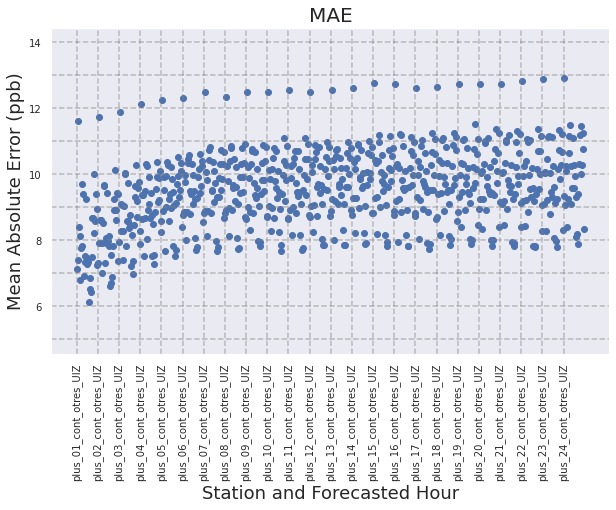

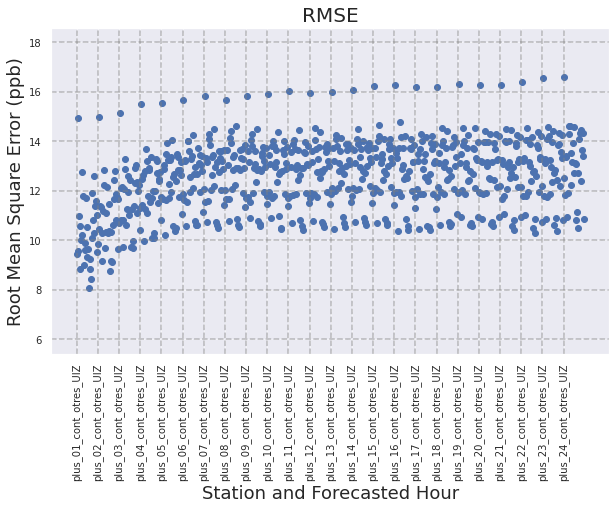

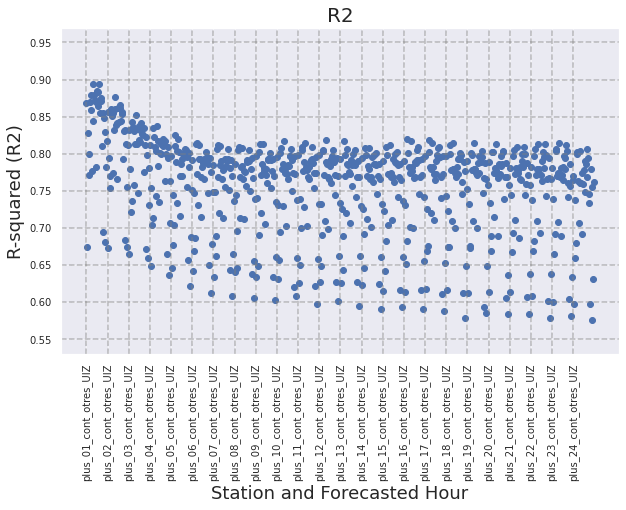

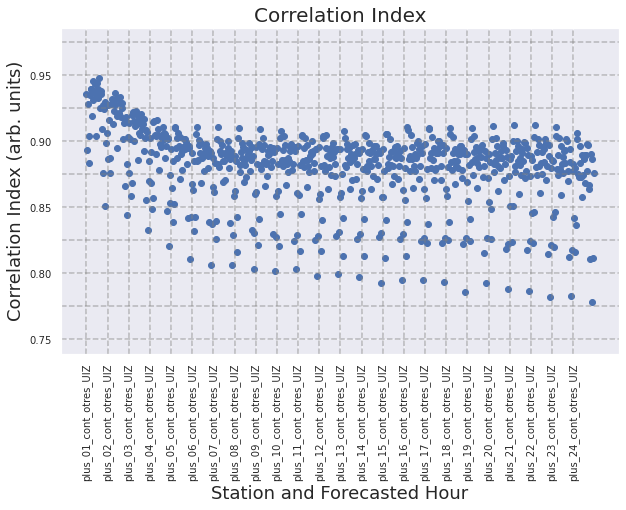

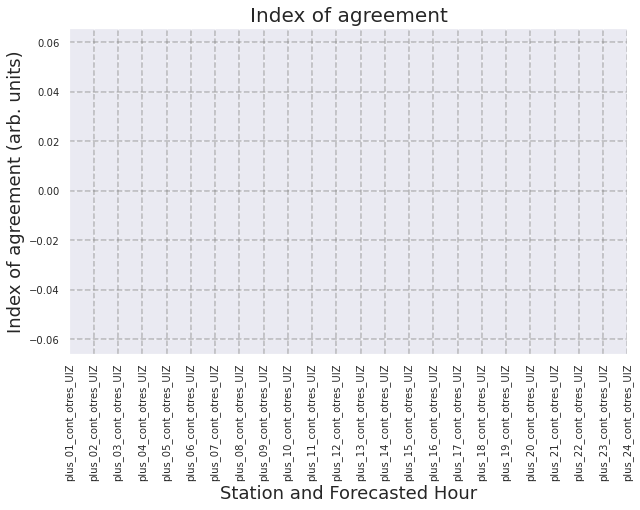

In [36]:
from os.path import join
import matplotlib.pyplot as plt

def scatter_plot_by_column(df, metric, output_folder=None, 
                           show_grid=True, x_label='Station and forecasted hours', 
                           y_label=None, title_str=True, save_fig=True,
                           x_label_fontsize=18, y_label_fontsize=18, 
                           title_fontsize=20, tick_fontsize=14):
    
    plt.figure(figsize=(10, 6))
    plt.scatter(df.index, df[metric])
    
    plt.xlabel(x_label, fontsize=x_label_fontsize)
    plt.ylabel(y_label if y_label else metric, fontsize=y_label_fontsize)
    
    if title_str:
        title_str = f'{metric}'
    else:
        title_str = ''
        
    plt.title(title_str, fontsize=title_fontsize)
    
    x_ticks = df.index[::30]
    x_labels = df['Columna'][::30]
    plt.xticks(x_ticks, x_labels, rotation=90, fontsize=tick_fontsize)
    plt.yticks(fontsize=tick_fontsize)
    
    if show_grid:
        for x in x_ticks:
            plt.axvline(x, color='gray', linestyle='dashed', alpha=0.5)
        plt.grid(True, axis='x', linestyle='dashed', alpha=0.5)
        
        y_ticks = plt.gca().get_yticks()
        for y in y_ticks:
            plt.axhline(y, color='gray', linestyle='dashed', alpha=0.5)
        plt.grid(True, axis='y', linestyle='dashed', alpha=0.5)
    
    if save_fig and output_folder:
        plt.savefig(join(output_folder, f'scatter_plot_{metric.lower()}.png'), dpi=300)
        
    plt.show()
# Para MAE
scatter_plot_by_column(results_df, 'MAE',
                output_results_folder_img, 
                show_grid=True, 
                x_label='Station and Forecasted Hour', 
                y_label='Mean Absolute Error (ppb)', 
                title_str='Mean Absolute Error Across Stations and Forecasted Hours', 
                save_fig=True,
                x_label_fontsize=18, 
                y_label_fontsize=18, 
                title_fontsize=20, 
                tick_fontsize=10)

# Para RMSE
scatter_plot_by_column(results_df, 'RMSE',
                output_results_folder_img, 
                show_grid=True, 
                x_label='Station and Forecasted Hour', 
                y_label='Root Mean Square Error (ppb)', 
                title_str='Root Mean Square Error Across Stations and Forecasted Hours', 
                save_fig=True,
                x_label_fontsize=18, 
                y_label_fontsize=18, 
                title_fontsize=20, 
                tick_fontsize=10)

# Para R2
scatter_plot_by_column(results_df, 'R2',
                output_results_folder_img, 
                show_grid=True, 
                x_label='Station and Forecasted Hour', 
                y_label='R-squared (R2)', 
                title_str='R-squared (R2) Across Stations and Forecasted Hours', 
                save_fig=True,
                x_label_fontsize=18, 
                y_label_fontsize=18, 
                title_fontsize=20, 
                tick_fontsize=10)
# CC
scatter_plot_by_column(results_df, 'Correlation Index',
                output_results_folder_img, 
                show_grid=True, 
                x_label='Station and Forecasted Hour', 
                y_label='Correlation Index (arb. units)', 
                title_str='Correlation Index Across Stations and Forecasted Hours', 
                save_fig=True,
                x_label_fontsize=18, 
                y_label_fontsize=18, 
                title_fontsize=20, 
                tick_fontsize=10)


# IoA
scatter_plot_by_column(results_df, 'Index of agreement',
                output_results_folder_img, 
                show_grid=True, 
                x_label='Station and Forecasted Hour', 
                y_label='Index of agreement (arb. units)', 
                title_str='Index of agreement Across Stations and Forecasted Hours', 
                save_fig=True,
                x_label_fontsize=18, 
                y_label_fontsize=18, 
                title_fontsize=20, 
                tick_fontsize=10)

## <a id="Bar_Charts_Averaging_Metrics_over_Stations">Bar Charts Averaging Metrics over Stations</a>
### MAE, RMSE, R2, Correlation Index, Index of Agreement
- [Return to Plots Index](#Plots_index) 

Per station MAE: 9.5403


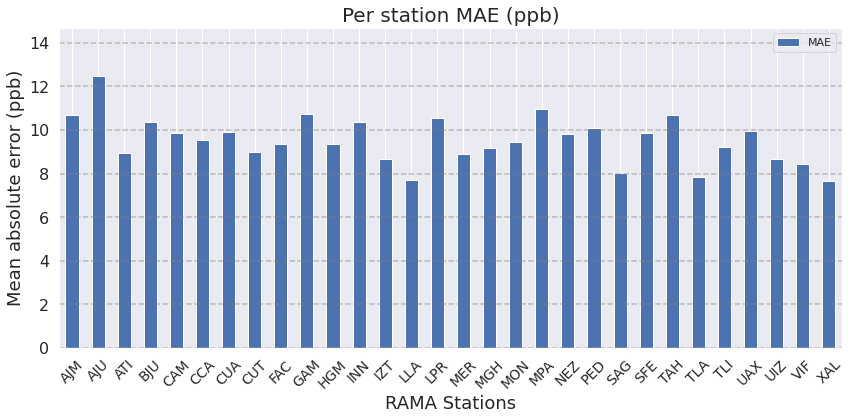

Per station RMSE: 12.5676


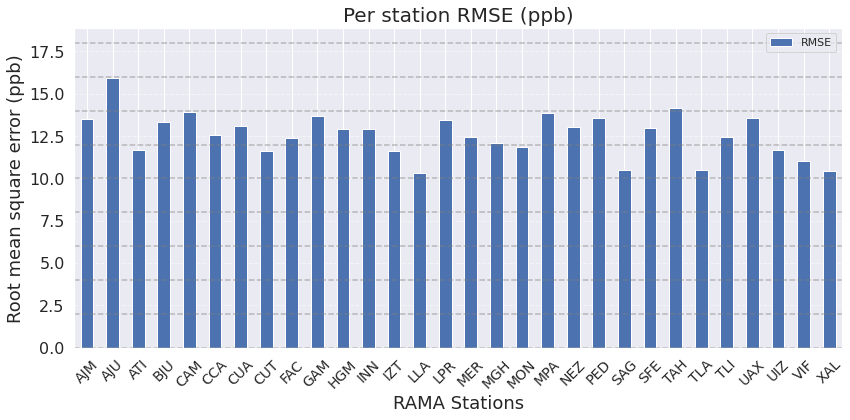

Per station R2: 0.7568


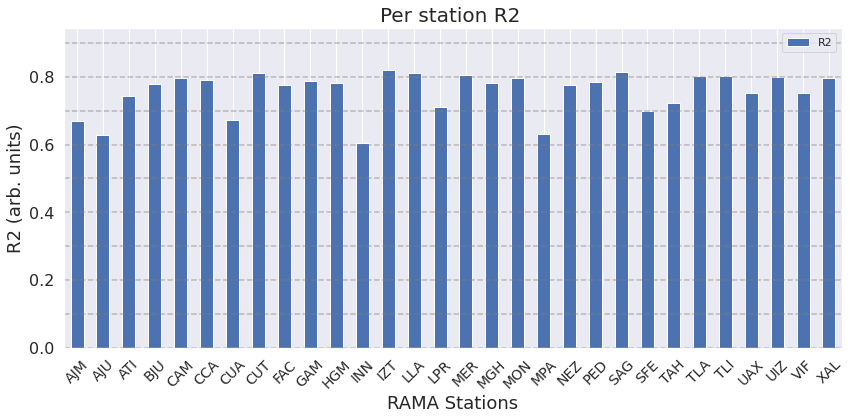

Per station Correlation Index: 0.8809


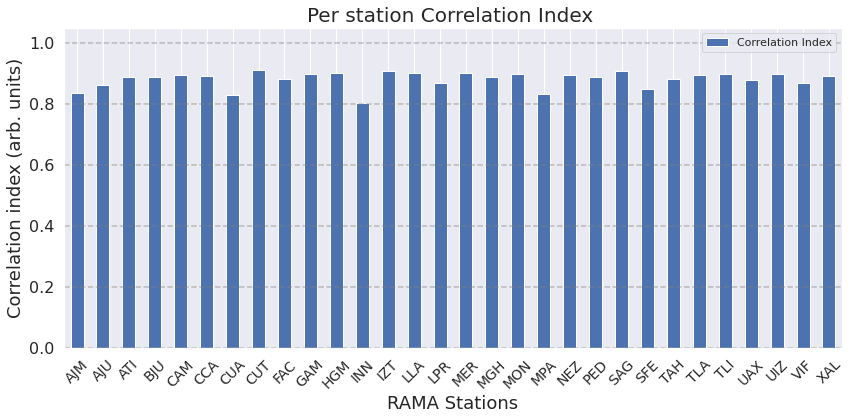

Per station Index of agreement: nan


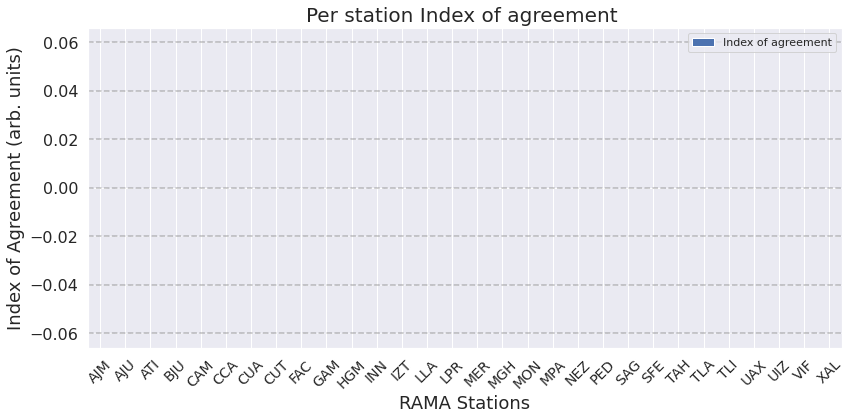

In [37]:
import pandas as pd
from os.path import join
import matplotlib.pyplot as plt

def average_metric(results_df, metric, output_results_folder_img=None, 
                    show_grid=True, x_label='Station', y_label=None, 
                    title_suffix='', save_fig=True, title_str=True,
                    subtitle=True):
    """
    Generate a bar plot for average metrics.
    
    Parameters:
    ...
    """

    # Helper function to calculate average metrics
    def calculate_average_metrics(df, key):
        return df[df['Columna'].str.endswith(key)][metric].mean()

    station_keys = sorted(set(results_df['Columna'].apply(lambda x: x.split('_')[-1])))
    average_metrics = [calculate_average_metrics(results_df, key) for key in station_keys]
    
    # Create DataFrame
    average_metrics_df = pd.DataFrame({x_label: station_keys, metric: average_metrics})

    # Overall Average
    overall_average_metric = average_metrics_df[metric].mean()
    print(f"Per station {metric}: {overall_average_metric:.4f}")

    # Plotting
    ax = average_metrics_df.plot(x=x_label, y=metric, kind='bar', figsize=(12, 6))

    # Title Handling
    if isinstance(title_str, str):
        pass
    elif title_str:
        title_str = f'Per station {metric} {title_suffix}'
    else:
        title_str = ''
    
    if subtitle:
        title_str += f"\n Overall stations {metric} {overall_average_metric:.4f}"
    
    ax.set_title(title_str, fontsize=20)
    ax.set_ylabel(y_label if y_label else metric, fontsize=18)
    ax.set_xlabel(x_label, fontsize=18)
    
    if show_grid:
        y_ticks = plt.gca().get_yticks()  # Obtener los ticks del eje y
        for y in y_ticks:
            plt.axhline(y, color='gray', linestyle='dashed', alpha=0.5)
        plt.grid(True, axis='y', linestyle='dashed', alpha=0.5)  # Agregar grid en el eje y
    
    ax.tick_params(axis='x', labelsize=14)
    ax.tick_params(axis='y', labelsize=16)
    
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    if save_fig and output_results_folder_img:
        plt.savefig(join(output_results_folder_img, f'avg_metric_plot_{metric.lower()}.png'), dpi=300)
    
    plt.show()


average_metric(results_df, 'MAE', output_results_folder_img, show_grid=True, x_label='RAMA Stations', y_label='Mean absolute error (ppb)',title_str=True,title_suffix='(ppb)', save_fig=True,subtitle=False)
average_metric(results_df, 'RMSE', output_results_folder_img, show_grid=True, x_label='RAMA Stations', y_label='Root mean square error (ppb)',title_str=True,title_suffix='(ppb)', save_fig=True,subtitle=False)
average_metric(results_df, 'R2', output_results_folder_img, show_grid=True, x_label='RAMA Stations', y_label='R2 (arb. units)',title_str=True,title_suffix='', save_fig=True,subtitle=False)
average_metric(results_df, 'Correlation Index', output_results_folder_img, show_grid=True, x_label='RAMA Stations', y_label='Correlation index (arb. units)',title_str=True,title_suffix='', save_fig=True,subtitle=False)
average_metric(results_df, 'Index of agreement', output_results_folder_img, show_grid=True, x_label='RAMA Stations', y_label='Index of Agreement (arb. units)',title_str=True,title_suffix='', save_fig=True,subtitle=False)


## <a id="Bar_Charts_Averaging_Metrics_over_Hours">Bar Charts Averaging Metrics over Hours</a>
### MAE, RMSE, R2, Correlation Index, Index of Agreement
- [Return to Plots Index](#Plots_index)  

Overall average of MAE across all hours: 9.5403


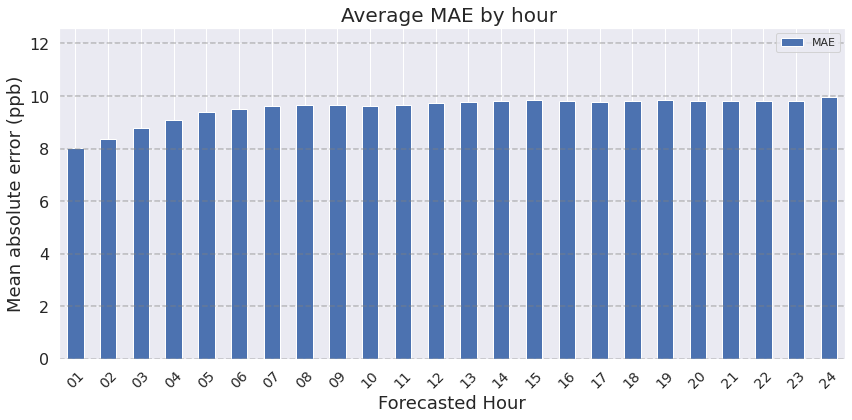

Overall average of RMSE across all hours: 12.5676


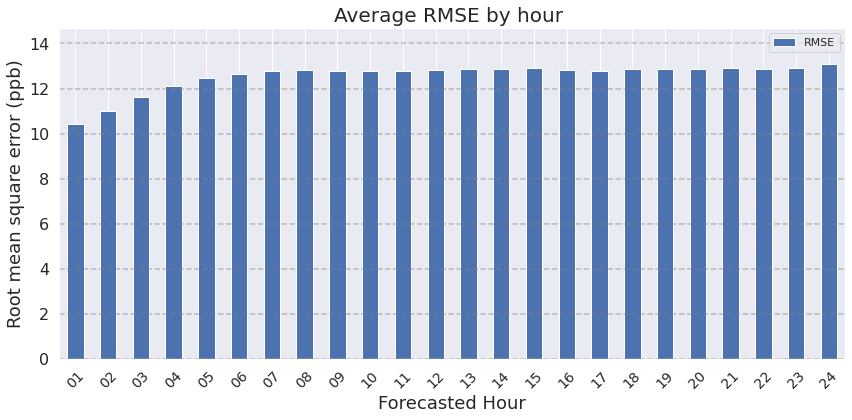

Overall average of R2 across all hours: 0.7568


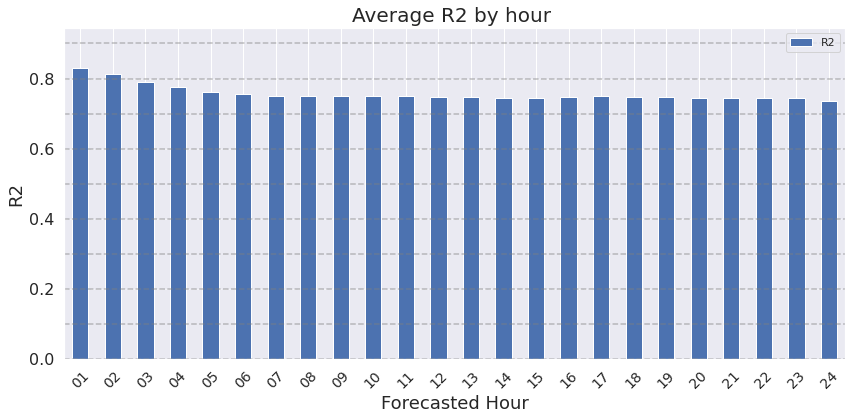

Overall average of Correlation Index across all hours: 0.8809


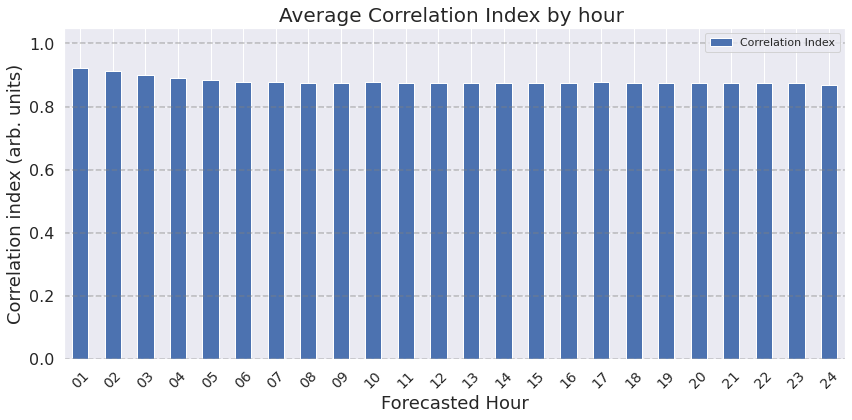

Overall average of Index of agreement across all hours: nan


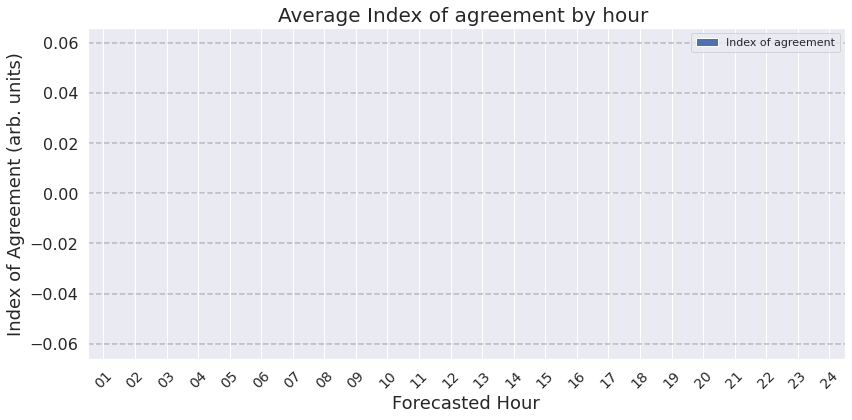

In [38]:
import pandas as pd
from os.path import join
import matplotlib.pyplot as plt

def average_metric_by_hour(results_df, metric, output_results_folder_img=None, 
                           show_grid=True, x_label='Forecasted Hour', y_label=None, 
                           title_suffix='', save_fig=True, title_str=True, 
                           subtitle=True):
    """
    Generate a bar plot for average metrics by hour.
    
    Parameters:
    ...
    """

    # Helper function to calculate average metrics by hour
    def calculate_average_metrics_by_hour(df, key):
        return df[df['Columna'].str.contains(key)][metric].mean()

    hour_keys = sorted(set(results_df['Columna'].apply(lambda x: x.split('_')[1])), 
                       key=lambda x: int(x.split('plus_')[-1]))
    average_metrics = [calculate_average_metrics_by_hour(results_df, key) for key in hour_keys]
    
    # Create DataFrame
    average_metrics_df = pd.DataFrame({x_label: hour_keys, metric: average_metrics})

    # Overall Average
    overall_average_metric = average_metrics_df[metric].mean()
    print(f"Overall average of {metric} across all hours: {overall_average_metric:.4f}")

    # Plotting
    ax = average_metrics_df.plot(x=x_label, y=metric, kind='bar', figsize=(12, 6))

    # Title Handling
    if isinstance(title_str, str):
        pass
    elif title_str:
        title_str = f'Average {metric} by hour {title_suffix}'
    else:
        title_str = ''
    
    if subtitle:
        title_str += f"\n Overall average of {metric} across all hours: {overall_average_metric:.4f}"
    
    ax.set_title(title_str, fontsize=20)
    ax.set_ylabel(y_label if y_label else metric, fontsize=18)
    ax.set_xlabel(x_label, fontsize=18)
    
    if show_grid:
        y_ticks = plt.gca().get_yticks()
        for y in y_ticks:
            plt.axhline(y, color='gray', linestyle='dashed', alpha=0.5)
        plt.grid(True, axis='y', linestyle='dashed', alpha=0.5)
    
    ax.tick_params(axis='x', labelsize=14)
    ax.tick_params(axis='y', labelsize=16)
    
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    if save_fig and output_results_folder_img:
        plt.savefig(join(output_results_folder_img, f'avg_hours_plot_{metric.lower()}.png'), dpi=300)
    
    plt.show()
# %% Llamada a función para graficar las métricas de resumen de todas las estaciones por hora
average_metric_by_hour(results_df, 'MAE', output_results_folder_img, show_grid=True, x_label='Forecasted Hour', y_label='Mean absolute error (ppb)',title_str=True,title_suffix='', save_fig=True,subtitle=False)
average_metric_by_hour(results_df, 'RMSE', output_results_folder_img, show_grid=True, x_label='Forecasted Hour', y_label='Root mean square error (ppb)',title_str=True,title_suffix='', save_fig=True,subtitle=False)
average_metric_by_hour(results_df, 'R2', output_results_folder_img, show_grid=True, x_label='Forecasted Hour', y_label='R2',title_str=True,title_suffix='', save_fig=True,subtitle=False)
average_metric_by_hour(results_df, 'Correlation Index', output_results_folder_img, show_grid=True, x_label='Forecasted Hour', y_label='Correlation index (arb. units)',title_str=True,title_suffix='', save_fig=True,subtitle=False)
average_metric_by_hour(results_df, 'Index of agreement', output_results_folder_img, show_grid=True, x_label='Forecasted Hour', y_label='Index of Agreement (arb. units)',title_str=True,title_suffix='', save_fig=True,subtitle=False)


24h Errors

plus_01_cont_otres_UIZ
Error promedio al comparar valores máximos cada 24 hrs: 4.998422144227109
Desviación estándar de diferencia en valores máximos diarios: 12.42738826684824


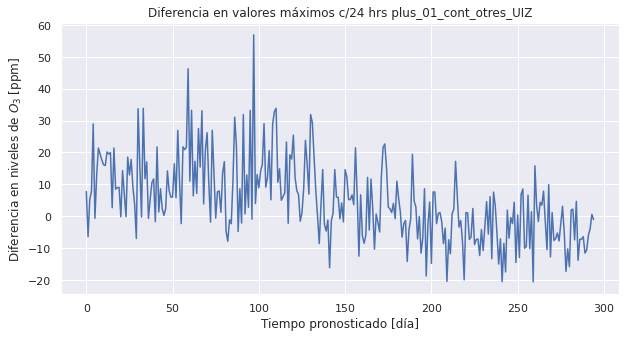

plus_06_cont_otres_UIZ
Error promedio al comparar valores máximos cada 24 hrs: 4.501271503254519
Desviación estándar de diferencia en valores máximos diarios: 17.058492970969926


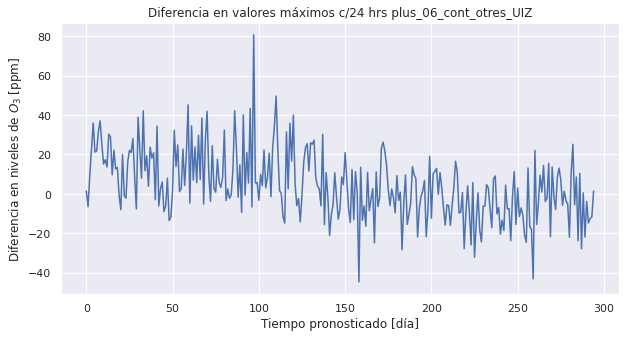

plus_12_cont_otres_UIZ
Error promedio al comparar valores máximos cada 24 hrs: 7.398984526312072
Desviación estándar de diferencia en valores máximos diarios: 15.778194264323178


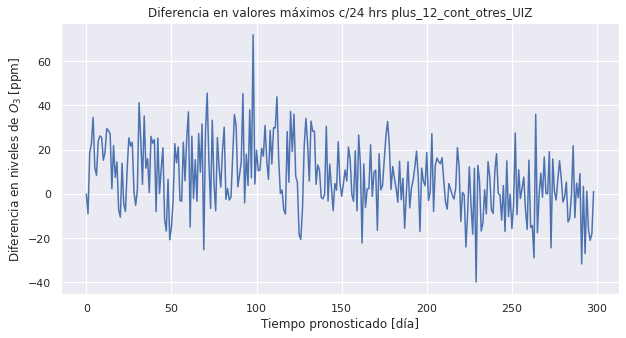

plus_18_cont_otres_UIZ
Error promedio al comparar valores máximos cada 24 hrs: 7.192483982524356
Desviación estándar de diferencia en valores máximos diarios: 16.85538015229221


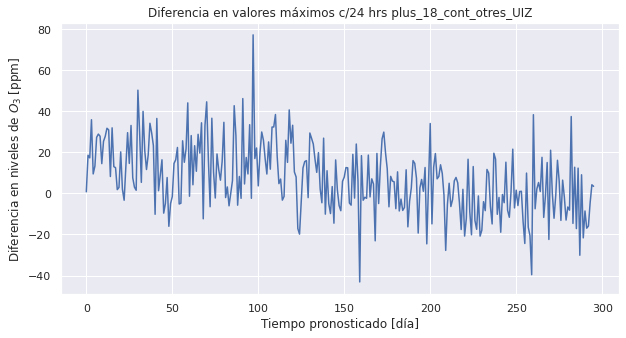

plus_24_cont_otres_UIZ
Error promedio al comparar valores máximos cada 24 hrs: 8.10032563469037
Desviación estándar de diferencia en valores máximos diarios: 17.842632761683543


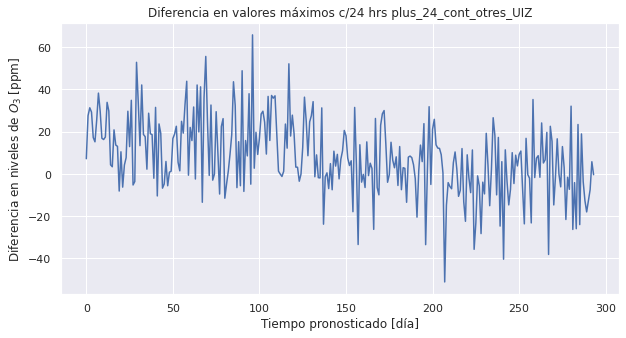

plus_01_cont_otres_AJU
Error promedio al comparar valores máximos cada 24 hrs: 17.586409340077395
Desviación estándar de diferencia en valores máximos diarios: 18.23452213721007


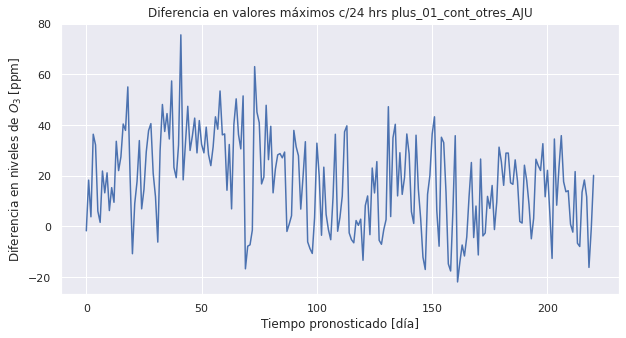

plus_06_cont_otres_AJU
Error promedio al comparar valores máximos cada 24 hrs: 17.268779479705536
Desviación estándar de diferencia en valores máximos diarios: 19.816406324176942


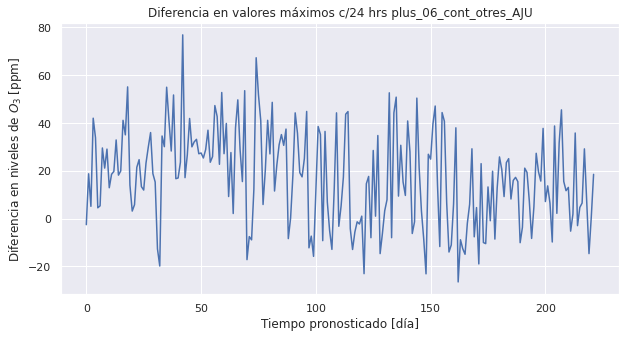

plus_12_cont_otres_AJU
Error promedio al comparar valores máximos cada 24 hrs: 19.61732495797647
Desviación estándar de diferencia en valores máximos diarios: 19.052380683108723


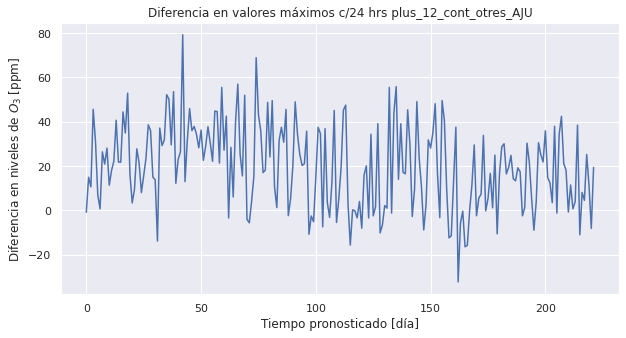

plus_18_cont_otres_AJU
Error promedio al comparar valores máximos cada 24 hrs: 20.05894964430067
Desviación estándar de diferencia en valores máximos diarios: 20.09875769826661


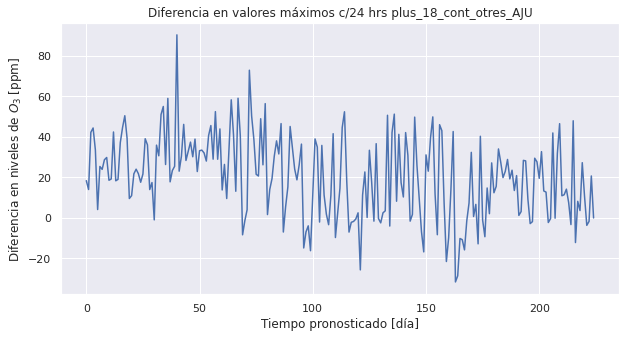

plus_24_cont_otres_AJU
Error promedio al comparar valores máximos cada 24 hrs: 18.786757011936135
Desviación estándar de diferencia en valores máximos diarios: 21.35682668352127


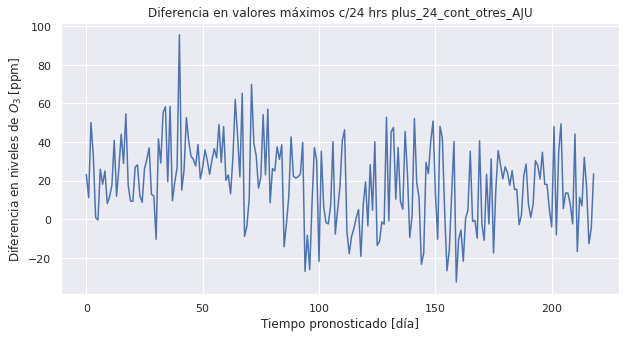

plus_01_cont_otres_ATI
Error promedio al comparar valores máximos cada 24 hrs: -5.129151033632683
Desviación estándar de diferencia en valores máximos diarios: 11.109957142069682


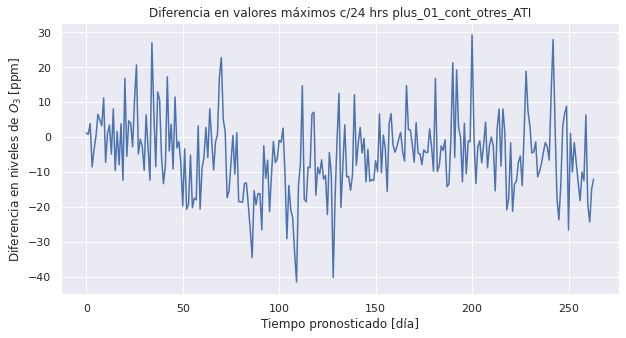

plus_06_cont_otres_ATI
Error promedio al comparar valores máximos cada 24 hrs: -4.700210137474806
Desviación estándar de diferencia en valores máximos diarios: 15.51406774336254


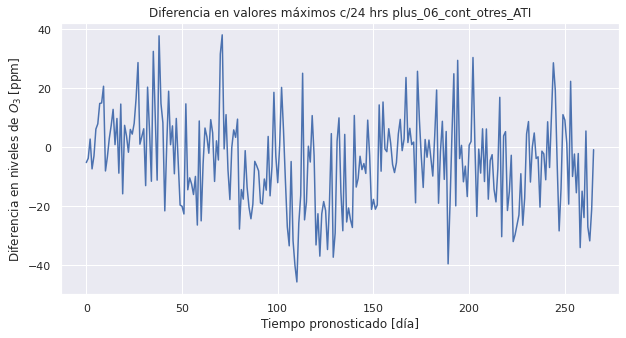

plus_12_cont_otres_ATI
Error promedio al comparar valores máximos cada 24 hrs: -3.320799583779242
Desviación estándar de diferencia en valores máximos diarios: 15.121605542026291


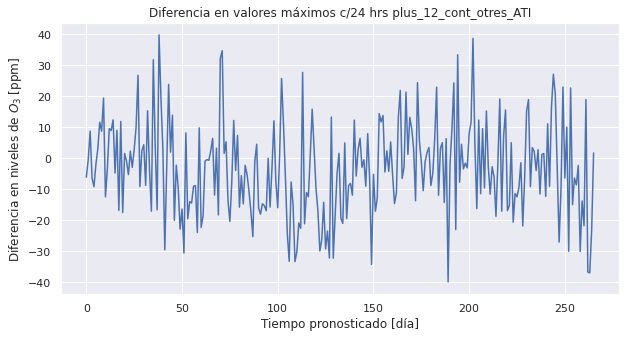

plus_18_cont_otres_ATI
Error promedio al comparar valores máximos cada 24 hrs: -3.8999148242878463
Desviación estándar de diferencia en valores máximos diarios: 14.736732184703273


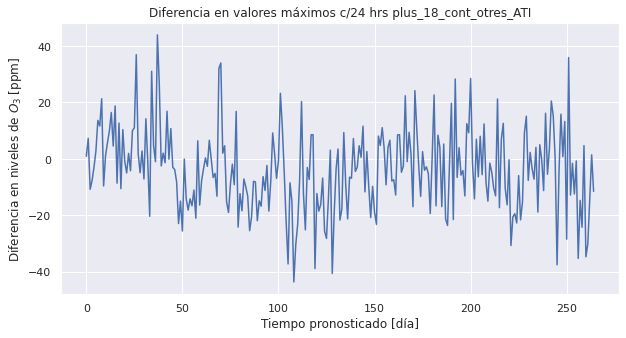

plus_24_cont_otres_ATI
Error promedio al comparar valores máximos cada 24 hrs: -3.532945388218142
Desviación estándar de diferencia en valores máximos diarios: 16.2954444506172


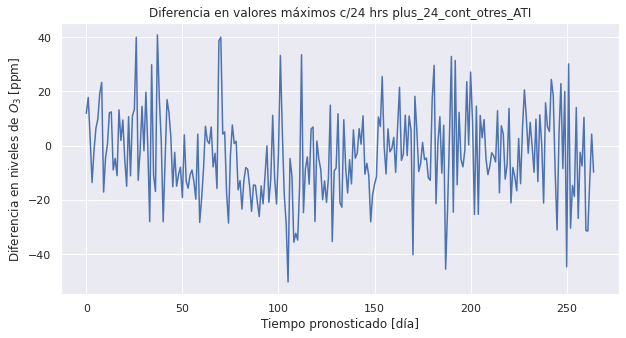

plus_01_cont_otres_UAX
Error promedio al comparar valores máximos cada 24 hrs: -2.5983590592851153
Desviación estándar de diferencia en valores máximos diarios: 18.160769440360454


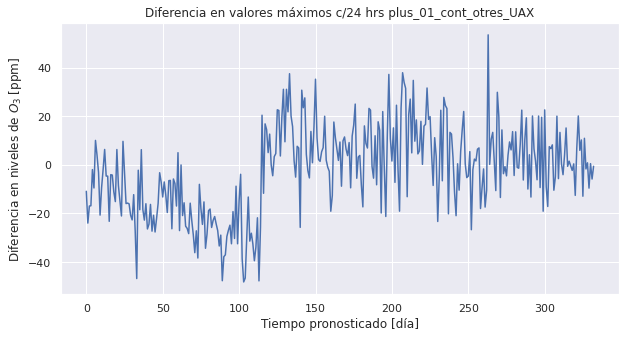

plus_06_cont_otres_UAX
Error promedio al comparar valores máximos cada 24 hrs: -2.944819872964642
Desviación estándar de diferencia en valores máximos diarios: 22.235302268412944


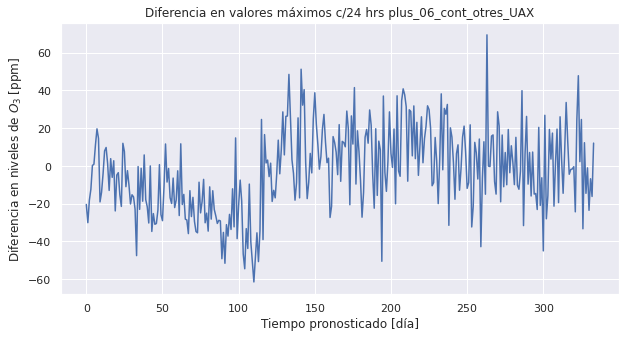

plus_12_cont_otres_UAX
Error promedio al comparar valores máximos cada 24 hrs: 1.3117428393591017
Desviación estándar de diferencia en valores máximos diarios: 21.452149862477473


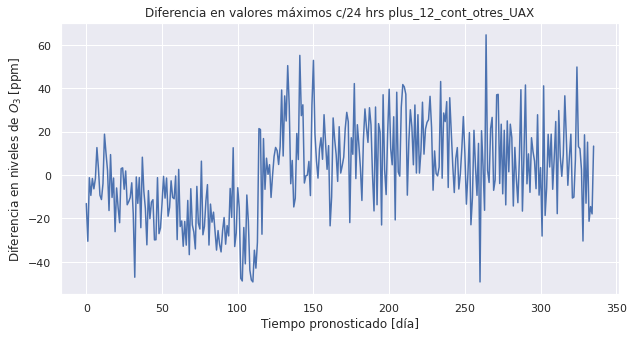

plus_18_cont_otres_UAX
Error promedio al comparar valores máximos cada 24 hrs: -0.42040453186954363
Desviación estándar de diferencia en valores máximos diarios: 21.323003802491982


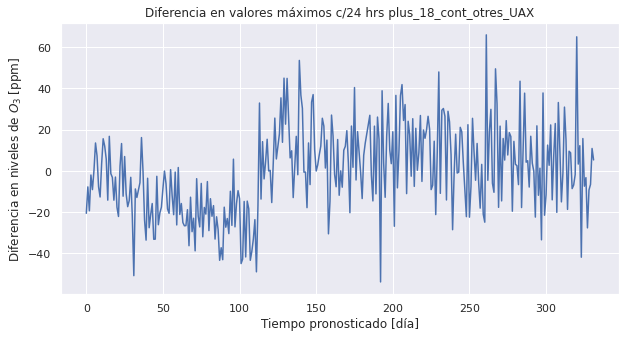

plus_24_cont_otres_UAX
Error promedio al comparar valores máximos cada 24 hrs: 0.9515719903559843
Desviación estándar de diferencia en valores máximos diarios: 22.76848230452815


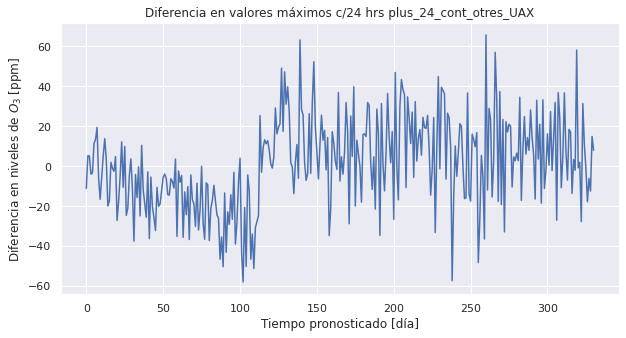

Promedio de h24_max_err_mean: 5.061320931160385
Promedio de h24_max_err_std: 17.861924834172537


In [39]:
# %% Calculo de valores máximos por cada 24 horas. 
# Crear un DataFrame vacío
# TODO, poner opcion para bloquear el graficado.
results_max_df = pd.DataFrame(columns=[
    'max_y_true', 'max_y_pred', 'h24_max_err_mean', 'h24_max_err_std'
])

# Rellenar el DataFrame con los resultados de la función
for cur_column in params_grid:
    print(cur_column)
    max_y_true, max_y_pred, h24_max_err_mean, h24_max_err_std = plot_max_difference(
        cur_column, y_true_df, y_pred_descaled_df)
    results_max_df = results_max_df.append(
        {
            'max_y_true': max_y_true,
            'max_y_pred': max_y_pred,
            'h24_max_err_mean': h24_max_err_mean,
            'h24_max_err_std': h24_max_err_std
        },
        ignore_index=True)

# Calcular el promedio de las cuatro columnas
average_h24_max_err_mean = results_max_df['h24_max_err_mean'].mean()
average_h24_max_err_std = results_max_df['h24_max_err_std'].mean()

print("Promedio de h24_max_err_mean:", average_h24_max_err_mean)
print("Promedio de h24_max_err_std:", average_h24_max_err_std)


In [40]:
# Inicializar nuevas columnas para almacenar los resultados adicionales
results_df['h24_max_err_mean'] = 0.0
results_df['h24_max_err_std'] = 0.0
results_df['h24_mean_err_mean'] = 0.0
results_df['h24_mean_err_std'] = 0.0
errors_dict = {}

# Iterar a través de cada fila en el DataFrame para actualizar las nuevas columnas
for index, row in results_df.iterrows():
    cur_column = row['Columna']
    # Llamar a la función plot_max_and_mean_difference y obtener los resultados
    max_y_true, max_y_pred, h24_max_err_mean, h24_max_err_std, mean_y_true, mean_y_pred, h24_mean_err_mean, h24_mean_err_std = plot_max_and_mean_difference(cur_column, y_true_df, y_pred_descaled_df)
    
    # Actualizar las nuevas columnas con los resultados obtenidos
    results_df.loc[index, 'h24_max_err_mean'] = h24_max_err_mean
    results_df.loc[index, 'h24_max_err_std'] = h24_max_err_std
    results_df.loc[index, 'h24_mean_err_mean'] = h24_mean_err_mean
    results_df.loc[index, 'h24_mean_err_std'] = h24_mean_err_std
    # Almacenar max_y_true, max_y_pred, mean_y_true, y mean_y_pred en el diccionario errors_dict
    errors_dict[cur_column] = {
        'max_y_true': max_y_true,
        'max_y_pred': max_y_pred,
        'mean_y_true': mean_y_true,
        'mean_y_pred': mean_y_pred
    }
# Ahora, results_df debería tener las nuevas columnas llenas con los resultados de la función

plus_01_cont_otres_UIZ
Maximum error mean over 24 hrs: 4.998422144227109
Maximum error std dev over 24 hrs: 12.42738826684824
Mean error mean over 24 hrs: 0.596750082707001
Mean error std dev over 24 hrs: 4.389974561507988
plus_01_cont_otres_AJU
Maximum error mean over 24 hrs: 17.586409340077395
Maximum error std dev over 24 hrs: 18.23452213721007
Mean error mean over 24 hrs: 0.9374238187011734
Mean error std dev over 24 hrs: 6.171589247891838
plus_01_cont_otres_ATI
Maximum error mean over 24 hrs: -5.129151033632683
Maximum error std dev over 24 hrs: 11.109957142069682
Mean error mean over 24 hrs: -3.441873440838824
Mean error std dev over 24 hrs: 3.4410890561963345
plus_01_cont_otres_CUA
Maximum error mean over 24 hrs: 2.37944405635427
Maximum error std dev over 24 hrs: 16.107889898101625
Mean error mean over 24 hrs: 1.9094459018835535
Mean error std dev over 24 hrs: 5.1410317375349885
plus_01_cont_otres_SFE
Maximum error mean over 24 hrs: -2.791813711632885
Maximum error std dev over

plus_04_cont_otres_SAG
Maximum error mean over 24 hrs: 5.068300693754166
Maximum error std dev over 24 hrs: 12.42675793981989
Mean error mean over 24 hrs: 0.7519582405134483
Mean error std dev over 24 hrs: 4.259975691662846
plus_04_cont_otres_CUT
Maximum error mean over 24 hrs: 9.193024011239114
Maximum error std dev over 24 hrs: 14.889443469611333
Mean error mean over 24 hrs: -0.3921328962018065
Mean error std dev over 24 hrs: 4.240699017693821
plus_04_cont_otres_PED
Maximum error mean over 24 hrs: 2.610255216370519
Maximum error std dev over 24 hrs: 17.451053453539345
Mean error mean over 24 hrs: 2.1076755301250314
Mean error std dev over 24 hrs: 4.797689997135615
plus_04_cont_otres_TAH
Maximum error mean over 24 hrs: 14.46897483890892
Maximum error std dev over 24 hrs: 17.17511191387661
Mean error mean over 24 hrs: 2.5436456185347223
Mean error std dev over 24 hrs: 5.066539024156738
plus_04_cont_otres_GAM
Maximum error mean over 24 hrs: 11.100004923826008
Maximum error std dev over 

plus_07_cont_otres_CAM
Maximum error mean over 24 hrs: 3.59821341084499
Maximum error std dev over 24 hrs: 22.200690389520346
Mean error mean over 24 hrs: 1.5257857064016511
Mean error std dev over 24 hrs: 7.372100093236733
plus_07_cont_otres_FAC
Maximum error mean over 24 hrs: 4.924994344414125
Maximum error std dev over 24 hrs: 17.36004978316228
Mean error mean over 24 hrs: 1.4748551360383362
Mean error std dev over 24 hrs: 5.461700904193056
plus_07_cont_otres_TLA
Maximum error mean over 24 hrs: 2.776166162921884
Maximum error std dev over 24 hrs: 14.902943053041895
Mean error mean over 24 hrs: 0.5003546173991231
Mean error std dev over 24 hrs: 4.523060150434793
plus_07_cont_otres_MER
Maximum error mean over 24 hrs: 2.727118357426703
Maximum error std dev over 24 hrs: 17.699115804804176
Mean error mean over 24 hrs: 2.0669536957633023
Mean error std dev over 24 hrs: 5.513554868775705
plus_07_cont_otres_XAL
Maximum error mean over 24 hrs: 3.242372410733935
Maximum error std dev over 24

plus_10_cont_otres_FAC
Maximum error mean over 24 hrs: 6.456880267730541
Maximum error std dev over 24 hrs: 17.884852493636185
Mean error mean over 24 hrs: 1.475801539735381
Mean error std dev over 24 hrs: 5.852623090766052
plus_10_cont_otres_TLA
Maximum error mean over 24 hrs: 2.801284550948882
Maximum error std dev over 24 hrs: 15.431617456729048
Mean error mean over 24 hrs: -0.21407854377943572
Mean error std dev over 24 hrs: 5.214346312520472
plus_10_cont_otres_MER
Maximum error mean over 24 hrs: 3.2478742142798196
Maximum error std dev over 24 hrs: 17.429908782626107
Mean error mean over 24 hrs: 1.5639692802384426
Mean error std dev over 24 hrs: 5.8691975430943355
plus_10_cont_otres_XAL
Maximum error mean over 24 hrs: 3.8936565056275785
Maximum error std dev over 24 hrs: 15.318929721617492
Mean error mean over 24 hrs: -0.22008371576387795
Mean error std dev over 24 hrs: 5.3791767180285825
plus_10_cont_otres_LLA
Maximum error mean over 24 hrs: 4.012966974215074
Maximum error std de

plus_12_cont_otres_AJM
Maximum error mean over 24 hrs: 1.745057072358973
Maximum error std dev over 24 hrs: 17.24706263491926
Mean error mean over 24 hrs: -3.6983259911630673
Mean error std dev over 24 hrs: 7.079876085855529
plus_12_cont_otres_VIF
Maximum error mean over 24 hrs: 9.752257976247304
Maximum error std dev over 24 hrs: 16.452187889552945
Mean error mean over 24 hrs: 0.6077950686364624
Mean error std dev over 24 hrs: 6.03677144885438
plus_13_cont_otres_UIZ
Maximum error mean over 24 hrs: 8.260789890353097
Maximum error std dev over 24 hrs: 15.975092984811626
Mean error mean over 24 hrs: 0.7997066586578436
Mean error std dev over 24 hrs: 5.766253749934663
plus_13_cont_otres_AJU
Maximum error mean over 24 hrs: 20.837967160600343
Maximum error std dev over 24 hrs: 18.218499678144877
Mean error mean over 24 hrs: 0.9410021015601634
Mean error std dev over 24 hrs: 6.843986928177
plus_13_cont_otres_ATI
Maximum error mean over 24 hrs: -1.8716424067217605
Maximum error std dev over 2

plus_15_cont_otres_LPR
Maximum error mean over 24 hrs: -4.809283517112195
Maximum error std dev over 24 hrs: 16.991982130339135
Mean error mean over 24 hrs: -4.670369373240941
Mean error std dev over 24 hrs: 6.71340903996474
plus_15_cont_otres_MGH
Maximum error mean over 24 hrs: 1.8538329073694908
Maximum error std dev over 24 hrs: 16.60725679910016
Mean error mean over 24 hrs: -1.9761758500677082
Mean error std dev over 24 hrs: 5.801447371656011
plus_15_cont_otres_CAM
Maximum error mean over 24 hrs: 7.773204195733164
Maximum error std dev over 24 hrs: 19.025697330136044
Mean error mean over 24 hrs: 1.9016980392480984
Mean error std dev over 24 hrs: 6.6764427275948375
plus_15_cont_otres_FAC
Maximum error mean over 24 hrs: 7.4042903975154575
Maximum error std dev over 24 hrs: 17.08358137264059
Mean error mean over 24 hrs: 1.0276128621806813
Mean error std dev over 24 hrs: 5.567042392008397
plus_15_cont_otres_TLA
Maximum error mean over 24 hrs: 4.656300046470728
Maximum error std dev ove

plus_17_cont_otres_MPA
Maximum error mean over 24 hrs: 16.445690778060083
Maximum error std dev over 24 hrs: 16.789304573460324
Mean error mean over 24 hrs: -0.5923938395983852
Mean error std dev over 24 hrs: 7.4877901963832425
plus_17_cont_otres_MON
Maximum error mean over 24 hrs: 6.03117800842632
Maximum error std dev over 24 hrs: 13.592403341914341
Mean error mean over 24 hrs: -1.0259793581384602
Mean error std dev over 24 hrs: 5.114528612698964
plus_17_cont_otres_NEZ
Maximum error mean over 24 hrs: 11.332575476169586
Maximum error std dev over 24 hrs: 16.40856301523971
Mean error mean over 24 hrs: 2.3533831705649693
Mean error std dev over 24 hrs: 5.603707428820582
plus_17_cont_otres_INN
Maximum error mean over 24 hrs: 10.234055459082544
Maximum error std dev over 24 hrs: 17.095222161697457
Mean error mean over 24 hrs: -1.5300154330291393
Mean error std dev over 24 hrs: 7.081963396873817
plus_17_cont_otres_AJM
Maximum error mean over 24 hrs: 2.812661856935735
Maximum error std dev 

Mean error mean over 24 hrs: -1.8317257644961247
Mean error std dev over 24 hrs: 7.225211624432424
plus_19_cont_otres_AJM
Maximum error mean over 24 hrs: 0.28341571629395956
Maximum error std dev over 24 hrs: 17.69771089139851
Mean error mean over 24 hrs: -4.056794848823176
Mean error std dev over 24 hrs: 7.174696258544627
plus_19_cont_otres_VIF
Maximum error mean over 24 hrs: 6.874891366787299
Maximum error std dev over 24 hrs: 15.358450469661099
Mean error mean over 24 hrs: -0.18541650667399928
Mean error std dev over 24 hrs: 5.225808366032615
plus_20_cont_otres_UIZ
Maximum error mean over 24 hrs: 4.614148650735111
Maximum error std dev over 24 hrs: 17.51133276696394
Mean error mean over 24 hrs: 0.09092774788538621
Mean error std dev over 24 hrs: 5.900617981435995
plus_20_cont_otres_AJU
Maximum error mean over 24 hrs: 18.526532070056813
Maximum error std dev over 24 hrs: 20.462349442679088
Mean error mean over 24 hrs: 0.9210932938544243
Mean error std dev over 24 hrs: 6.6474140140087

Mean error mean over 24 hrs: 0.11653782748311027
Mean error std dev over 24 hrs: 6.018360333859865
plus_22_cont_otres_AJU
Maximum error mean over 24 hrs: 17.713529011150737
Maximum error std dev over 24 hrs: 21.52457280393748
Mean error mean over 24 hrs: 0.6039716054548372
Mean error std dev over 24 hrs: 6.909473319628174
plus_22_cont_otres_ATI
Maximum error mean over 24 hrs: -3.8861352740593675
Maximum error std dev over 24 hrs: 15.288325505059387
Mean error mean over 24 hrs: -4.5017729361852
Mean error std dev over 24 hrs: 4.727735238548828
plus_22_cont_otres_CUA
Maximum error mean over 24 hrs: 1.9925229193150311
Maximum error std dev over 24 hrs: 19.979360212756067
Mean error mean over 24 hrs: 0.9668518120415821
Mean error std dev over 24 hrs: 6.569353532771235
plus_22_cont_otres_SFE
Maximum error mean over 24 hrs: -3.2702565916551527
Maximum error std dev over 24 hrs: 18.055438431838752
Mean error mean over 24 hrs: -3.974701591751032
Mean error std dev over 24 hrs: 6.41503186941076

Maximum error std dev over 24 hrs: 20.5348804732182
Mean error mean over 24 hrs: 1.5253025814389862
Mean error std dev over 24 hrs: 6.8078081210971675
plus_24_cont_otres_SFE
Maximum error mean over 24 hrs: -0.7262392636411679
Maximum error std dev over 24 hrs: 19.222355449520517
Mean error mean over 24 hrs: -3.1043489166915297
Mean error std dev over 24 hrs: 6.625090429677075
plus_24_cont_otres_SAG
Maximum error mean over 24 hrs: 8.687204870094815
Maximum error std dev over 24 hrs: 14.343256891265453
Mean error mean over 24 hrs: 0.629341474369386
Mean error std dev over 24 hrs: 5.352785671290561
plus_24_cont_otres_CUT
Maximum error mean over 24 hrs: 8.923983425743836
Maximum error std dev over 24 hrs: 15.754502771993403
Mean error mean over 24 hrs: -1.2485385511330067
Mean error std dev over 24 hrs: 4.878301680591048
plus_24_cont_otres_PED
Maximum error mean over 24 hrs: 6.054098479601802
Maximum error std dev over 24 hrs: 20.178823588202853
Mean error mean over 24 hrs: 1.5948627739420

## <a id="Scatter_Plots_of_24h_Error_Graphics">Scatter Plots of 24h Error Eval</a>
### Max, Average
- [Return to Plots Index](#Plots_index)  

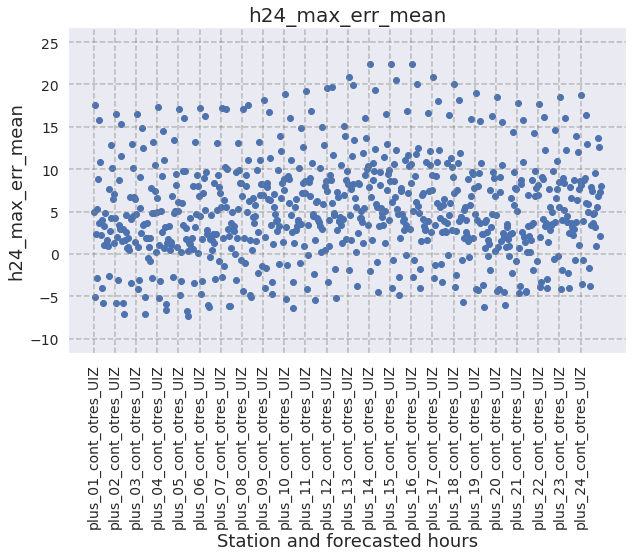

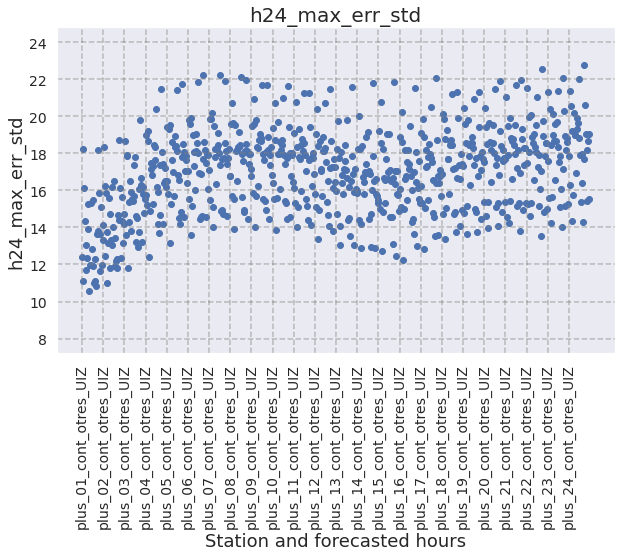

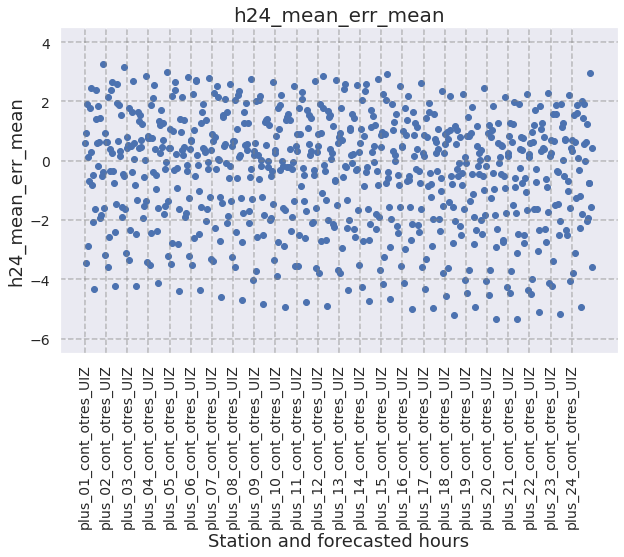

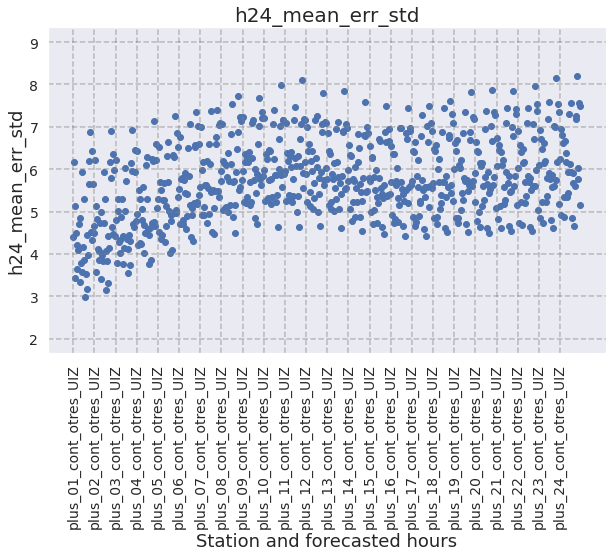

In [41]:
scatter_plot_by_column(results_df, 'h24_max_err_mean',
                output_results_folder_img)
scatter_plot_by_column(results_df, 'h24_max_err_std',
                output_results_folder_img)
scatter_plot_by_column(results_df, 'h24_mean_err_mean',
                output_results_folder_img)
scatter_plot_by_column(results_df, 'h24_mean_err_std',
                output_results_folder_img)

## <a id="Bar_Charts_of_24h_Errors_over_Stations">Bar Charts of 24h Errors over Stations</a>
### Max, Average
- [Return to Plots Index](#Plots_index)  

Per station h24_max_err_mean: 5.2093


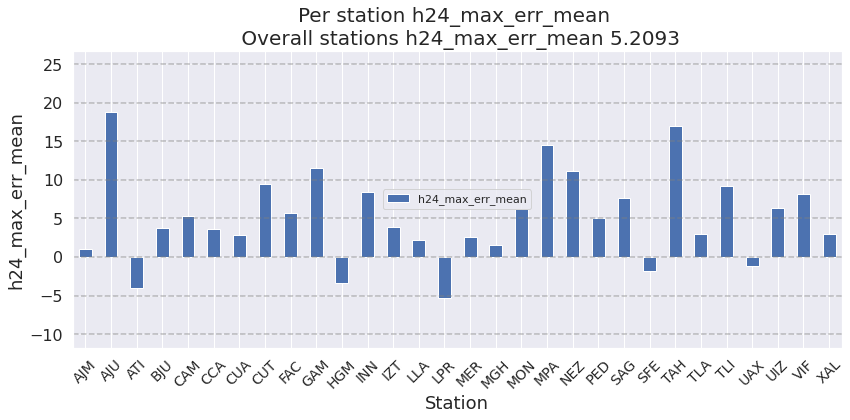

Per station h24_max_err_std: 16.9803


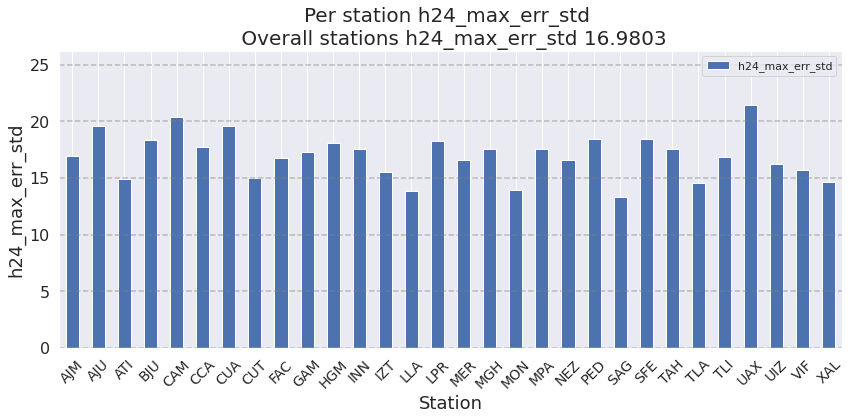

Per station h24_mean_err_mean: -0.4149


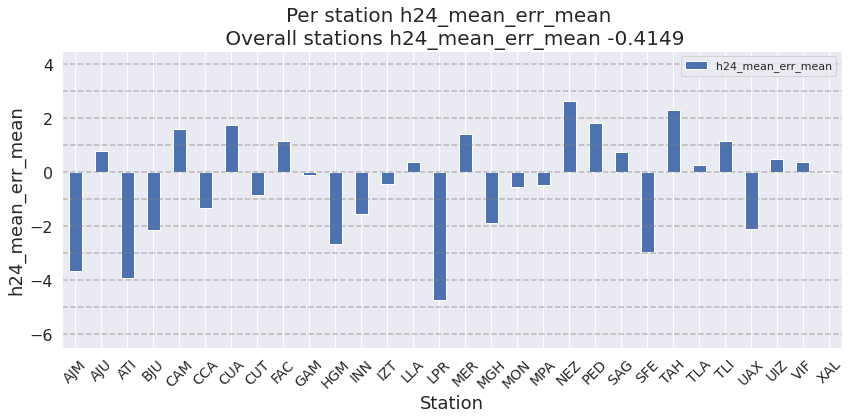

Per station h24_mean_err_std: 5.7490


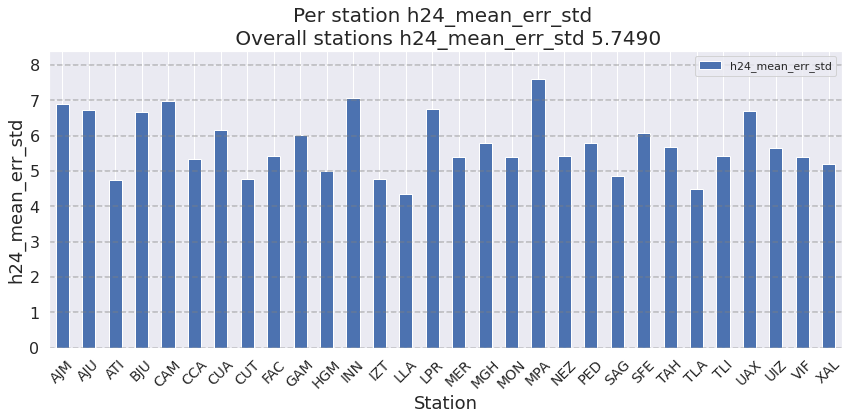

In [42]:
import warnings

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    # Tu código aquí callando warnings
    average_metric(results_df, 'h24_max_err_mean', output_results_folder_img)
    average_metric(results_df, 'h24_max_err_std', output_results_folder_img)
    average_metric(results_df, 'h24_mean_err_mean', output_results_folder_img)
    average_metric(results_df, 'h24_mean_err_std', output_results_folder_img)

## <a id="Results_df_Table">Results_df Table</a>
- [Return to Plots Index](#Plots_index)  

## <a id="Histogram_Fit">Histogram Fit</a>
- [Return to Plots Index](#Plots_index)  

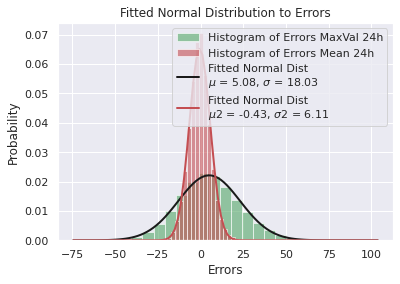

In [43]:
# Case for overall h24_max_err of the model

import numpy as np

from scipy.stats import norm


overall_errors = []

# Loop over the dictionary keys and values

for columna, values in errors_dict.items():

    max_y_true = values['max_y_true']

    max_y_pred = values['max_y_pred']

    errors = max_y_true - max_y_pred

    # Filtering out zeros

    for error in errors:

        if error != 0:

            overall_errors.append(error)


# Convert to numpy array for easier statistical analysis

overall_errors = np.array(overall_errors)


# Fit a normal distribution to the errors data

mu, std = norm.fit(overall_errors)


# Create a histogram of the errors

plt.hist(overall_errors, bins=25, density=True, alpha=0.6, color='g', label="Histogram of Errors MaxVal 24h")


# Create a PDF of the normal distribution

xmin, xmax = plt.xlim()

x = np.linspace(xmin, xmax, 100)

p = norm.pdf(x, mu, std)

overall_errors2 = []

# Loop over the dictionary keys and values

for columna, values in errors_dict.items():

    max_y_true = values['mean_y_true']

    max_y_pred = values['mean_y_pred']

    errors = max_y_true - max_y_pred

    # Filtering out zeros

    for error in errors:

        if error != 0:

            overall_errors2.append(error)


# Convert to numpy array for easier statistical analysis

overall_errors2 = np.array(overall_errors2)

plt.hist(overall_errors2, bins=25, density=True, alpha=0.6, color='r', label="Histogram of Errors Mean 24h")

mu2, std2 = norm.fit(overall_errors2)
p2 = norm.pdf(x, mu2, std2)


plt.plot(x, p, 'k', linewidth=2, label=f"Fitted Normal Dist\n$\mu$ = {mu:.2f}, $\sigma$ = {std:.2f}")
plt.plot(x, p2, 'r', linewidth=2, label=f"Fitted Normal Dist\n$\mu2$ = {mu2:.2f}, $\sigma2$ = {std2:.2f}")


plt.xlabel("Errors")

plt.ylabel("Probability")

plt.title("Fitted Normal Distribution to Errors")

plt.legend()

plt.show()

#mean_np, std_np, mu, std

## <a id="Overall_Results_Table">Overall Results Table</a>
- [Return to Plots Index](#Plots_index)  

In [44]:
# Overall values of results for the model
overall = results_df.mean()
print(overall)


Correlation Index     8.809097e-01
MAE                   9.540290e+00
MAPE                  1.647712e+14
MSE                   1.600283e+02
RMSE                  1.256765e+01
R2                    7.567871e-01
Index of agreement             NaN
h24_max_err_mean      5.209274e+00
h24_max_err_std       1.698025e+01
h24_mean_err_mean    -4.149484e-01
h24_mean_err_std      5.749001e+00
dtype: float64


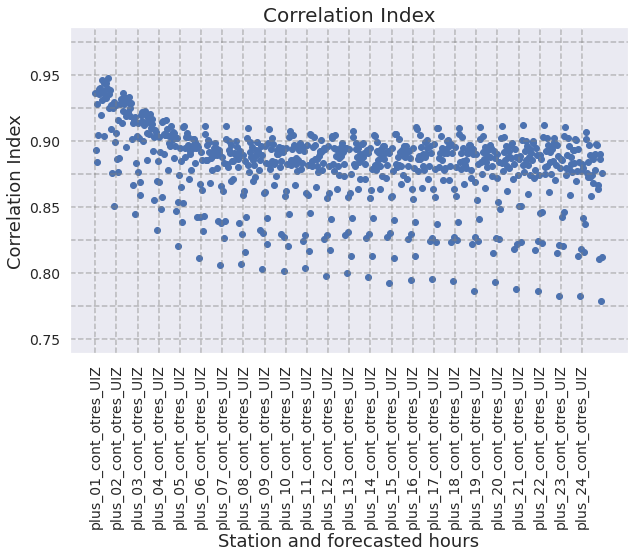

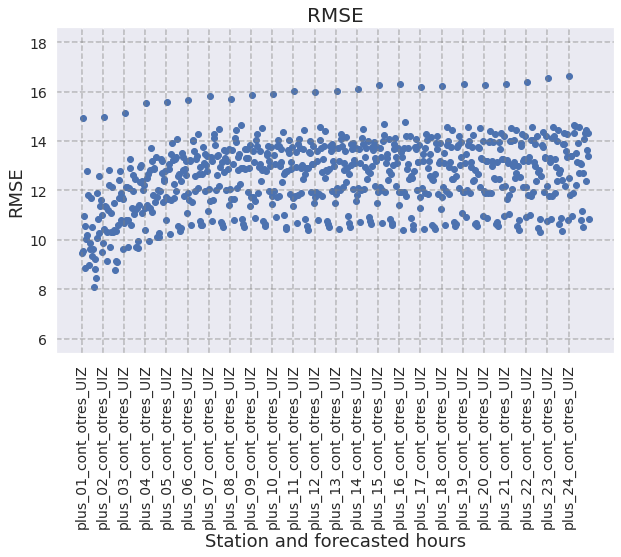

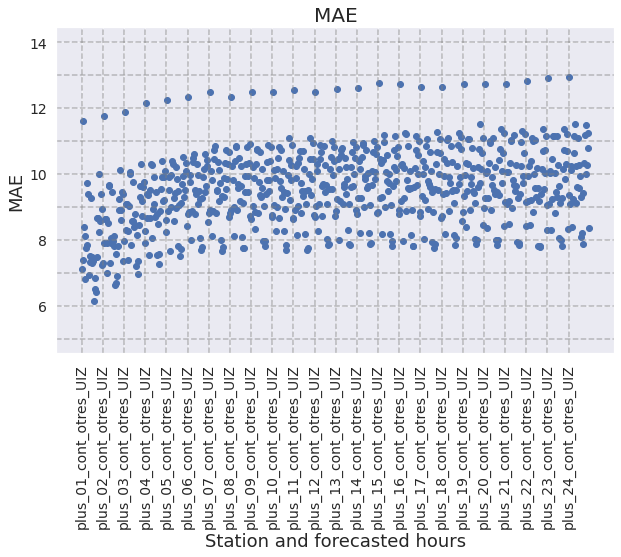

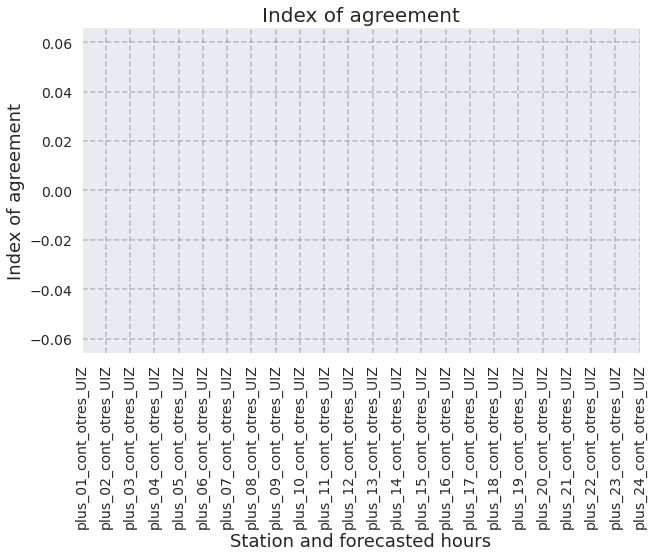

In [45]:
# %% Scatter plot for the given metrics

scatter_plot_by_column(results_df, 'Correlation Index',
                output_results_folder_img)
scatter_plot_by_column(results_df, 'RMSE', output_results_folder_img)
scatter_plot_by_column(results_df, 'MAE', output_results_folder_img)
scatter_plot_by_column(results_df, 'Index of agreement', output_results_folder_img)


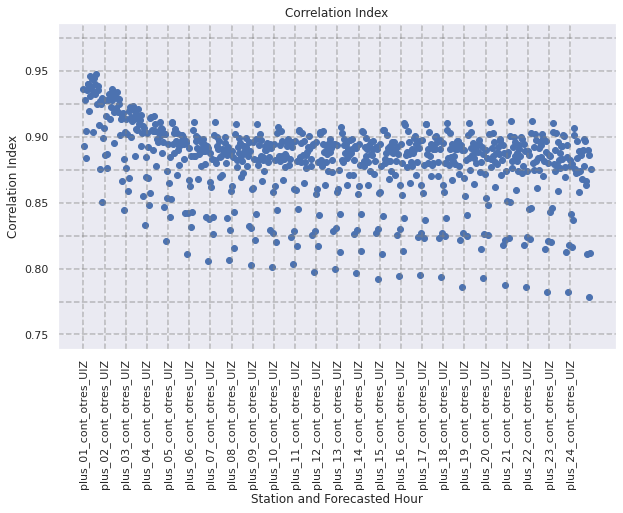

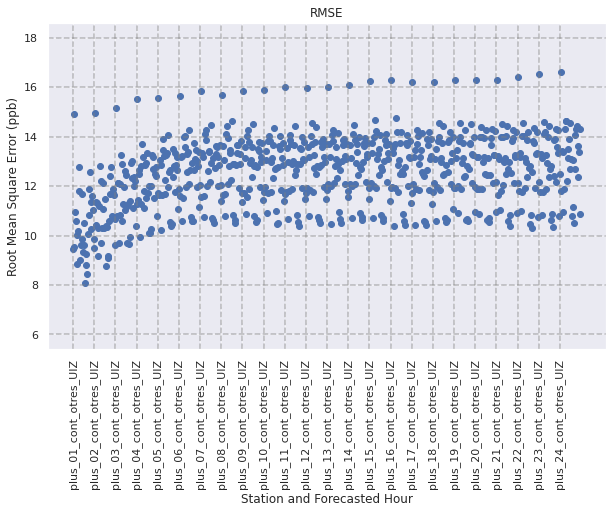

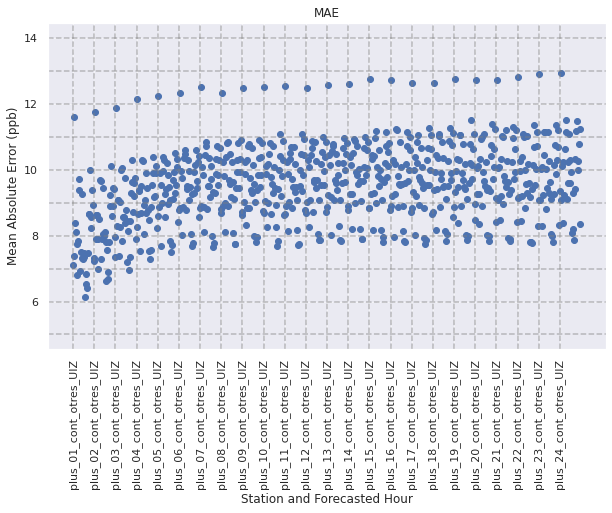

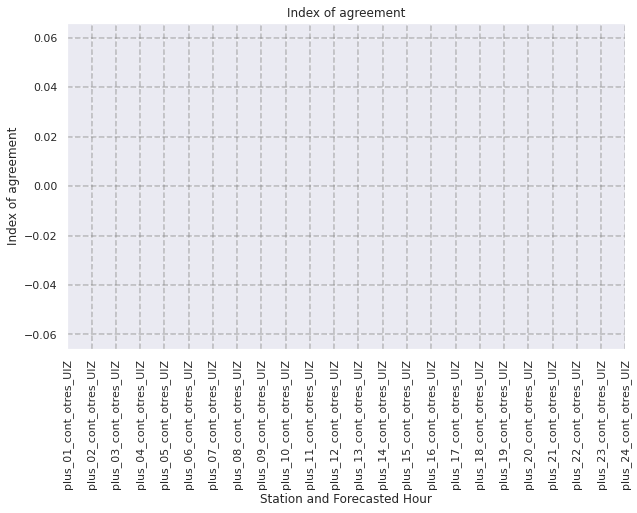

In [46]:
from os.path import join
import matplotlib.pyplot as plt

def scatter_plot_by_column(df, metric, output_folder=None, 
                           show_grid=True, x_label='Station and forecasted hours', 
                           y_label=None, title_str=True, save_fig=True):
    
    plt.figure(figsize=(10, 6))
    plt.scatter(df.index, df[metric])
    
    plt.xlabel(x_label)
    plt.ylabel(y_label if y_label else metric)
    
    if title_str:
        title_str = f'{metric}'
    else:
        title_str = ''
        
    plt.title(title_str)
    
    x_ticks = df.index[::30]
    x_labels = df['Columna'][::30]
    plt.xticks(x_ticks, x_labels, rotation=90)
    
    if show_grid:
        for x in x_ticks:
            plt.axvline(x, color='gray', linestyle='dashed', alpha=0.5)
        plt.grid(True, axis='x', linestyle='dashed', alpha=0.5)
        
        y_ticks = plt.gca().get_yticks()
        for y in y_ticks:
            plt.axhline(y, color='gray', linestyle='dashed', alpha=0.5)
        plt.grid(True, axis='y', linestyle='dashed', alpha=0.5)
    
    if save_fig and output_folder:
        plt.savefig(join(output_folder, f'scatter_plot_{metric.lower()}.png'), dpi=300)
        
    plt.show()

# Ejemplo de uso
# scatter_plot_by_column(results_df, 'MAE', './output_folder', show_grid=True, x_label='Station and Forecasted Hour', y_label='Mean absolute error (ppb)', title_str=True, save_fig=False)
# Para el Índice de Correlación
scatter_plot_by_column(results_df, 'Correlation Index',
                output_results_folder_img, 
                show_grid=True, 
                x_label='Station and Forecasted Hour', 
                y_label='Correlation Index', 
                title_str='Correlation Index Across Stations and Forecasted Hours', 
                save_fig=True)

# Para RMSE
scatter_plot_by_column(results_df, 'RMSE',
                output_results_folder_img, 
                show_grid=True, 
                x_label='Station and Forecasted Hour', 
                y_label='Root Mean Square Error (ppb)', 
                title_str='Root Mean Square Error Across Stations and Forecasted Hours', 
                save_fig=True)

# Para MAE
scatter_plot_by_column(results_df, 'MAE',
                output_results_folder_img, 
                show_grid=True, 
                x_label='Station and Forecasted Hour', 
                y_label='Mean Absolute Error (ppb)', 
                title_str='Mean Absolute Error Across Stations and Forecasted Hours', 
                save_fig=True)

scatter_plot_by_column(results_df, 'Index of agreement',
                output_results_folder_img, 
                show_grid=True, 
                x_label='Station and Forecasted Hour', 
                y_label='Index of agreement', 
                title_str='Index of agreement Across Stations and Forecasted Hours', 
                save_fig=True)




from os.path import join
import matplotlib.pyplot as plt

def scatter_plot_by_column(df, metric, output_folder=None, 
                           show_grid=True, x_label='Station and forecasted hours', 
                           y_label=None, title_str=True, save_fig=True):
    
    plt.figure(figsize=(10, 6))
    plt.scatter(df.index, df[metric])
    
    plt.xlabel(x_label, fontsize=18)  # Tamaño de fuente para la etiqueta del eje x
    plt.ylabel(y_label if y_label else metric, fontsize=18)  # Tamaño de fuente para la etiqueta del eje y
    
    if title_str:
        title_str = f'{metric}'
    else:
        title_str = ''
        
    plt.title(title_str, fontsize=20)  # Tamaño de fuente para el título
    
    x_ticks = df.index[::30]
    x_labels = df['Columna'][::30]
    plt.xticks(x_ticks, x_labels, rotation=90, fontsize=14)  # Tamaño de fuente para las marcas del eje x
    plt.yticks(fontsize=14)  # Tamaño de fuente para las marcas del eje y
    
    if show_grid:
        for x in x_ticks:
            plt.axvline(x, color='gray', linestyle='dashed', alpha=0.5)
        plt.grid(True, axis='x', linestyle='dashed', alpha=0.5)
        
        y_ticks = plt.gca().get_yticks()
        for y in y_ticks:
            plt.axhline(y, color='gray', linestyle='dashed', alpha=0.5)
        plt.grid(True, axis='y', linestyle='dashed', alpha=0.5)
    
    if save_fig and output_folder:
        plt.savefig(join(output_folder, f'scatter_plot_{metric.lower()}.png'), dpi=300)
        
    plt.show()


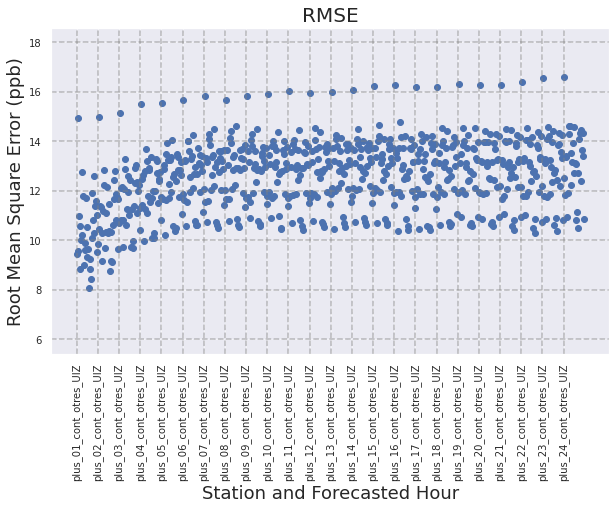

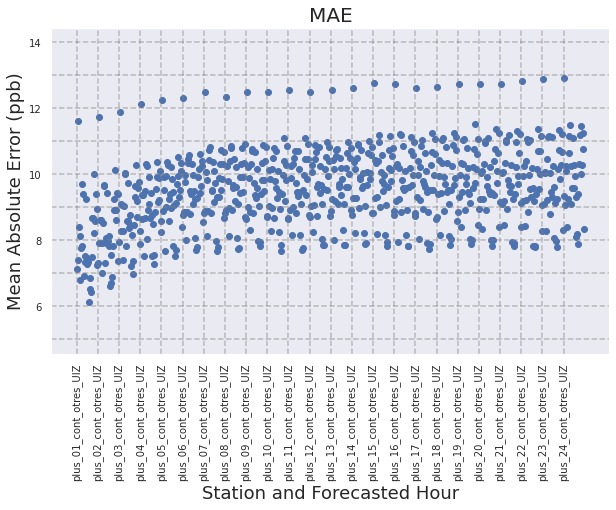

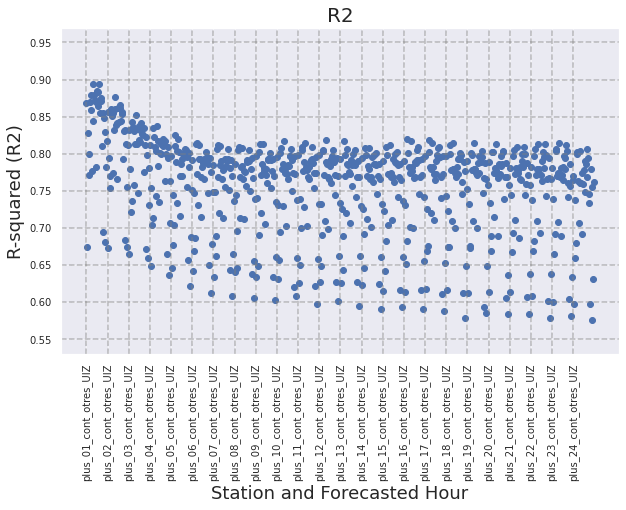

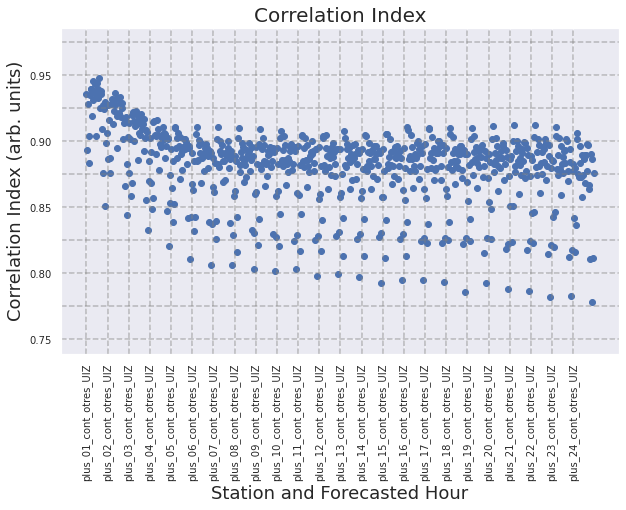

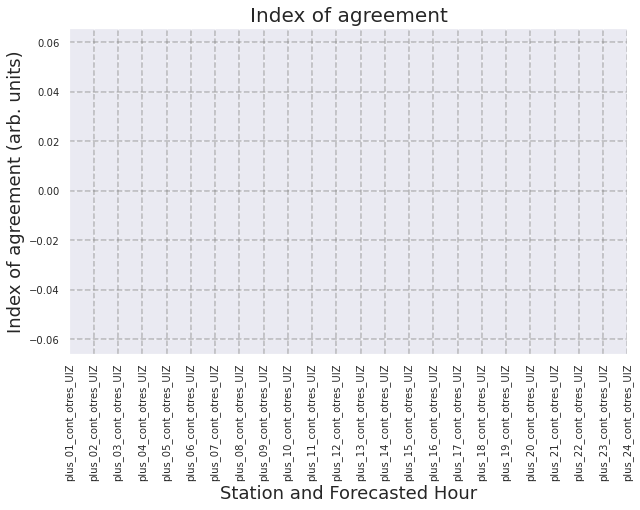

In [47]:
from os.path import join
import matplotlib.pyplot as plt

def scatter_plot_by_column(df, metric, output_folder=None, 
                           show_grid=True, x_label='Station and forecasted hours', 
                           y_label=None, title_str=True, save_fig=True,
                           x_label_fontsize=18, y_label_fontsize=18, 
                           title_fontsize=20, tick_fontsize=14):
    
    plt.figure(figsize=(10, 6))
    plt.scatter(df.index, df[metric])
    
    plt.xlabel(x_label, fontsize=x_label_fontsize)
    plt.ylabel(y_label if y_label else metric, fontsize=y_label_fontsize)
    
    if title_str:
        title_str = f'{metric}'
    else:
        title_str = ''
        
    plt.title(title_str, fontsize=title_fontsize)
    
    x_ticks = df.index[::30]
    x_labels = df['Columna'][::30]
    plt.xticks(x_ticks, x_labels, rotation=90, fontsize=tick_fontsize)
    plt.yticks(fontsize=tick_fontsize)
    
    if show_grid:
        for x in x_ticks:
            plt.axvline(x, color='gray', linestyle='dashed', alpha=0.5)
        plt.grid(True, axis='x', linestyle='dashed', alpha=0.5)
        
        y_ticks = plt.gca().get_yticks()
        for y in y_ticks:
            plt.axhline(y, color='gray', linestyle='dashed', alpha=0.5)
        plt.grid(True, axis='y', linestyle='dashed', alpha=0.5)
    
    if save_fig and output_folder:
        plt.savefig(join(output_folder, f'scatter_plot_{metric.lower()}.png'), dpi=300)
        
    plt.show()
# Para RMSE
scatter_plot_by_column(results_df, 'RMSE',
                output_results_folder_img, 
                show_grid=True, 
                x_label='Station and Forecasted Hour', 
                y_label='Root Mean Square Error (ppb)', 
                title_str='Root Mean Square Error Across Stations and Forecasted Hours', 
                save_fig=True,
                x_label_fontsize=18, 
                y_label_fontsize=18, 
                title_fontsize=20, 
                tick_fontsize=10)

# Para MAE
scatter_plot_by_column(results_df, 'MAE',
                output_results_folder_img, 
                show_grid=True, 
                x_label='Station and Forecasted Hour', 
                y_label='Mean Absolute Error (ppb)', 
                title_str='Mean Absolute Error Across Stations and Forecasted Hours', 
                save_fig=True,
                x_label_fontsize=18, 
                y_label_fontsize=18, 
                title_fontsize=20, 
                tick_fontsize=10)
# Para R2
scatter_plot_by_column(results_df, 'R2',
                output_results_folder_img, 
                show_grid=True, 
                x_label='Station and Forecasted Hour', 
                y_label='R-squared (R2)', 
                title_str='R-squared (R2) Across Stations and Forecasted Hours', 
                save_fig=True,
                x_label_fontsize=18, 
                y_label_fontsize=18, 
                title_fontsize=20, 
                tick_fontsize=10)

scatter_plot_by_column(results_df, 'Correlation Index',
                output_results_folder_img, 
                show_grid=True, 
                x_label='Station and Forecasted Hour', 
                y_label='Correlation Index (arb. units)', 
                title_str='Correlation Index Across Stations and Forecasted Hours', 
                save_fig=True,
                x_label_fontsize=18, 
                y_label_fontsize=18, 
                title_fontsize=20, 
                tick_fontsize=10)



scatter_plot_by_column(results_df, 'Index of agreement',
                output_results_folder_img, 
                show_grid=True, 
                x_label='Station and Forecasted Hour', 
                y_label='Index of agreement (arb. units)', 
                title_str='Index of agreement Across Stations and Forecasted Hours', 
                save_fig=True,
                x_label_fontsize=18, 
                y_label_fontsize=18, 
                title_fontsize=20, 
                tick_fontsize=10)

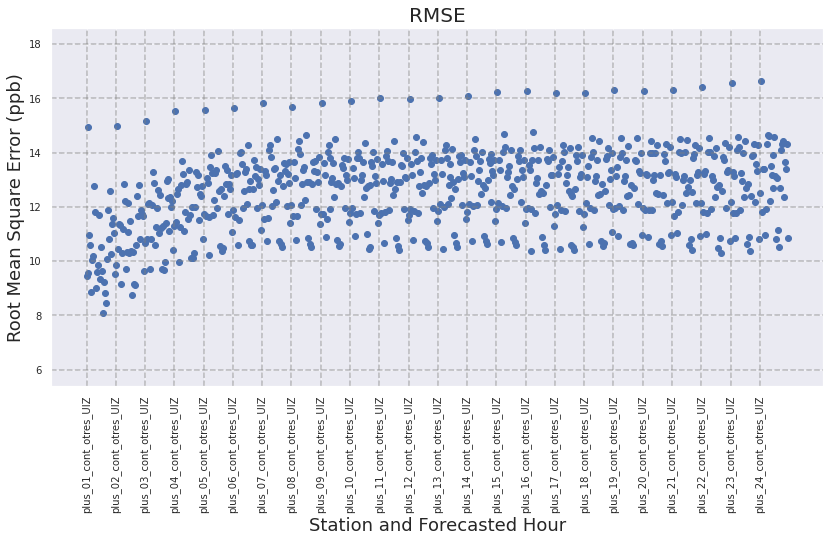

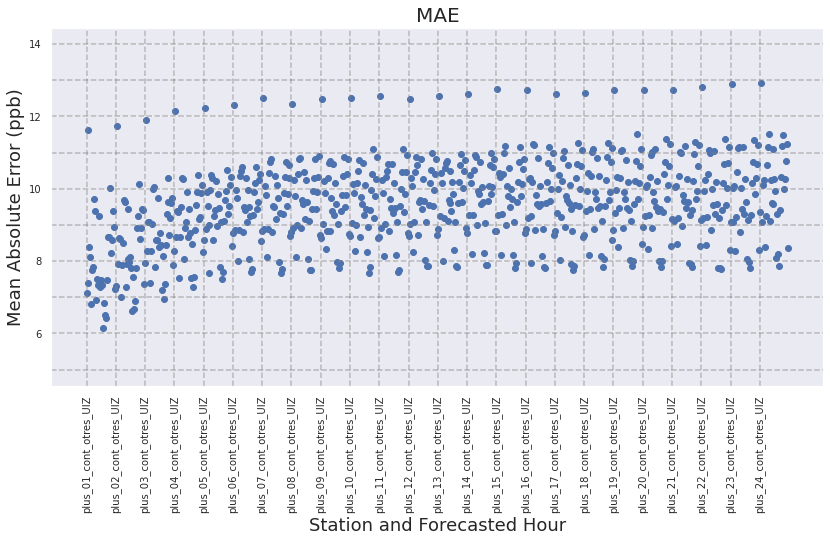

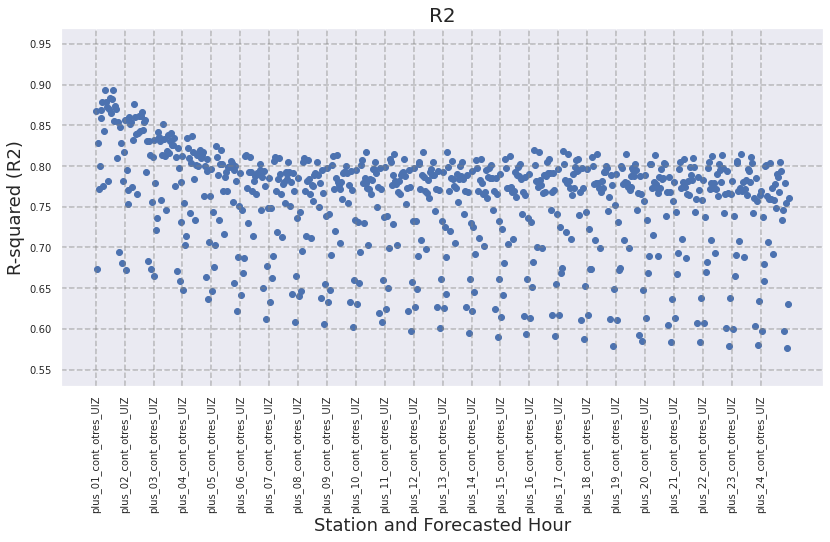

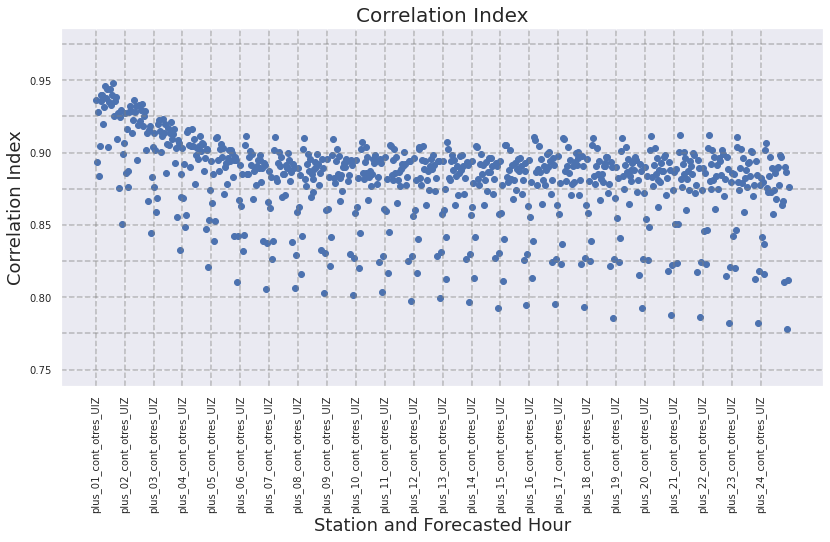

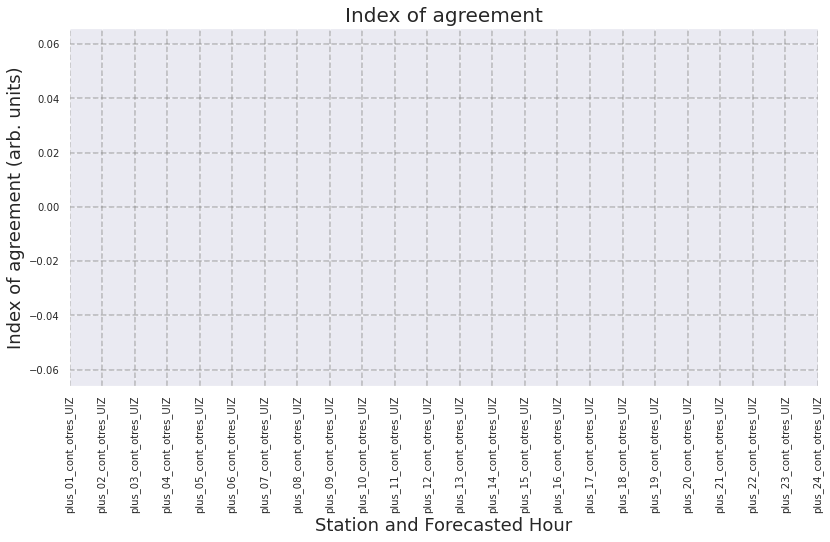

In [48]:
from os.path import join
import matplotlib.pyplot as plt

def scatter_plot_by_column(df, metric, output_folder=None, 
                           show_grid=True, x_label='Station and forecasted hours', 
                           y_label=None, title_str=True, save_fig=True,
                           x_label_fontsize=18, y_label_fontsize=18, 
                           title_fontsize=20, tick_fontsize=14):
    
    plt.figure(figsize=(12, 8))
    plt.scatter(df.index, df[metric])
    
    plt.xlabel(x_label, fontsize=x_label_fontsize)
    plt.ylabel(y_label if y_label else metric, fontsize=y_label_fontsize)
    
    if title_str:
        title_str = f'{metric}'
    else:
        title_str = ''
        
    plt.title(title_str, fontsize=title_fontsize)
    
    x_ticks = df.index[::30]
    x_labels = df['Columna'][::30]
    plt.xticks(x_ticks, x_labels, rotation=90, fontsize=tick_fontsize)
    plt.yticks(fontsize=tick_fontsize)
    
    if show_grid:
        for x in x_ticks:
            plt.axvline(x, color='gray', linestyle='dashed', alpha=0.5)
        plt.grid(True, axis='x', linestyle='dashed', alpha=0.5)
        
        y_ticks = plt.gca().get_yticks()
        for y in y_ticks:
            plt.axhline(y, color='gray', linestyle='dashed', alpha=0.5)
        plt.grid(True, axis='y', linestyle='dashed', alpha=0.5)
    
    plt.tight_layout(pad=2)  # Ajusta el diseño para evitar el recorte
    
    if save_fig and output_folder:
        plt.savefig(join(output_folder, f'scatter_plot_{metric.lower()}.png'), dpi=300)
        
    plt.show()

# Ejemplo de uso para RMSE, MAE, y R2
scatter_plot_by_column(results_df, 'RMSE',
                       output_results_folder_img, 
                       show_grid=True, 
                       x_label='Station and Forecasted Hour', 
                       y_label='Root Mean Square Error (ppb)', 
                       title_str='Root Mean Square Error Across Stations and Forecasted Hours', 
                       save_fig=True,
                       x_label_fontsize=18, 
                       y_label_fontsize=18, 
                       title_fontsize=20, 
                       tick_fontsize=10)

scatter_plot_by_column(results_df, 'MAE',
                       output_results_folder_img, 
                       show_grid=True, 
                       x_label='Station and Forecasted Hour', 
                       y_label='Mean Absolute Error (ppb)', 
                       title_str='Mean Absolute Error Across Stations and Forecasted Hours', 
                       save_fig=True,
                       x_label_fontsize=18, 
                       y_label_fontsize=18, 
                       title_fontsize=20, 
                       tick_fontsize=10)

scatter_plot_by_column(results_df, 'R2',
                       output_results_folder_img, 
                       show_grid=True, 
                       x_label='Station and Forecasted Hour', 
                       y_label='R-squared (R2)', 
                       title_str='R-squared (R2) Across Stations and Forecasted Hours', 
                       save_fig=True,
                       x_label_fontsize=18, 
                       y_label_fontsize=18, 
                       title_fontsize=20, 
                       tick_fontsize=10)

scatter_plot_by_column(results_df, 'Correlation Index',
                output_results_folder_img, 
                show_grid=True, 
                x_label='Station and Forecasted Hour', 
                y_label='Correlation Index', 
                title_str='Correlation Index Across Stations and Forecasted Hours', 
                save_fig=True,
                x_label_fontsize=18, 
                y_label_fontsize=18, 
                title_fontsize=20, 
                tick_fontsize=10)

scatter_plot_by_column(results_df, 'Index of agreement',
                output_results_folder_img, 
                show_grid=True, 
                x_label='Station and Forecasted Hour', 
                y_label='Index of agreement (arb. units)', 
                title_str='Index of Agreement Across Stations and Forecasted Hours', 
                save_fig=True,
                x_label_fontsize=18, 
                y_label_fontsize=18, 
                title_fontsize=20, 
                tick_fontsize=10)

Per station Correlation Index: 0.8809


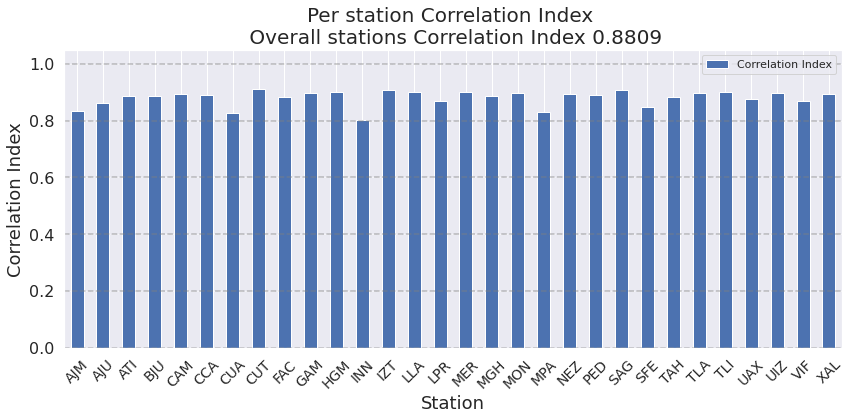

Per station Index of agreement: nan


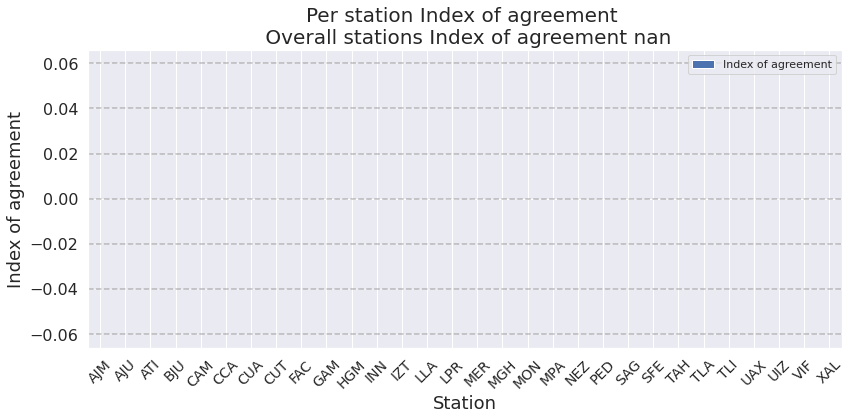

Per station RMSE: 12.5676


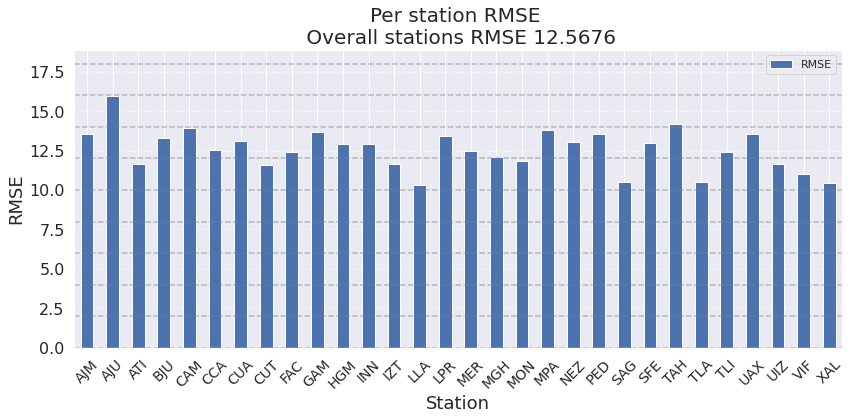

Per station MAE: 9.5403


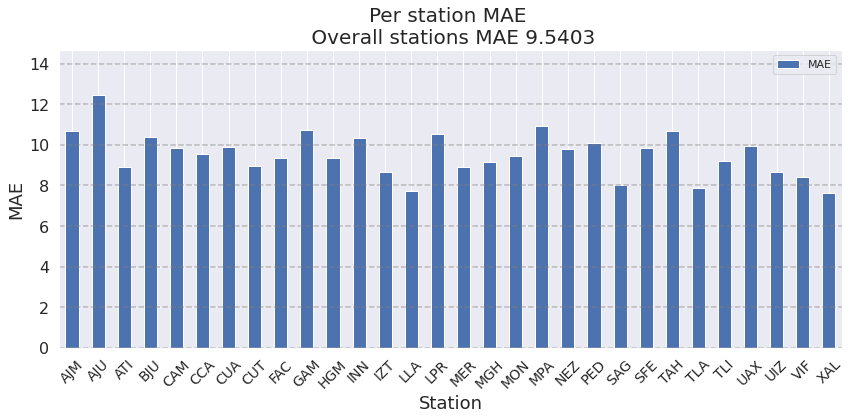

In [49]:
# %% Llamada a función para graficar las métricas de resumen de todas horas por estacion

average_metric(results_df, 'Correlation Index', output_results_folder_img)
average_metric(results_df, 'Index of agreement', output_results_folder_img)
average_metric(results_df, 'RMSE', output_results_folder_img)
average_metric(results_df, 'MAE', output_results_folder_img)

Overall average of Correlation Index across all hours: 0.8809


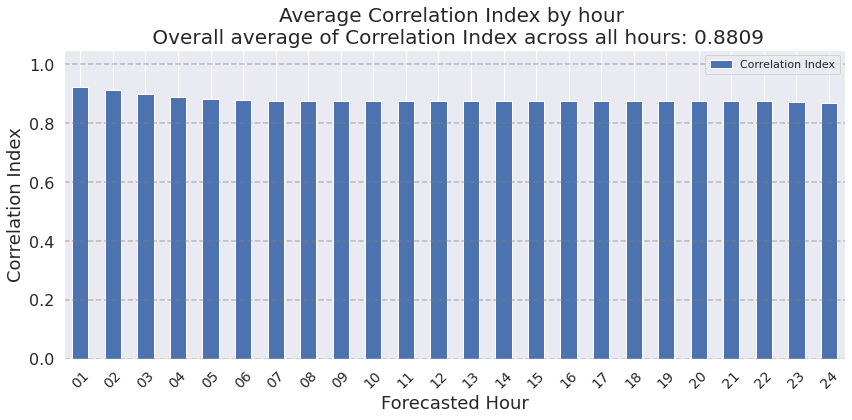

Overall average of Index of agreement across all hours: nan


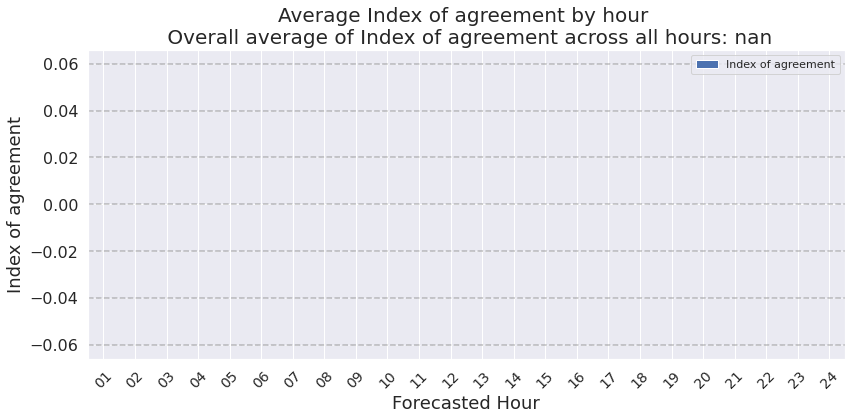

Overall average of RMSE across all hours: 12.5676


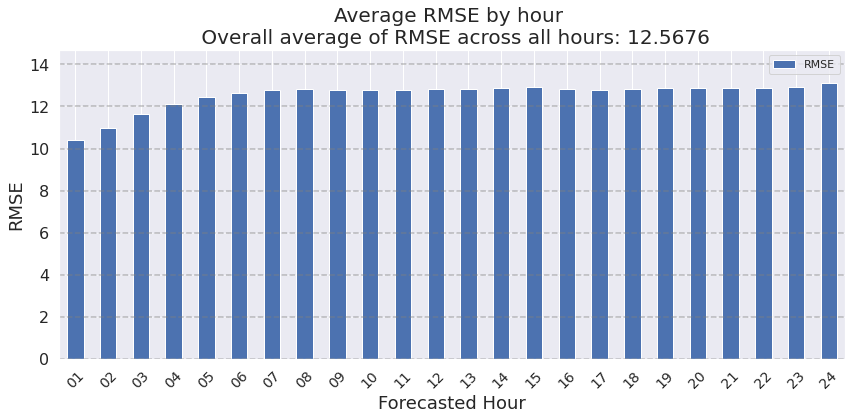

Overall average of MAE across all hours: 9.5403


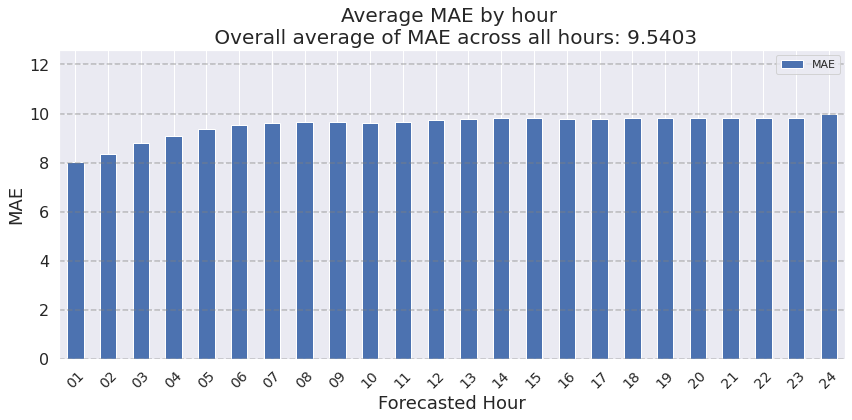

In [50]:
# %% Llamada a función para graficar las métricas de resumen de todas las estaciones por hora
average_metric_by_hour(results_df, 'Correlation Index', output_results_folder_img)
average_metric_by_hour(results_df, 'Index of agreement', output_results_folder_img)
average_metric_by_hour(results_df, 'RMSE', output_results_folder_img)
average_metric_by_hour(results_df, 'MAE', output_results_folder_img)

Overall average of Correlation Index across all hours: 0.8809


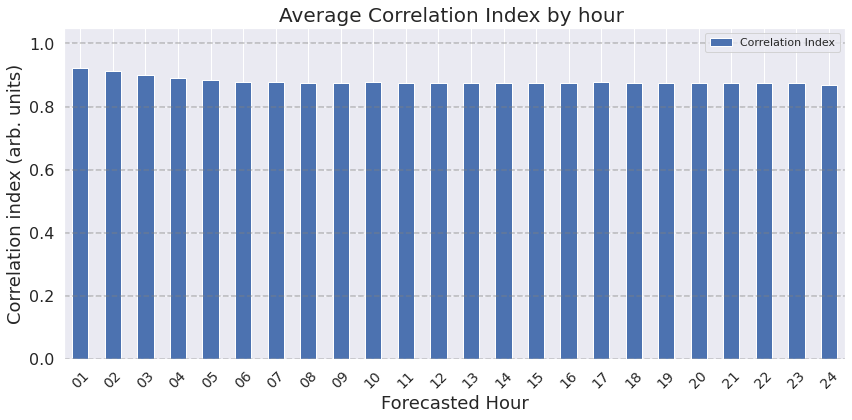

Overall average of Index of agreement across all hours: nan


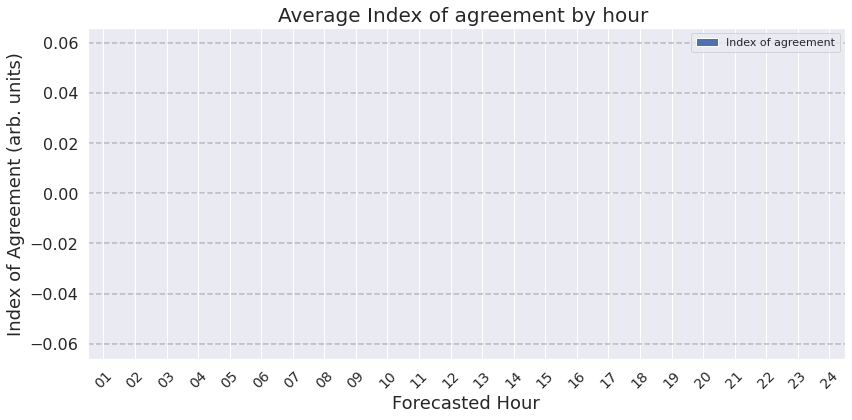

Overall average of RMSE across all hours: 12.5676


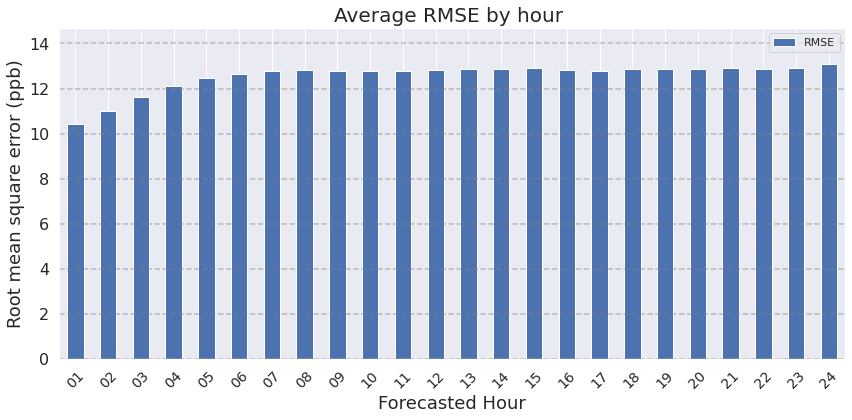

Overall average of MAE across all hours: 9.5403


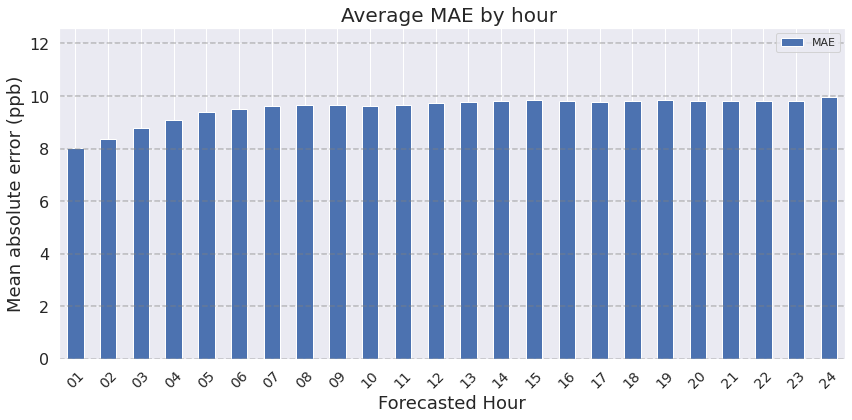

Overall average of R2 across all hours: 0.7568


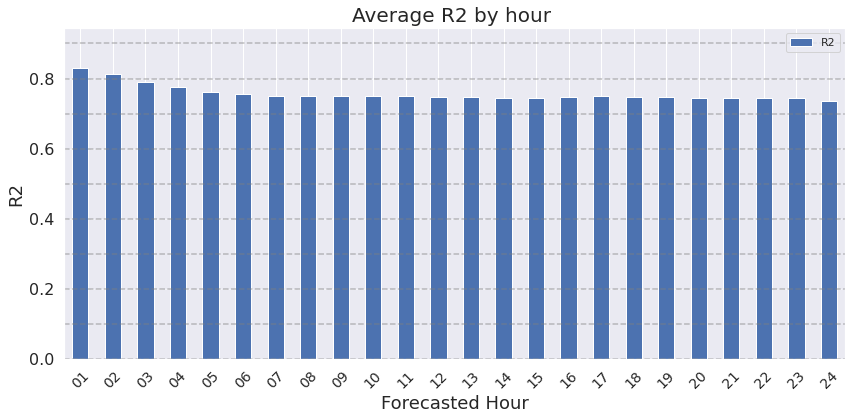

In [51]:
import pandas as pd
from os.path import join
import matplotlib.pyplot as plt

def average_metric_by_hour(results_df, metric, output_results_folder_img=None, 
                           show_grid=True, x_label='Forecasted Hour', y_label=None, 
                           title_suffix='', save_fig=True, title_str=True, 
                           subtitle=True):
    """
    Generate a bar plot for average metrics by hour.
    
    Parameters:
    ...
    """

    # Helper function to calculate average metrics by hour
    def calculate_average_metrics_by_hour(df, key):
        return df[df['Columna'].str.contains(key)][metric].mean()

    hour_keys = sorted(set(results_df['Columna'].apply(lambda x: x.split('_')[1])), 
                       key=lambda x: int(x.split('plus_')[-1]))
    average_metrics = [calculate_average_metrics_by_hour(results_df, key) for key in hour_keys]
    
    # Create DataFrame
    average_metrics_df = pd.DataFrame({x_label: hour_keys, metric: average_metrics})

    # Overall Average
    overall_average_metric = average_metrics_df[metric].mean()
    print(f"Overall average of {metric} across all hours: {overall_average_metric:.4f}")

    # Plotting
    ax = average_metrics_df.plot(x=x_label, y=metric, kind='bar', figsize=(12, 6))

    # Title Handling
    if isinstance(title_str, str):
        pass
    elif title_str:
        title_str = f'Average {metric} by hour {title_suffix}'
    else:
        title_str = ''
    
    if subtitle:
        title_str += f"\n Overall average of {metric} across all hours: {overall_average_metric:.4f}"
    
    ax.set_title(title_str, fontsize=20)
    ax.set_ylabel(y_label if y_label else metric, fontsize=18)
    ax.set_xlabel(x_label, fontsize=18)
    
    if show_grid:
        y_ticks = plt.gca().get_yticks()
        for y in y_ticks:
            plt.axhline(y, color='gray', linestyle='dashed', alpha=0.5)
        plt.grid(True, axis='y', linestyle='dashed', alpha=0.5)
    
    ax.tick_params(axis='x', labelsize=14)
    ax.tick_params(axis='y', labelsize=16)
    
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    if save_fig and output_results_folder_img:
        plt.savefig(join(output_results_folder_img, f'avg_hours_plot_{metric.lower()}.png'), dpi=300)
    
    plt.show()
# %% Llamada a función para graficar las métricas de resumen de todas las estaciones por hora
average_metric_by_hour(results_df, 'Correlation Index', output_results_folder_img, show_grid=True, x_label='Forecasted Hour', y_label='Correlation index (arb. units)',title_str=True,title_suffix='', save_fig=True,subtitle=False)
average_metric_by_hour(results_df, 'Index of agreement', output_results_folder_img, show_grid=True, x_label='Forecasted Hour', y_label='Index of Agreement (arb. units)',title_str=True,title_suffix='', save_fig=True,subtitle=False)
average_metric_by_hour(results_df, 'RMSE', output_results_folder_img, show_grid=True, x_label='Forecasted Hour', y_label='Root mean square error (ppb)',title_str=True,title_suffix='', save_fig=True,subtitle=False)
average_metric_by_hour(results_df, 'MAE', output_results_folder_img, show_grid=True, x_label='Forecasted Hour', y_label='Mean absolute error (ppb)',title_str=True,title_suffix='', save_fig=True,subtitle=False)
average_metric_by_hour(results_df, 'R2', output_results_folder_img, show_grid=True, x_label='Forecasted Hour', y_label='R2',title_str=True,title_suffix='', save_fig=True,subtitle=False)



plus_01_cont_otres_UIZ
Error promedio al comparar valores máximos cada 24 hrs: 4.998422144227109
Desviación estándar de diferencia en valores máximos diarios: 12.42738826684824


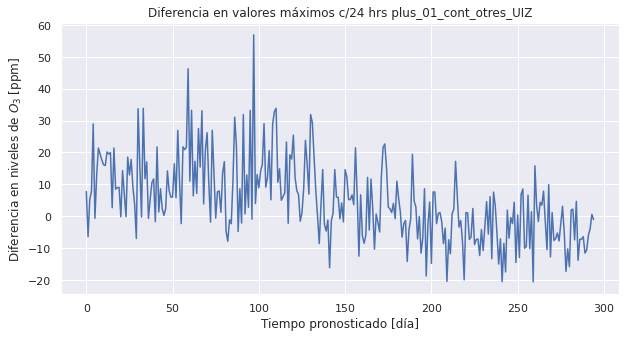

plus_06_cont_otres_UIZ
Error promedio al comparar valores máximos cada 24 hrs: 4.501271503254519
Desviación estándar de diferencia en valores máximos diarios: 17.058492970969926


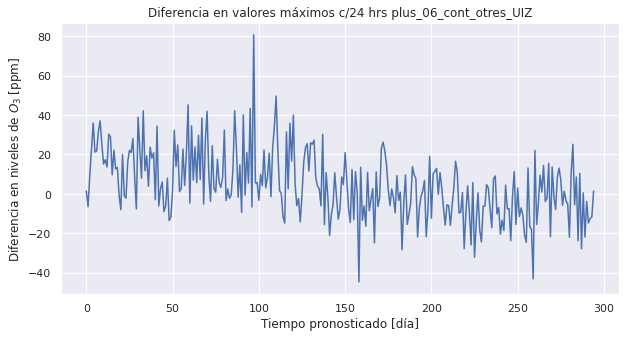

plus_12_cont_otres_UIZ
Error promedio al comparar valores máximos cada 24 hrs: 7.398984526312072
Desviación estándar de diferencia en valores máximos diarios: 15.778194264323178


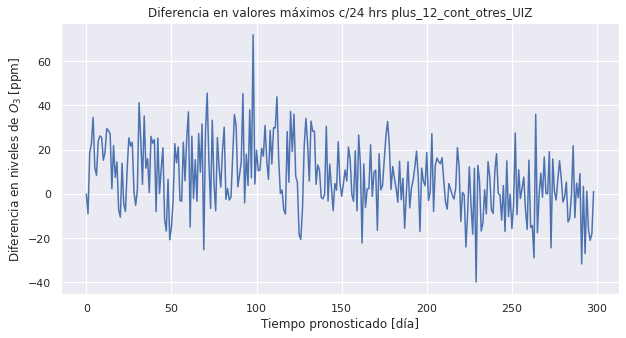

plus_18_cont_otres_UIZ
Error promedio al comparar valores máximos cada 24 hrs: 7.192483982524356
Desviación estándar de diferencia en valores máximos diarios: 16.85538015229221


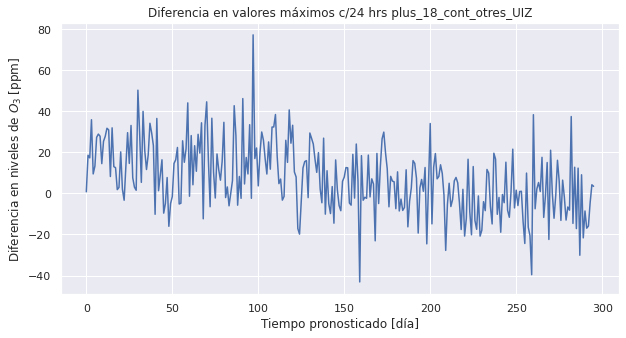

plus_24_cont_otres_UIZ
Error promedio al comparar valores máximos cada 24 hrs: 8.10032563469037
Desviación estándar de diferencia en valores máximos diarios: 17.842632761683543


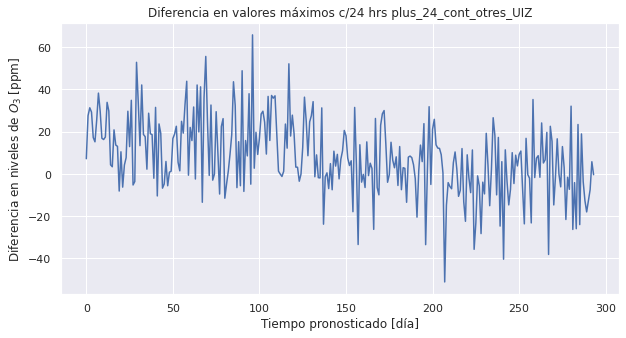

plus_01_cont_otres_AJU
Error promedio al comparar valores máximos cada 24 hrs: 17.586409340077395
Desviación estándar de diferencia en valores máximos diarios: 18.23452213721007


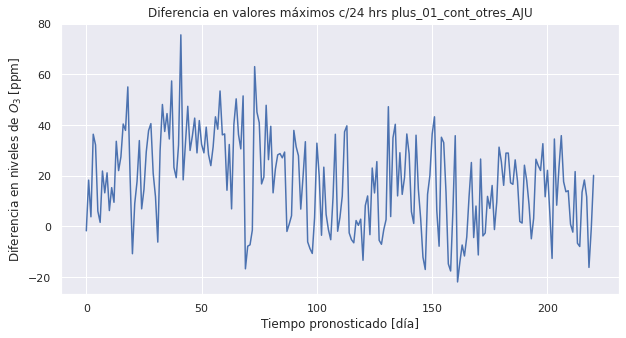

plus_06_cont_otres_AJU
Error promedio al comparar valores máximos cada 24 hrs: 17.268779479705536
Desviación estándar de diferencia en valores máximos diarios: 19.816406324176942


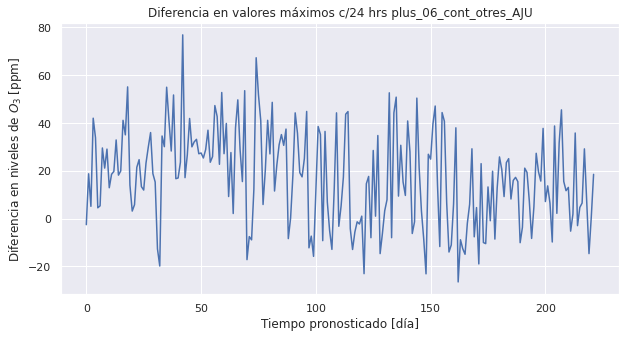

plus_12_cont_otres_AJU
Error promedio al comparar valores máximos cada 24 hrs: 19.61732495797647
Desviación estándar de diferencia en valores máximos diarios: 19.052380683108723


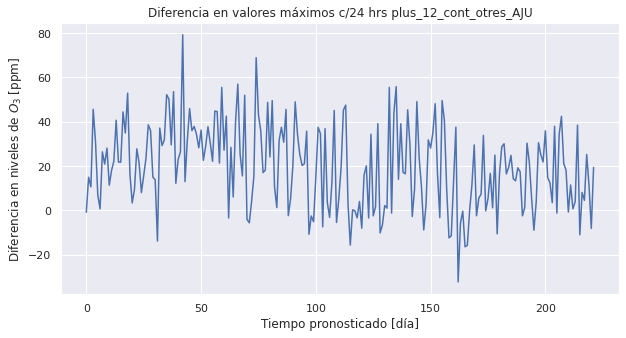

plus_18_cont_otres_AJU
Error promedio al comparar valores máximos cada 24 hrs: 20.05894964430067
Desviación estándar de diferencia en valores máximos diarios: 20.09875769826661


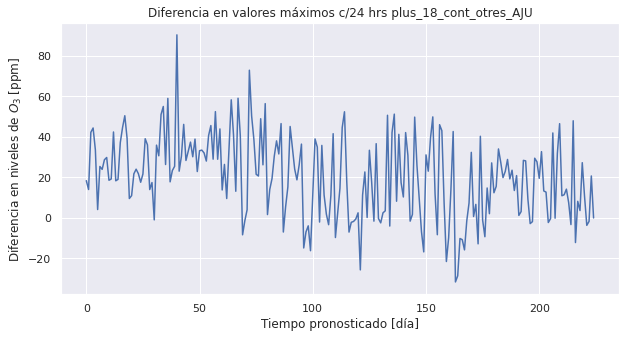

plus_24_cont_otres_AJU
Error promedio al comparar valores máximos cada 24 hrs: 18.786757011936135
Desviación estándar de diferencia en valores máximos diarios: 21.35682668352127


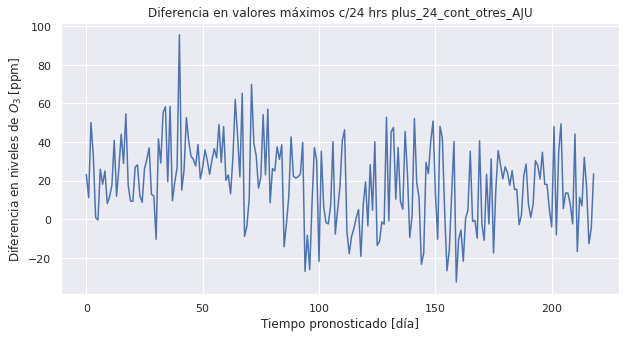

plus_01_cont_otres_ATI
Error promedio al comparar valores máximos cada 24 hrs: -5.129151033632683
Desviación estándar de diferencia en valores máximos diarios: 11.109957142069682


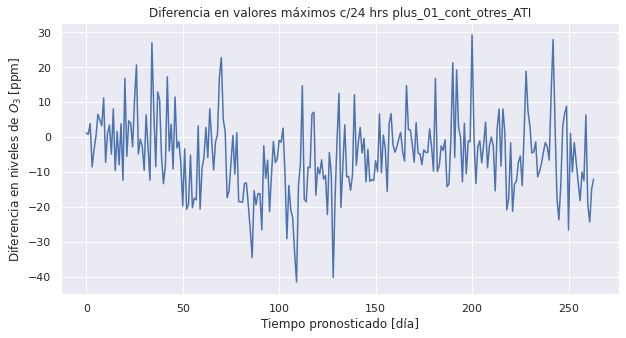

plus_06_cont_otres_ATI
Error promedio al comparar valores máximos cada 24 hrs: -4.700210137474806
Desviación estándar de diferencia en valores máximos diarios: 15.51406774336254


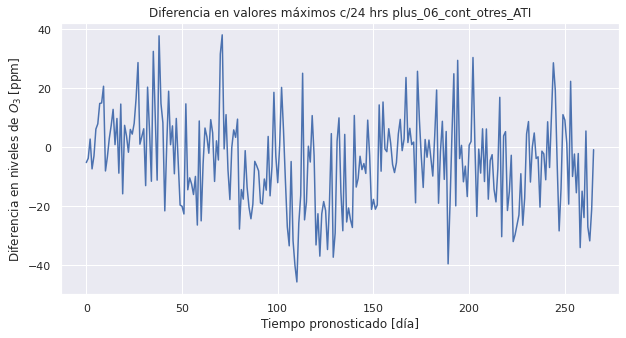

plus_12_cont_otres_ATI
Error promedio al comparar valores máximos cada 24 hrs: -3.320799583779242
Desviación estándar de diferencia en valores máximos diarios: 15.121605542026291


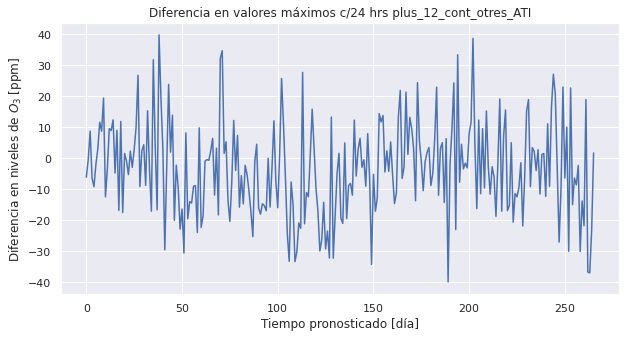

plus_18_cont_otres_ATI
Error promedio al comparar valores máximos cada 24 hrs: -3.8999148242878463
Desviación estándar de diferencia en valores máximos diarios: 14.736732184703273


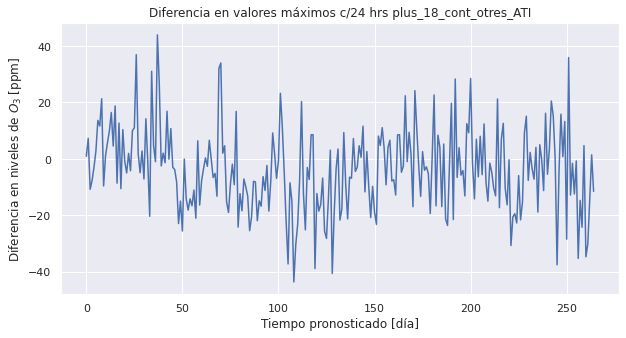

plus_24_cont_otres_ATI
Error promedio al comparar valores máximos cada 24 hrs: -3.532945388218142
Desviación estándar de diferencia en valores máximos diarios: 16.2954444506172


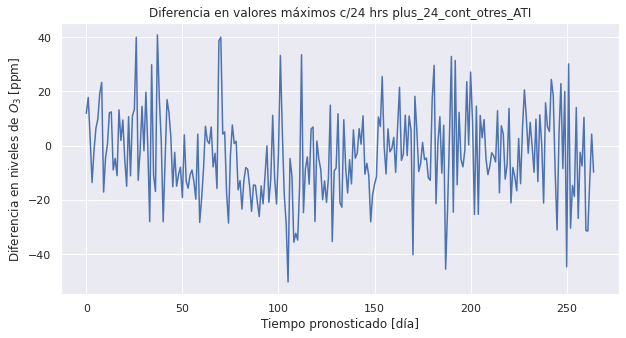

plus_01_cont_otres_UAX
Error promedio al comparar valores máximos cada 24 hrs: -2.5983590592851153
Desviación estándar de diferencia en valores máximos diarios: 18.160769440360454


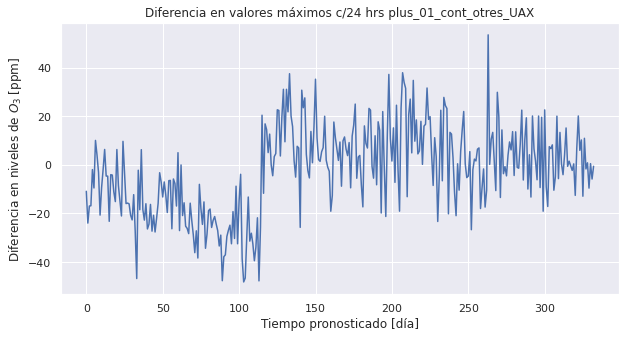

plus_06_cont_otres_UAX
Error promedio al comparar valores máximos cada 24 hrs: -2.944819872964642
Desviación estándar de diferencia en valores máximos diarios: 22.235302268412944


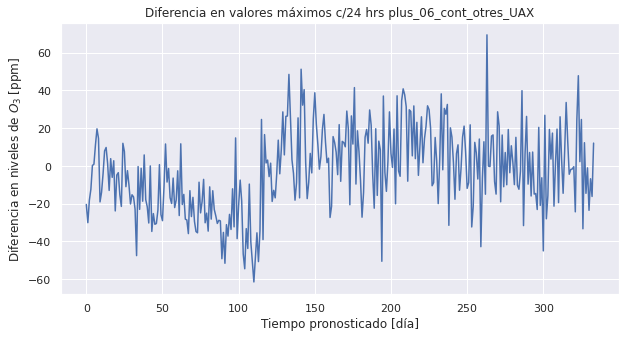

plus_12_cont_otres_UAX
Error promedio al comparar valores máximos cada 24 hrs: 1.3117428393591017
Desviación estándar de diferencia en valores máximos diarios: 21.452149862477473


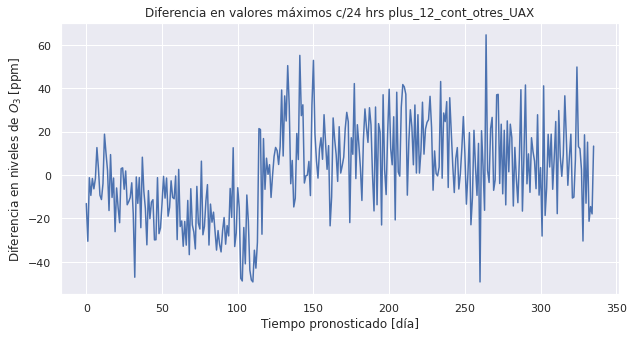

plus_18_cont_otres_UAX
Error promedio al comparar valores máximos cada 24 hrs: -0.42040453186954363
Desviación estándar de diferencia en valores máximos diarios: 21.323003802491982


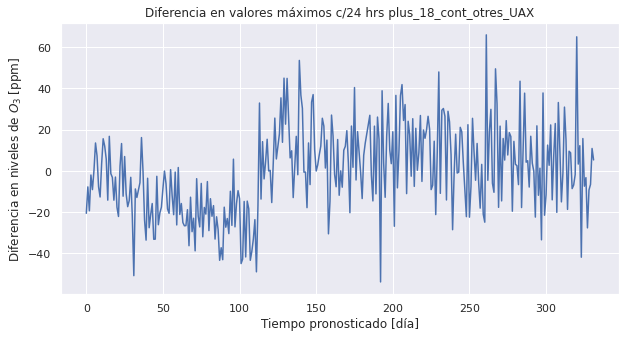

plus_24_cont_otres_UAX
Error promedio al comparar valores máximos cada 24 hrs: 0.9515719903559843
Desviación estándar de diferencia en valores máximos diarios: 22.76848230452815


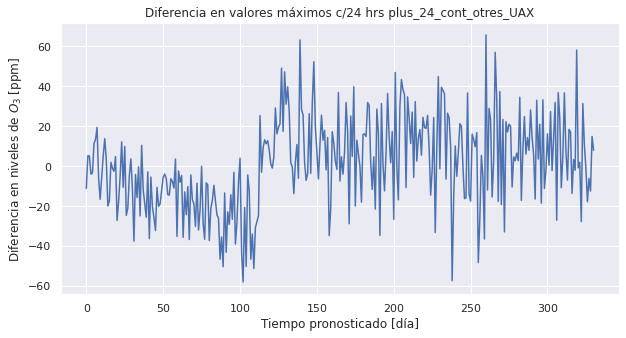

Promedio de h24_max_err_mean: 5.061320931160385
Promedio de h24_max_err_std: 17.861924834172537


In [52]:
# %% Calculo de valores máximos por cada 24 horas. 
# Crear un DataFrame vacío

results_max_df = pd.DataFrame(columns=[
    'max_y_true', 'max_y_pred', 'h24_max_err_mean', 'h24_max_err_std'
])

# Rellenar el DataFrame con los resultados de la función
for cur_column in params_grid:
    print(cur_column)
    max_y_true, max_y_pred, h24_max_err_mean, h24_max_err_std = plot_max_difference(
        cur_column, y_true_df, y_pred_descaled_df)
    results_max_df = results_max_df.append(
        {
            'max_y_true': max_y_true,
            'max_y_pred': max_y_pred,
            'h24_max_err_mean': h24_max_err_mean,
            'h24_max_err_std': h24_max_err_std
        },
        ignore_index=True)

# Calcular el promedio de las cuatro columnas
average_h24_max_err_mean = results_max_df['h24_max_err_mean'].mean()
average_h24_max_err_std = results_max_df['h24_max_err_std'].mean()

print("Promedio de h24_max_err_mean:", average_h24_max_err_mean)
print("Promedio de h24_max_err_std:", average_h24_max_err_std)


In [53]:
# Inicializar nuevas columnas para almacenar los resultados adicionales
results_df['h24_max_err_mean'] = 0.0
results_df['h24_max_err_std'] = 0.0
results_df['h24_mean_err_mean'] = 0.0
results_df['h24_mean_err_std'] = 0.0
errors_dict = {}

# Iterar a través de cada fila en el DataFrame para actualizar las nuevas columnas
for index, row in results_df.iterrows():
    cur_column = row['Columna']
    # Llamar a la función plot_max_and_mean_difference y obtener los resultados
    max_y_true, max_y_pred, h24_max_err_mean, h24_max_err_std, mean_y_true, mean_y_pred, h24_mean_err_mean, h24_mean_err_std = plot_max_and_mean_difference(cur_column, y_true_df, y_pred_descaled_df)
    
    # Actualizar las nuevas columnas con los resultados obtenidos
    results_df.loc[index, 'h24_max_err_mean'] = h24_max_err_mean
    results_df.loc[index, 'h24_max_err_std'] = h24_max_err_std
    results_df.loc[index, 'h24_mean_err_mean'] = h24_mean_err_mean
    results_df.loc[index, 'h24_mean_err_std'] = h24_mean_err_std
    # Almacenar max_y_true, max_y_pred, mean_y_true, y mean_y_pred en el diccionario errors_dict
    errors_dict[cur_column] = {
        'max_y_true': max_y_true,
        'max_y_pred': max_y_pred,
        'mean_y_true': mean_y_true,
        'mean_y_pred': mean_y_pred
    }
# Ahora, results_df debería tener las nuevas columnas llenas con los resultados de la función

plus_01_cont_otres_UIZ
Maximum error mean over 24 hrs: 4.998422144227109
Maximum error std dev over 24 hrs: 12.42738826684824
Mean error mean over 24 hrs: 0.596750082707001
Mean error std dev over 24 hrs: 4.389974561507988
plus_01_cont_otres_AJU
Maximum error mean over 24 hrs: 17.586409340077395
Maximum error std dev over 24 hrs: 18.23452213721007
Mean error mean over 24 hrs: 0.9374238187011734
Mean error std dev over 24 hrs: 6.171589247891838
plus_01_cont_otres_ATI
Maximum error mean over 24 hrs: -5.129151033632683
Maximum error std dev over 24 hrs: 11.109957142069682
Mean error mean over 24 hrs: -3.441873440838824
Mean error std dev over 24 hrs: 3.4410890561963345
plus_01_cont_otres_CUA
Maximum error mean over 24 hrs: 2.37944405635427
Maximum error std dev over 24 hrs: 16.107889898101625
Mean error mean over 24 hrs: 1.9094459018835535
Mean error std dev over 24 hrs: 5.1410317375349885
plus_01_cont_otres_SFE
Maximum error mean over 24 hrs: -2.791813711632885
Maximum error std dev over

plus_04_cont_otres_SFE
Maximum error mean over 24 hrs: -3.1502278250937135
Maximum error std dev over 24 hrs: 19.186797547425577
Mean error mean over 24 hrs: -2.4534170222825393
Mean error std dev over 24 hrs: 5.306545990805872
plus_04_cont_otres_SAG
Maximum error mean over 24 hrs: 5.068300693754166
Maximum error std dev over 24 hrs: 12.42675793981989
Mean error mean over 24 hrs: 0.7519582405134483
Mean error std dev over 24 hrs: 4.259975691662846
plus_04_cont_otres_CUT
Maximum error mean over 24 hrs: 9.193024011239114
Maximum error std dev over 24 hrs: 14.889443469611333
Mean error mean over 24 hrs: -0.3921328962018065
Mean error std dev over 24 hrs: 4.240699017693821
plus_04_cont_otres_PED
Maximum error mean over 24 hrs: 2.610255216370519
Maximum error std dev over 24 hrs: 17.451053453539345
Mean error mean over 24 hrs: 2.1076755301250314
Mean error std dev over 24 hrs: 4.797689997135615
plus_04_cont_otres_TAH
Maximum error mean over 24 hrs: 14.46897483890892
Maximum error std dev ov

plus_07_cont_otres_TLA
Maximum error mean over 24 hrs: 2.776166162921884
Maximum error std dev over 24 hrs: 14.902943053041895
Mean error mean over 24 hrs: 0.5003546173991231
Mean error std dev over 24 hrs: 4.523060150434793
plus_07_cont_otres_MER
Maximum error mean over 24 hrs: 2.727118357426703
Maximum error std dev over 24 hrs: 17.699115804804176
Mean error mean over 24 hrs: 2.0669536957633023
Mean error std dev over 24 hrs: 5.513554868775705
plus_07_cont_otres_XAL
Maximum error mean over 24 hrs: 3.242372410733935
Maximum error std dev over 24 hrs: 14.937544631982286
Mean error mean over 24 hrs: 0.5577312431424994
Mean error std dev over 24 hrs: 5.071766182382488
plus_07_cont_otres_LLA
Maximum error mean over 24 hrs: -0.000327487956424724
Maximum error std dev over 24 hrs: 14.7230540293185
Mean error mean over 24 hrs: -0.06697214679953487
Mean error std dev over 24 hrs: 4.462959253236853
plus_07_cont_otres_TLI
Maximum error mean over 24 hrs: 9.639086778739905
Maximum error std dev o

plus_10_cont_otres_LLA
Maximum error mean over 24 hrs: 4.012966974215074
Maximum error std dev over 24 hrs: 14.454713053191064
Mean error mean over 24 hrs: 0.3940735740417784
Mean error std dev over 24 hrs: 4.623264638964552
plus_10_cont_otres_TLI
Maximum error mean over 24 hrs: 10.196111527884879
Maximum error std dev over 24 hrs: 17.727998867777984
Mean error mean over 24 hrs: 1.3682972972955163
Mean error std dev over 24 hrs: 5.995926535487461
plus_10_cont_otres_UAX
Maximum error mean over 24 hrs: -1.0853323469529874
Maximum error std dev over 24 hrs: 21.622821970774606
Mean error mean over 24 hrs: -2.3680590617550585
Mean error std dev over 24 hrs: 6.708332716869211
plus_10_cont_otres_BJU
Maximum error mean over 24 hrs: 3.5338254674275715
Maximum error std dev over 24 hrs: 19.43272002666266
Mean error mean over 24 hrs: -1.8836996053324806
Mean error std dev over 24 hrs: 7.012532730015099
plus_10_cont_otres_MPA
Maximum error mean over 24 hrs: 14.91136702835389
Maximum error std dev 

plus_13_cont_otres_GAM
Maximum error mean over 24 hrs: 13.489402463181905
Maximum error std dev over 24 hrs: 16.414108451757087
Mean error mean over 24 hrs: -0.1944616315000681
Mean error std dev over 24 hrs: 6.155577132776775
plus_13_cont_otres_IZT
Maximum error mean over 24 hrs: 6.63482697715222
Maximum error std dev over 24 hrs: 15.781808852752775
Mean error mean over 24 hrs: -0.2212410299990659
Mean error std dev over 24 hrs: 5.023810330354369
plus_13_cont_otres_CCA
Maximum error mean over 24 hrs: 5.482172114125798
Maximum error std dev over 24 hrs: 17.15657241318754
Mean error mean over 24 hrs: -1.3146609362591517
Mean error std dev over 24 hrs: 5.54395348987923
plus_13_cont_otres_HGM
Maximum error mean over 24 hrs: 0.18271729975570866
Maximum error std dev over 24 hrs: 18.423559689332905
Mean error mean over 24 hrs: -2.261189918704484
Mean error std dev over 24 hrs: 5.291546295863624
plus_13_cont_otres_LPR
Maximum error mean over 24 hrs: -3.761517559642523
Maximum error std dev o

plus_15_cont_otres_NEZ
Maximum error mean over 24 hrs: 11.718504094631873
Maximum error std dev over 24 hrs: 15.8188737259211
Mean error mean over 24 hrs: 2.50291724913093
Mean error std dev over 24 hrs: 5.383382757594446
plus_15_cont_otres_INN
Maximum error mean over 24 hrs: 10.4319516889725
Maximum error std dev over 24 hrs: 17.052867584019495
Mean error mean over 24 hrs: -1.563454741938743
Mean error std dev over 24 hrs: 6.949241952286525
plus_15_cont_otres_AJM
Maximum error mean over 24 hrs: 2.9594708100699822
Maximum error std dev over 24 hrs: 15.747775524108285
Mean error mean over 24 hrs: -3.5640414500259685
Mean error std dev over 24 hrs: 6.659939307026334
plus_15_cont_otres_VIF
Maximum error mean over 24 hrs: 10.563884421960632
Maximum error std dev over 24 hrs: 14.858706130234921
Mean error mean over 24 hrs: 0.45702817143492414
Mean error std dev over 24 hrs: 5.421331330546137
plus_16_cont_otres_UIZ
Maximum error mean over 24 hrs: 8.372722433070944
Maximum error std dev over 

plus_18_cont_otres_CCA
Maximum error mean over 24 hrs: 4.378682859827963
Maximum error std dev over 24 hrs: 18.42653444067642
Mean error mean over 24 hrs: -1.5717416995027091
Mean error std dev over 24 hrs: 5.387400020064481
plus_18_cont_otres_HGM
Maximum error mean over 24 hrs: -0.7383778242417324
Maximum error std dev over 24 hrs: 18.678335383550984
Mean error mean over 24 hrs: -2.7638605295875927
Mean error std dev over 24 hrs: 5.206841726610823
plus_18_cont_otres_LPR
Maximum error mean over 24 hrs: -5.684951041980776
Maximum error std dev over 24 hrs: 18.733469908660993
Mean error mean over 24 hrs: -5.191441634333955
Mean error std dev over 24 hrs: 6.88418234273757
plus_18_cont_otres_MGH
Maximum error mean over 24 hrs: 1.856973160518689
Maximum error std dev over 24 hrs: 18.43720397424392
Mean error mean over 24 hrs: -2.0437590060162636
Mean error std dev over 24 hrs: 5.692409767022608
plus_18_cont_otres_CAM
Maximum error mean over 24 hrs: 5.158404799068675
Maximum error std dev ov

plus_20_cont_otres_TLI
Maximum error mean over 24 hrs: 6.5841002712191425
Maximum error std dev over 24 hrs: 16.844696377642528
Mean error mean over 24 hrs: 0.4809564108999253
Mean error std dev over 24 hrs: 5.520559883827191
plus_20_cont_otres_UAX
Maximum error mean over 24 hrs: -2.238053270133145
Maximum error std dev over 24 hrs: 21.91051326289652
Mean error mean over 24 hrs: -2.684619072570379
Mean error std dev over 24 hrs: 7.02146000146023
plus_20_cont_otres_BJU
Maximum error mean over 24 hrs: 2.4760389582316082
Maximum error std dev over 24 hrs: 19.178697718598393
Mean error mean over 24 hrs: -2.728377166721556
Mean error std dev over 24 hrs: 6.657714956680019
plus_20_cont_otres_MPA
Maximum error mean over 24 hrs: 14.4438474704338
Maximum error std dev over 24 hrs: 18.40921030197915
Mean error mean over 24 hrs: -0.5299791854796457
Mean error std dev over 24 hrs: 7.870720556764908
plus_20_cont_otres_MON
Maximum error mean over 24 hrs: 5.769343419508501
Maximum error std dev over 

plus_23_cont_otres_AJU
Maximum error mean over 24 hrs: 18.485136990133487
Maximum error std dev over 24 hrs: 21.304713933954957
Mean error mean over 24 hrs: 0.6942410570664314
Mean error std dev over 24 hrs: 6.934654524478934
plus_23_cont_otres_ATI
Maximum error mean over 24 hrs: -4.197615277992105
Maximum error std dev over 24 hrs: 15.583268072601038
Mean error mean over 24 hrs: -4.2419781421715355
Mean error std dev over 24 hrs: 4.845123823082709
plus_23_cont_otres_CUA
Maximum error mean over 24 hrs: 3.9530721713898846
Maximum error std dev over 24 hrs: 20.36487898284339
Mean error mean over 24 hrs: 1.5772413441931024
Mean error std dev over 24 hrs: 6.7071806241414
plus_23_cont_otres_SFE
Maximum error mean over 24 hrs: -1.9038901951002039
Maximum error std dev over 24 hrs: 18.443799864915846
Mean error mean over 24 hrs: -3.3695870483020327
Mean error std dev over 24 hrs: 6.4697867834367075
plus_23_cont_otres_SAG
Maximum error mean over 24 hrs: 8.92296823372404
Maximum error std dev o

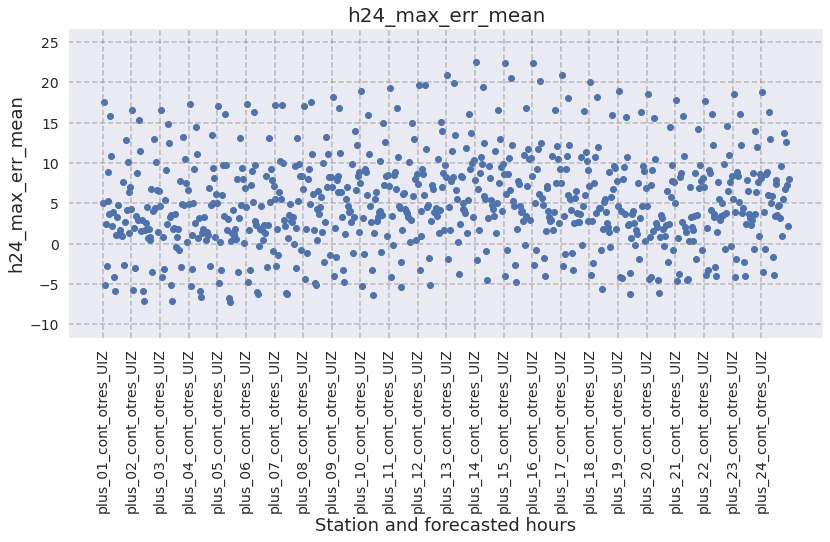

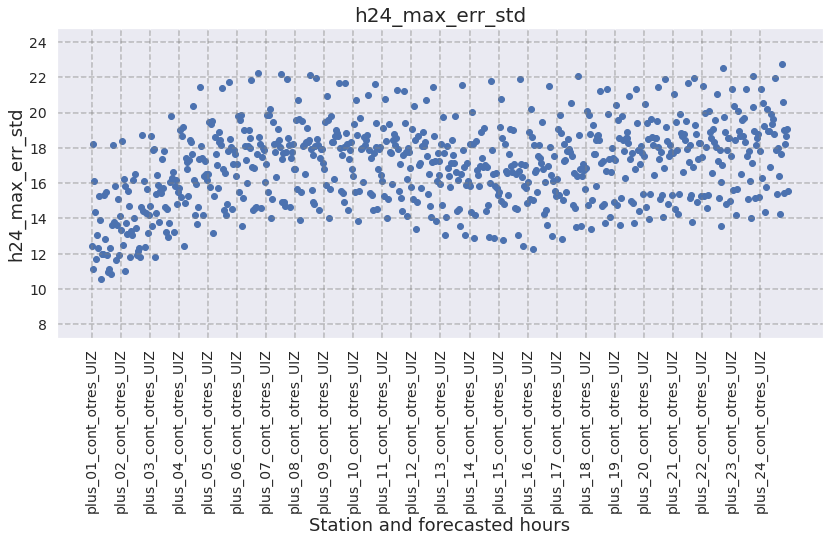

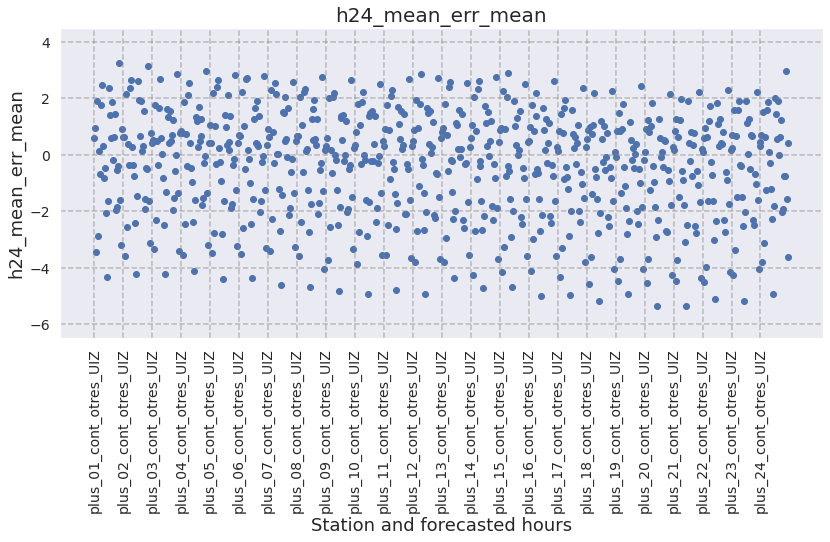

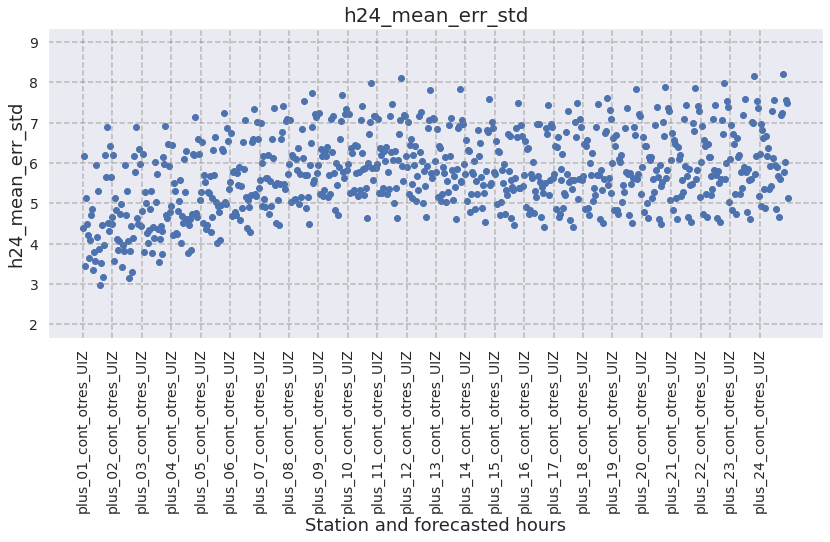

In [54]:
scatter_plot_by_column(results_df, 'h24_max_err_mean',
                output_results_folder_img)
scatter_plot_by_column(results_df, 'h24_max_err_std',
                output_results_folder_img)
scatter_plot_by_column(results_df, 'h24_mean_err_mean',
                output_results_folder_img)
scatter_plot_by_column(results_df, 'h24_mean_err_std',
                output_results_folder_img)

Per station h24_max_err_mean: 5.2093


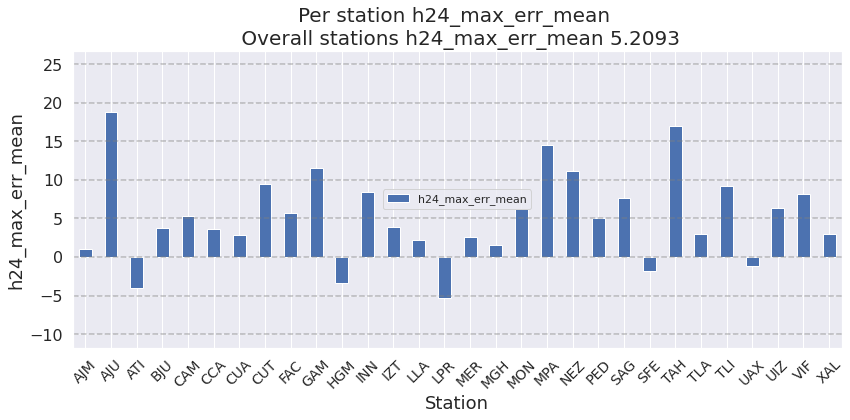

Per station h24_max_err_std: 16.9803


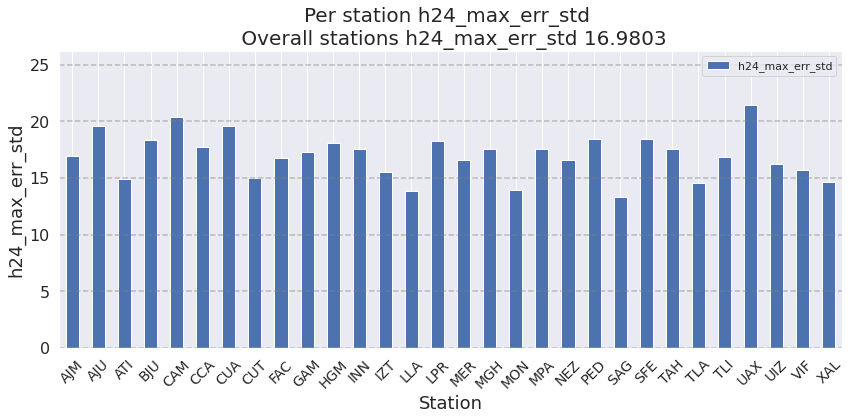

Per station h24_mean_err_mean: -0.4149


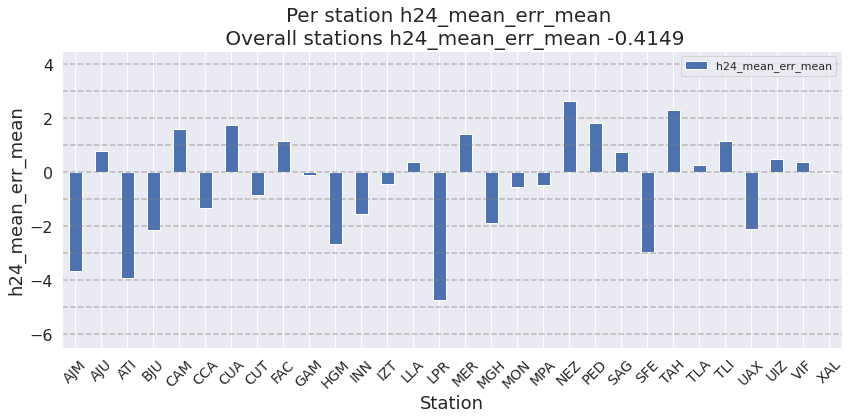

Per station h24_mean_err_std: 5.7490


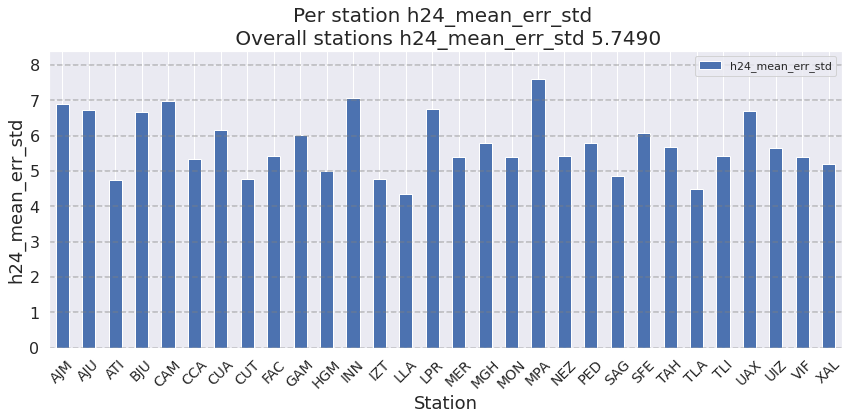

In [55]:
import warnings

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    # Tu código aquí callando warnings
    average_metric(results_df, 'h24_max_err_mean', output_results_folder_img)
    average_metric(results_df, 'h24_max_err_std', output_results_folder_img)
    average_metric(results_df, 'h24_mean_err_mean', output_results_folder_img)
    average_metric(results_df, 'h24_mean_err_std', output_results_folder_img)

Per station average MAE: 9.5403


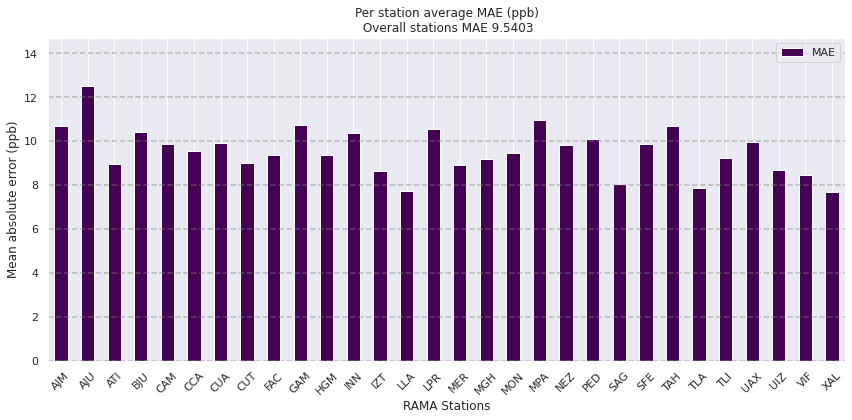

In [56]:
def average_metric(results_df, metric, output_results_folder_img=None, 
                    show_grid=True, x_label='Station', y_label=None, 
                    title_suffix='', save_fig=True, title_str=True,
                    subtitle=True, cmap='viridis'):
    """
    Generate a bar plot for average metrics.
    
    Parameters:
    ...
    """

    # Helper function to calculate average metrics
    def calculate_average_metrics(df, key):
        return df[df['Columna'].str.endswith(key)][metric].mean()

    station_keys = sorted(set(results_df['Columna'].apply(lambda x: x.split('_')[-1])))
    average_metrics = [calculate_average_metrics(results_df, key) for key in station_keys]
    
    # Create DataFrame
    average_metrics_df = pd.DataFrame({x_label: station_keys, metric: average_metrics})

    # Overall Average
    overall_average_metric = average_metrics_df[metric].mean()
    print(f"Per station average {metric}: {overall_average_metric:.4f}")

    # Plotting
    ax = average_metrics_df.plot(x=x_label, y=metric, kind='bar', figsize=(12, 6), colormap=cmap)

    # Title Handling
    if isinstance(title_str, str):
        pass
    elif title_str:
        title_str = f'Per station average {metric} {title_suffix}'
    else:
        title_str = ''
    
    if subtitle:
        title_str += f"\n Overall stations {metric} {overall_average_metric:.4f}"
    
    ax.set_title(title_str)
    ax.set_ylabel(y_label if y_label else metric)
    ax.set_xlabel(x_label)
    
#    if show_grid:
#        ax.grid(True, linestyle='--', linewidth=0.7, alpha=0.7)
    if show_grid:
        y_ticks = plt.gca().get_yticks()  # Obtener los ticks del eje y
        for y in y_ticks:
            plt.axhline(y, color='gray', linestyle='dashed', alpha=0.5)
        plt.grid(True, axis='y', linestyle='dashed', alpha=0.5)  # Agregar grid en el eje y
    
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    if save_fig and output_results_folder_img:
        plt.savefig(join(output_results_folder_img, f'avg_metric_plot_{metric.lower()}.png'), dpi=300)
    
    plt.show()

# Example usage remains the same
# Ejemplo de uso
average_metric(results_df, 'MAE', './output_folder', show_grid=True, x_label='RAMA Stations', y_label='Mean absolute error (ppb)',title_str=True,title_suffix='(ppb)', save_fig=False)
#average_metric(results_df, 'h24_max_err_mean', './output_folder', show_grid=True, x_label='RAMA Stations', y_label='Mean absolute error (ppb)',title_str=True,title_suffix='(ppb)', save_fig=False)



Per station MAE: 9.5403


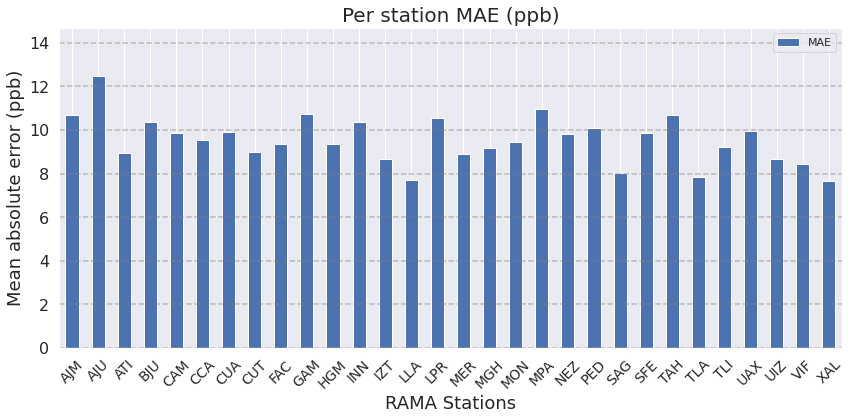

Per station RMSE: 12.5676


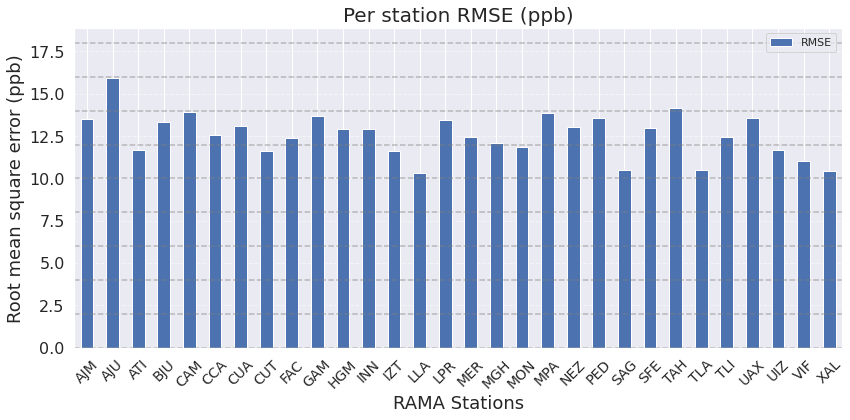

Per station Correlation Index: 0.8809


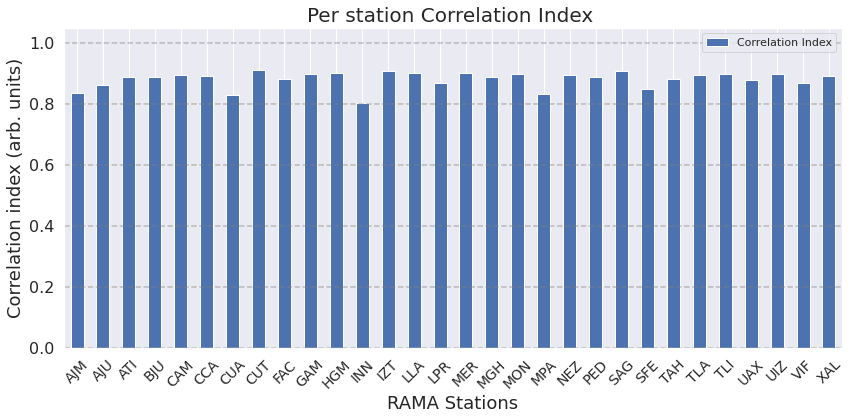

Per station Index of agreement: nan


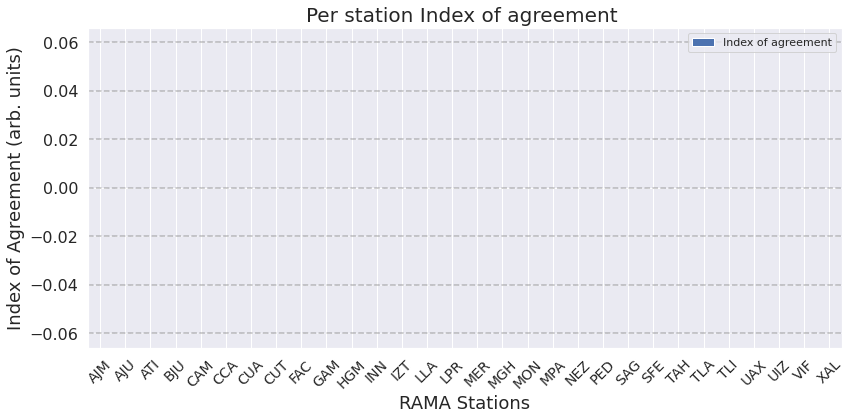

Per station R2: 0.7568


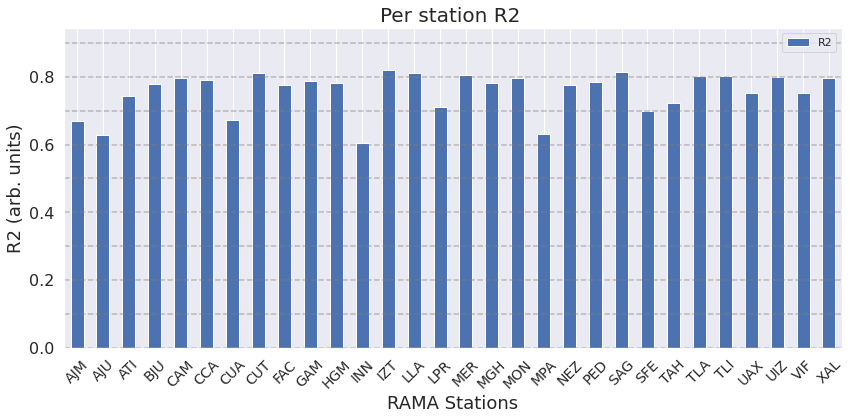

In [57]:
import pandas as pd
from os.path import join
import matplotlib.pyplot as plt

def average_metric(results_df, metric, output_results_folder_img=None, 
                    show_grid=True, x_label='Station', y_label=None, 
                    title_suffix='', save_fig=True, title_str=True,
                    subtitle=True):
    """
    Generate a bar plot for average metrics.
    
    Parameters:
    ...
    """

    # Helper function to calculate average metrics
    def calculate_average_metrics(df, key):
        return df[df['Columna'].str.endswith(key)][metric].mean()

    station_keys = sorted(set(results_df['Columna'].apply(lambda x: x.split('_')[-1])))
    average_metrics = [calculate_average_metrics(results_df, key) for key in station_keys]
    
    # Create DataFrame
    average_metrics_df = pd.DataFrame({x_label: station_keys, metric: average_metrics})

    # Overall Average
    overall_average_metric = average_metrics_df[metric].mean()
    print(f"Per station {metric}: {overall_average_metric:.4f}")

    # Plotting
    ax = average_metrics_df.plot(x=x_label, y=metric, kind='bar', figsize=(12, 6))

    # Title Handling
    if isinstance(title_str, str):
        pass
    elif title_str:
        title_str = f'Per station {metric} {title_suffix}'
    else:
        title_str = ''
    
    if subtitle:
        title_str += f"\n Overall stations {metric} {overall_average_metric:.4f}"
    
    ax.set_title(title_str, fontsize=20)
    ax.set_ylabel(y_label if y_label else metric, fontsize=18)
    ax.set_xlabel(x_label, fontsize=18)
    
    if show_grid:
        y_ticks = plt.gca().get_yticks()  # Obtener los ticks del eje y
        for y in y_ticks:
            plt.axhline(y, color='gray', linestyle='dashed', alpha=0.5)
        plt.grid(True, axis='y', linestyle='dashed', alpha=0.5)  # Agregar grid en el eje y
    
    ax.tick_params(axis='x', labelsize=14)
    ax.tick_params(axis='y', labelsize=16)
    
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    if save_fig and output_results_folder_img:
        plt.savefig(join(output_results_folder_img, f'avg_metric_plot_{metric.lower()}.png'), dpi=300)
    
    plt.show()
# Ejemplo de uso
average_metric(results_df, 'MAE', output_results_folder_img, show_grid=True, x_label='RAMA Stations', y_label='Mean absolute error (ppb)',title_str=True,title_suffix='(ppb)', save_fig=True,subtitle=False)
#average_metric(results_df, 'h24_max_err_mean', './output_folder', show_grid=True, x_label='RAMA Stations', y_label='Mean absolute error (ppb)',title_str=True,title_suffix='(ppb)', save_fig=False)
average_metric(results_df, 'RMSE', output_results_folder_img, show_grid=True, x_label='RAMA Stations', y_label='Root mean square error (ppb)',title_str=True,title_suffix='(ppb)', save_fig=True,subtitle=False)
average_metric(results_df, 'Correlation Index', output_results_folder_img, show_grid=True, x_label='RAMA Stations', y_label='Correlation index (arb. units)',title_str=True,title_suffix='', save_fig=True,subtitle=False)
average_metric(results_df, 'Index of agreement', output_results_folder_img, show_grid=True, x_label='RAMA Stations', y_label='Index of Agreement (arb. units)',title_str=True,title_suffix='', save_fig=True,subtitle=False)
average_metric(results_df, 'R2', output_results_folder_img, show_grid=True, x_label='RAMA Stations', y_label='R2 (arb. units)',title_str=True,title_suffix='', save_fig=True,subtitle=False)


In [58]:
results_df

,Columna,Correlation Index,MAE,MAPE,MSE,RMSE,R2,Index of agreement,h24_max_err_mean,h24_max_err_std,h24_mean_err_mean,h24_mean_err_std
0,plus_01_cont_otres_UIZ,0.936156,7.118227,2.976779e+14,89.398051,9.455054,0.868104,NaN,4.998422,12.427388,0.596750,4.389975
1,plus_01_cont_otres_AJU,0.893209,11.612323,2.873532e+14,222.984055,14.932651,0.673850,NaN,17.586409,18.234522,0.937424,6.171589
2,plus_01_cont_otres_ATI,0.928181,7.391601,1.003184e+15,91.249598,9.552466,0.828155,NaN,-5.129151,11.109957,-3.441873,3.441089
3,plus_01_cont_otres_CUA,0.883675,8.394414,3.908166e-01,120.091363,10.958620,0.771604,NaN,2.379444,16.107890,1.909446,5.141032
4,plus_01_cont_otres_SFE,0.904346,8.120199,1.434481e+14,111.815082,10.574265,0.799840,NaN,-2.791814,14.350823,-2.861705,4.496205
...,...,...,...,...,...,...,...,...,...,...,...,...
715,plus_24_cont_otres_MON,0.890021,9.995342,6.066160e+12,153.231393,12.378667,0.778858,NaN,6.796548,15.418748,-0.750911,5.772188
716,plus_24_cont_otres_NEZ,0.886378,10.266807,9.246081e+12,186.022384,13.639002,0.754519,NaN,12.628558,18.198695,2.956183,6.030788
717,plus_24_cont_otres_INN,0.778344,10.772329,4.597497e-01,179.691898,13.404921,0.575893,NaN,7.299442,18.688914,-1.569142,7.557477
718,plus_24_cont_otres_AJM,0.811592,11.239305,6.257708e-01,205.260524,14.326916,0.630920,NaN,2.161263,19.051209,-3.600168,7.490638


Per station average MAE: 9.5403


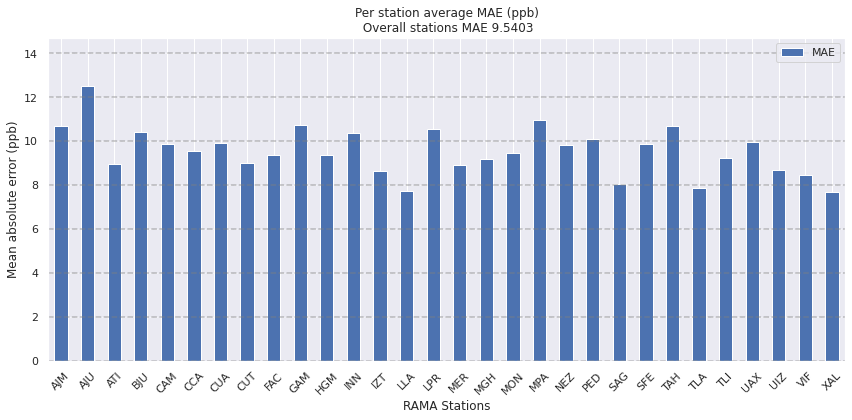

In [59]:
import pandas as pd
from os.path import join
import matplotlib.pyplot as plt

def average_metric(results_df, metric, output_results_folder_img=None, show_grid=True, x_label='Station', y_label=None, title_suffix='', save_fig=True, title_str = True,subtitle=True):
    # Extraer las claves de las estaciones usando split y obtener los valores únicos con un conjunto
    station_keys = sorted(set(results_df['Columna'].apply(lambda x: x.split('_')[-1])))

    # Crear un DataFrame para almacenar las métricas promedio
    average_metrics_df = pd.DataFrame(columns=['Station', metric])

    # Iterar sobre las estaciones y calcular las métricas promedio
    for station in station_keys:
        station_df = results_df[results_df['Columna'].str.endswith(station)]
        average_metric_value = station_df[metric].mean()
        average_metrics_df = average_metrics_df.append({'Station': station, metric: average_metric_value}, ignore_index=True)

    # Calcular el promedio general de la métrica
    overall_average_metric = average_metrics_df[metric].mean()
    print(f"Per station average {metric}: {overall_average_metric:.4f}")

    # Gráfico de barras para las métricas promedio
    average_metrics_df.plot(x='Station', y=metric, kind='bar', figsize=(12, 6))

    if isinstance(title_str, str):
    # Usa el título proporcionado como una cadena
        pass

    elif title_str:  # True pero no una cadena
        title_str = f'Per station average {metric} {title_suffix}'
    else:  # False o None
        title_str = ''

    if subtitle:
        title_str  = title_str + f"\n Overall stations {metric} {overall_average_metric:.4f}"

    plt.title(title_str)
    plt.ylabel(y_label if y_label else metric)
    plt.xlabel(x_label)

    if show_grid:
        y_ticks = plt.gca().get_yticks()  # Obtener los ticks del eje y
        for y in y_ticks:
            plt.axhline(y, color='gray', linestyle='dashed', alpha=0.5)
        plt.grid(True, axis='y', linestyle='dashed', alpha=0.5)  # Agregar grid en el eje y

    plt.xticks(rotation=45)
    plt.tight_layout()
    
    if save_fig:
        if output_results_folder_img:
            plt.savefig(join(output_results_folder_img, f'avg_metric_plot_{metric.lower()}.png'), dpi=300)
    plt.show()

# Ejemplo de uso
average_metric(results_df, 'MAE', './output_folder', show_grid=True, x_label='RAMA Stations', y_label='Mean absolute error (ppb)',title_str=True,title_suffix='(ppb)', save_fig=False)
#average_metric(results_df, 'h24_max_err_mean', './output_folder', show_grid=True, x_label='RAMA Stations', y_label='Mean absolute error (ppb)',title_str=True,title_suffix='(ppb)', save_fig=False)



Overall average of h24_max_err_mean across all hours: 5.2093


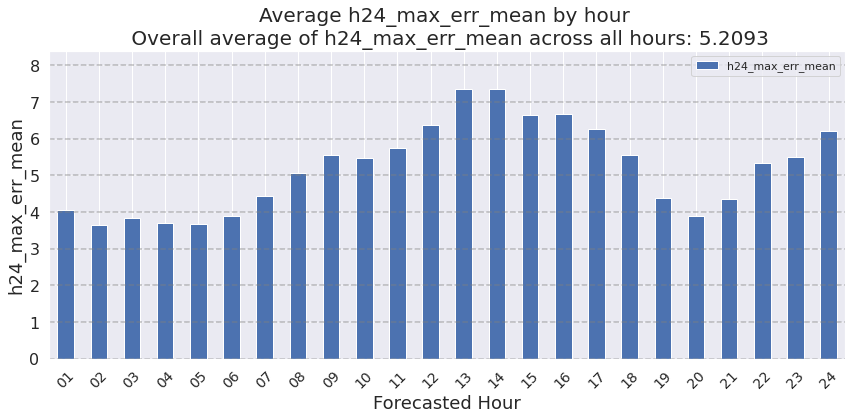

Overall average of h24_max_err_std across all hours: 16.9803


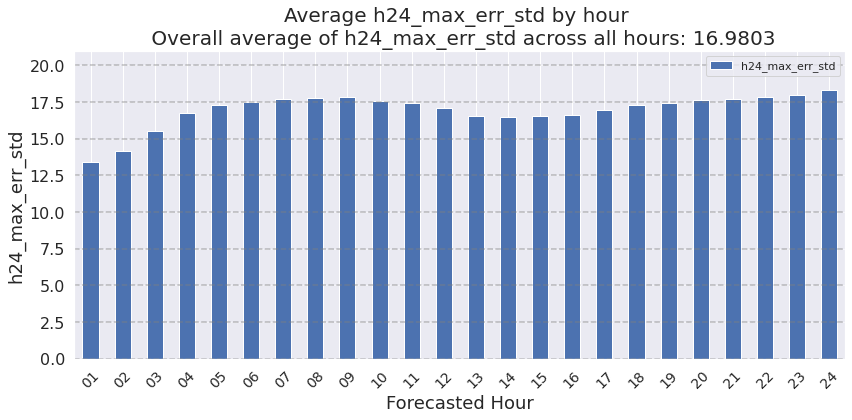

Overall average of h24_mean_err_mean across all hours: -0.4149


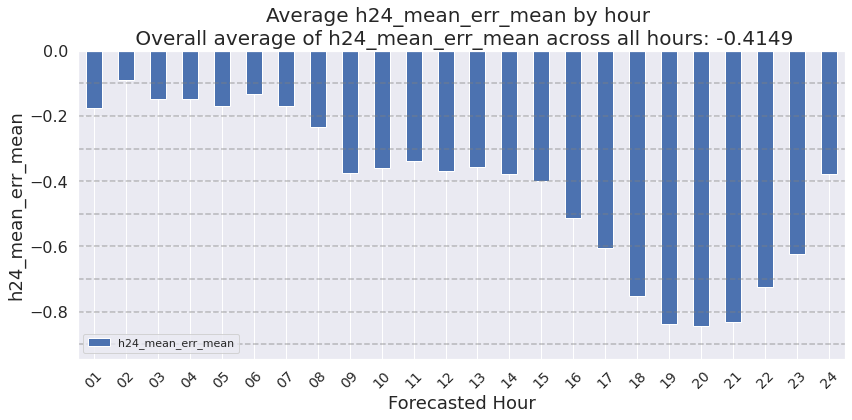

Overall average of h24_mean_err_std across all hours: 5.7490


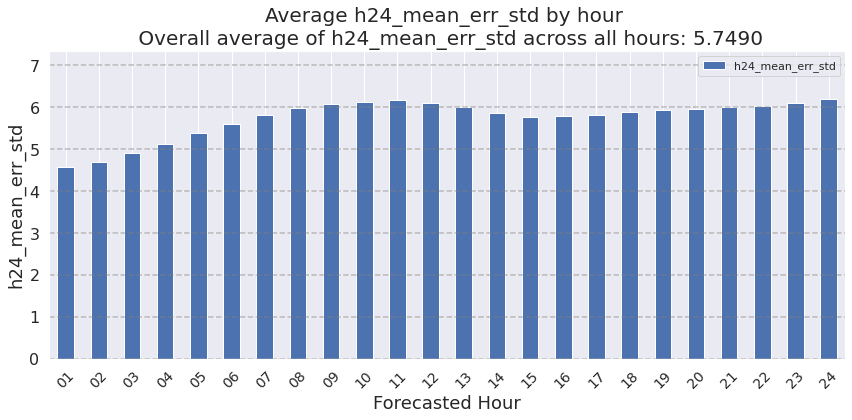

In [60]:

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    # Tu código aquí callando warnings
    average_metric_by_hour(results_df, 'h24_max_err_mean', output_results_folder_img)
    average_metric_by_hour(results_df, 'h24_max_err_std', output_results_folder_img)
    average_metric_by_hour(results_df, 'h24_mean_err_mean', output_results_folder_img)
    average_metric_by_hour(results_df, 'h24_mean_err_std', output_results_folder_img)

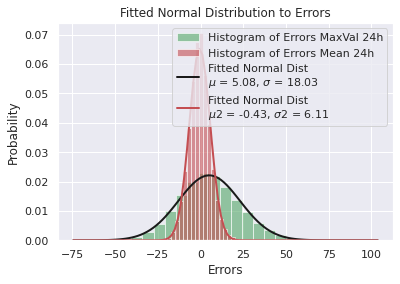

In [61]:
# Case for overall h24_max_err of the model

import numpy as np

from scipy.stats import norm


overall_errors = []

# Loop over the dictionary keys and values

for columna, values in errors_dict.items():

    max_y_true = values['max_y_true']

    max_y_pred = values['max_y_pred']

    errors = max_y_true - max_y_pred

    # Filtering out zeros

    for error in errors:

        if error != 0:

            overall_errors.append(error)


# Convert to numpy array for easier statistical analysis

overall_errors = np.array(overall_errors)


# Fit a normal distribution to the errors data

mu, std = norm.fit(overall_errors)


# Create a histogram of the errors

plt.hist(overall_errors, bins=25, density=True, alpha=0.6, color='g', label="Histogram of Errors MaxVal 24h")


# Create a PDF of the normal distribution

xmin, xmax = plt.xlim()

x = np.linspace(xmin, xmax, 100)

p = norm.pdf(x, mu, std)

overall_errors2 = []

# Loop over the dictionary keys and values

for columna, values in errors_dict.items():

    max_y_true = values['mean_y_true']

    max_y_pred = values['mean_y_pred']

    errors = max_y_true - max_y_pred

    # Filtering out zeros

    for error in errors:

        if error != 0:

            overall_errors2.append(error)


# Convert to numpy array for easier statistical analysis

overall_errors2 = np.array(overall_errors2)

plt.hist(overall_errors2, bins=25, density=True, alpha=0.6, color='r', label="Histogram of Errors Mean 24h")

mu2, std2 = norm.fit(overall_errors2)
p2 = norm.pdf(x, mu2, std2)


plt.plot(x, p, 'k', linewidth=2, label=f"Fitted Normal Dist\n$\mu$ = {mu:.2f}, $\sigma$ = {std:.2f}")
plt.plot(x, p2, 'r', linewidth=2, label=f"Fitted Normal Dist\n$\mu2$ = {mu2:.2f}, $\sigma2$ = {std2:.2f}")


plt.xlabel("Errors")

plt.ylabel("Probability")

plt.title("Fitted Normal Distribution to Errors")

plt.legend()

plt.show()

#mean_np, std_np, mu, std

In [62]:
# Overall values of results for the model
overall = results_df.mean()
print(overall)


Correlation Index     8.809097e-01
MAE                   9.540290e+00
MAPE                  1.647712e+14
MSE                   1.600283e+02
RMSE                  1.256765e+01
R2                    7.567871e-01
Index of agreement             NaN
h24_max_err_mean      5.209274e+00
h24_max_err_std       1.698025e+01
h24_mean_err_mean    -4.149484e-01
h24_mean_err_std      5.749001e+00
dtype: float64
